In [32]:
!pip install tensorflow
!pip install sklearn
!pip install -U efficientnet

     |████████████████████████████████| 50 kB 3.8 MB/s eta 0:00:01


# Libraries

In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
#from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
#from keras.applications.resnet50 import ResNet50
#from keras.applications.resnet50 import preprocess_input
import keras
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, Sequential
from keras.utils import to_categorical
from tensorflow.keras.layers import *
from sklearn.metrics import confusion_matrix, classification_report
import itertools

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.optimizers import RMSprop
import efficientnet.keras as efn
from keras.activations import sigmoid

from tensorflow.keras import models
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model

from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import DenseNet121

from skimage.color import rgb2hsv

2024-05-09 17:06:38.137682: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-09 17:06:38.435526: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-09 17:06:39.619506: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-09 17:06:41.691708: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Dataset 2

In [2]:
IMG_SIZE = (512, 512)
NUM_CLASSES = 5

## convert files to lists

In [3]:
Path_data = 'Lab 2 Dataset/colored_images'
data = os.listdir(Path_data)
Healthy = os.listdir('Lab 2 Dataset/colored_images/No_DR')
Mild = os.listdir('Lab 2 Dataset/colored_images/Mild')
Moderate = os.listdir('Lab 2 Dataset/colored_images/Moderate')
Proliferate = os.listdir('Lab 2 Dataset/colored_images/Proliferate_DR')
Severe = os.listdir('Lab 2 Dataset/colored_images/Severe')

In [4]:
print("classes names :", (data), "\n______________________________\n")
print("Number of classes :", len(data), "\n______________________________\n")
print("Number of Healty images :", len(Healthy), "\n______________________________\n")
print("Number of Mild images :", len(Mild),  "\n______________________________\n")
print("Number of Moderate images :", len(Moderate),  "\n______________________________\n")
print("Number of Proliferate images :", len(Proliferate),  "\n______________________________\n")
print("Number of severe images :", len(Severe),  "\n______________________________\n")

classes names : ['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe', '.ipynb_checkpoints'] 
______________________________

Number of classes : 6 
______________________________

Number of Healty images : 1805 
______________________________

Number of Mild images : 370 
______________________________

Number of Moderate images : 999 
______________________________

Number of Proliferate images : 295 
______________________________

Number of severe images : 194 
______________________________



## Clahe Preprocessing
(After running this cell, Only run below cells marked with Clahe images tag)

In [ ]:
import cv2
import os

# Define the CLAHE parameters
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Input paths
dataset_directory = "Lab 2 Dataset/colored_images"
Mild_directory = os.path.join(dataset_directory, "Mild")
Moderate_directory = os.path.join(dataset_directory, "Moderate")
No_directory = os.path.join(dataset_directory, "No_DR")
Proliferate_directory = os.path.join(dataset_directory, "Proliferate_DR")
Severe_directory = os.path.join(dataset_directory, "Severe")

# Output paths
output_directory ="Lab 2 Dataset/clahe_images"
Mild_output_directory = os.path.join(output_directory, "Mild")
Moderate_output_directory = os.path.join(output_directory, "Moderate")
No_output_directory = os.path.join(output_directory, "No_DR")
Proliferate_output_directory = os.path.join(output_directory, "Proliferate_DR")
Severe_output_directory = os.path.join(output_directory, "Severe")

# Create the output directories if they don't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
if not os.path.exists(Mild_output_directory):
    os.makedirs(Mild_output_directory)
if not os.path.exists(Moderate_output_directory):
    os.makedirs(Moderate_output_directory)
if not os.path.exists(No_output_directory):
    os.makedirs(No_output_directory)
if not os.path.exists(Proliferate_output_directory):
    os.makedirs(Proliferate_output_directory)
if not os.path.exists(Severe_output_directory):
    os.makedirs(Severe_output_directory)

# Process images in colored images
#1. Mild
for filename in os.listdir(Mild_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Mild_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply CLAHE
        image_clahe = clahe.apply(image)

        # Save the CLAHE processed image
        output_path = os.path.join(Mild_output_directory, filename)
        cv2.imwrite(output_path, image_clahe)
        
#2. Moderate
for filename in os.listdir(Moderate_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Moderate_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply CLAHE
        image_clahe = clahe.apply(image)

        # Save the CLAHE processed image
        output_path = os.path.join(Moderate_output_directory, filename)
        cv2.imwrite(output_path, image_clahe)

#3. No_DR
for filename in os.listdir(No_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(No_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply CLAHE
        image_clahe = clahe.apply(image)

        # Save the CLAHE processed image
        output_path = os.path.join(No_output_directory, filename)
        cv2.imwrite(output_path, image_clahe)

#4. Proliferate_DR
for filename in os.listdir(Proliferate_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Proliferate_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply CLAHE
        image_clahe = clahe.apply(image)

        # Save the CLAHE processed image
        output_path = os.path.join(Proliferate_output_directory, filename)
        cv2.imwrite(output_path, image_clahe)

#5. Severe
for filename in os.listdir(Severe_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Severe_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply CLAHE
        image_clahe = clahe.apply(image)

        # Save the CLAHE processed image
        output_path = os.path.join(Severe_output_directory, filename)
        cv2.imwrite(output_path, image_clahe)


## Gaussian Blur Preprocessing

In [5]:
import cv2
import os

kernel_size=(5, 5)

# Input paths
dataset_directory = "Lab 2 Dataset/colored_images"
Mild_directory = os.path.join(dataset_directory, "Mild")
Moderate_directory = os.path.join(dataset_directory, "Moderate")
No_directory = os.path.join(dataset_directory, "No_DR")
Proliferate_directory = os.path.join(dataset_directory, "Proliferate_DR")
Severe_directory = os.path.join(dataset_directory, "Severe")

# Output paths
output_directory ="Lab 2 Dataset/gaussian_images"
Mild_output_directory = os.path.join(output_directory, "Mild")
Moderate_output_directory = os.path.join(output_directory, "Moderate")
No_output_directory = os.path.join(output_directory, "No_DR")
Proliferate_output_directory = os.path.join(output_directory, "Proliferate_DR")
Severe_output_directory = os.path.join(output_directory, "Severe")

# Create the output directories if they don't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
if not os.path.exists(Mild_output_directory):
    os.makedirs(Mild_output_directory)
if not os.path.exists(Moderate_output_directory):
    os.makedirs(Moderate_output_directory)
if not os.path.exists(No_output_directory):
    os.makedirs(No_output_directory)
if not os.path.exists(Proliferate_output_directory):
    os.makedirs(Proliferate_output_directory)
if not os.path.exists(Severe_output_directory):
    os.makedirs(Severe_output_directory)

# Process images in colored images
#1. Mild
for filename in os.listdir(Mild_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Mild_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply gaussian blur
        blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

        # Save the gaussian processed image
        output_path = os.path.join(Mild_output_directory, filename)
        cv2.imwrite(output_path, blurred_image)
        
#2. Moderate
for filename in os.listdir(Moderate_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Moderate_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply gaussian blur
        blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

        # Save the gaussian processed image
        output_path = os.path.join(Moderate_output_directory, filename)
        cv2.imwrite(output_path, blurred_image)

#3. No_DR
for filename in os.listdir(No_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(No_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply gaussian blur
        blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

        # Save the gaussian processed image
        output_path = os.path.join(No_output_directory, filename)
        cv2.imwrite(output_path, blurred_image)

#4. Proliferate_DR
for filename in os.listdir(Proliferate_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Proliferate_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply gaussian blur
        blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

        # Save the gaussian processed image
        output_path = os.path.join(Proliferate_output_directory, filename)
        cv2.imwrite(output_path, blurred_image)

#5. Severe
for filename in os.listdir(Severe_directory):
    if filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(Severe_directory, filename)
        image = cv2.imread(image_path, 0)  # Load as grayscale image

        # Apply gaussian blur
        blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

        # Save the gaussian processed image
        output_path = os.path.join(Severe_output_directory, filename)
        cv2.imwrite(output_path, blurred_image)


## Create a dataframe

### Original Images

In [3]:
# Get Paths

Path_data = 'Lab 2 Dataset/colored_images'

# Create two lists to store paths of images and their labels

imgpaths = []
labels =[]


# Convert directory to list

data = os.listdir(Path_data)

# Get paths and Labels of classes and images in data 

for i in data:
    classpath = os.path.join(Path_data, i)
    imglist = os.listdir(classpath)
    
    for img in imglist:
        imgpath = os.path.join(classpath, img)
        
        imgpaths.append(imgpath)
        labels.append(i)


# Convert two lists of imgpaths and their labels into series

Paths = pd.Series(imgpaths, name = 'Paths')
Labels = pd.Series(labels, name = 'Labels')

# Concatenate them in one Dataframe called Tr_data

Df= pd.concat([Paths, Labels], axis = 1)
Df.head(5)

,Paths,Labels
0,Lab 2 Dataset/colored_images/Mild/0024cdab0c1e...,Mild
1,Lab 2 Dataset/colored_images/Mild/00cb6555d108...,Mild
2,Lab 2 Dataset/colored_images/Mild/0124dffecf29...,Mild
3,Lab 2 Dataset/colored_images/Mild/01b3aed3ed4c...,Mild
4,Lab 2 Dataset/colored_images/Mild/0369f3efe69b...,Mild


### Clahe Images

In [4]:
# Get Paths

Path_data_clahe = 'Lab 2 Dataset/clahe_images'

# Create two lists to store paths of images and their labels

imgpaths = []
labels =[]


# Convert directory to list

data = os.listdir(Path_data_clahe)

# Get paths and Labels of classes and images in data 

for i in data:
    classpath = os.path.join(Path_data_clahe, i)
    imglist = os.listdir(classpath)
    
    for img in imglist:
        imgpath = os.path.join(classpath, img)
        
        imgpaths.append(imgpath)
        labels.append(i)


# Convert two lists of imgpaths and their labels into series

Paths = pd.Series(imgpaths, name = 'Paths')
Labels = pd.Series(labels, name = 'Labels')

# Concatenate them in one Dataframe called Tr_data

Df_clahe= pd.concat([Paths, Labels], axis = 1)
Df_clahe.head(5)

,Paths,Labels
0,Lab 2 Dataset/clahe_images/Mild/0024cdab0c1e.png,Mild
1,Lab 2 Dataset/clahe_images/Mild/00cb6555d108.png,Mild
2,Lab 2 Dataset/clahe_images/Mild/0124dffecf29.png,Mild
3,Lab 2 Dataset/clahe_images/Mild/01b3aed3ed4c.png,Mild
4,Lab 2 Dataset/clahe_images/Mild/0369f3efe69b.png,Mild


### Gaussian Images

In [5]:
# Get Paths

Path_data_gaussian = 'Lab 2 Dataset/gaussian_images'

# Create two lists to store paths of images and their labels

imgpaths = []
labels =[]


# Convert directory to list

data = os.listdir(Path_data_gaussian)

# Get paths and Labels of classes and images in data 

for i in data:
    classpath = os.path.join(Path_data_gaussian, i)
    imglist = os.listdir(classpath)
    
    for img in imglist:
        imgpath = os.path.join(classpath, img)
        
        imgpaths.append(imgpath)
        labels.append(i)


# Convert two lists of imgpaths and their labels into series

Paths = pd.Series(imgpaths, name = 'Paths')
Labels = pd.Series(labels, name = 'Labels')

# Concatenate them in one Dataframe called Tr_data

Df_gaussian= pd.concat([Paths, Labels], axis = 1)
Df_gaussian.head(5)

,Paths,Labels
0,Lab 2 Dataset/gaussian_images/Mild/0024cdab0c1...,Mild
1,Lab 2 Dataset/gaussian_images/Mild/00cb6555d10...,Mild
2,Lab 2 Dataset/gaussian_images/Mild/0124dffecf2...,Mild
3,Lab 2 Dataset/gaussian_images/Mild/01b3aed3ed4...,Mild
4,Lab 2 Dataset/gaussian_images/Mild/0369f3efe69...,Mild


## Train test valid split

### Original Images

In [6]:
#train, valid  and test dataframes
train, testval = train_test_split(Df, test_size = 0.2, shuffle = True, random_state = 123)
valid, test = train_test_split(testval, test_size = 0.5, shuffle = True, random_state = 123)

print("Train shape: ", train.shape)
print("Valid shape: ", valid.shape)
print("Test shape: ",test.shape)

train.Labels.value_counts()

Train shape:  (2930, 2)
Valid shape:  (366, 2)
Test shape:  (367, 2)


Labels
No_DR             1435
Moderate           800
Mild               315
Proliferate_DR     232
Severe             148
Name: count, dtype: int64

### Clahe Images

In [10]:
#train, valid  and test dataframes
train_clahe, testval = train_test_split(Df_clahe, test_size = 0.2, shuffle = True, random_state = 123)
valid_clahe, test_clahe = train_test_split(testval, test_size = 0.5, shuffle = True, random_state = 123)

print("Train shape: ", train_clahe.shape)
print("Valid shape: ", valid_clahe.shape)
print("Test shape: ",test_clahe.shape)

train_clahe.Labels.value_counts()

Train shape:  (2929, 2)
Valid shape:  (366, 2)
Test shape:  (367, 2)


Labels
No_DR             1440
Moderate           800
Mild               315
Proliferate_DR     233
Severe             141
Name: count, dtype: int64

### Gaussian Images

In [7]:
#train, valid  and test dataframes
train_gaussian, testval = train_test_split(Df_gaussian, test_size = 0.2, shuffle = True, random_state = 123)
valid_gaussian, test_gaussian = train_test_split(testval, test_size = 0.5, shuffle = True, random_state = 123)

print("Train shape: ", train_gaussian.shape)
print("Valid shape: ", valid_gaussian.shape)
print("Test shape: ",test_gaussian.shape)

train_gaussian.Labels.value_counts()

Train shape:  (2931, 2)
Valid shape:  (366, 2)
Test shape:  (367, 2)


Labels
No_DR             1433
Moderate           800
Mild               316
Proliferate_DR     231
Severe             151
Name: count, dtype: int64

## Data Augmentation

### Original Images

In [7]:
batch_size = 20   # As smaller, As more data generated ....In views of data size 
img_size = (224, 224) # standard value (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)


#Create generators

tr_G = ImageDataGenerator(
    zca_whitening=True,
    rotation_range=30.,
    fill_mode='nearest',
    )

V_G = ImageDataGenerator()

t_G = ImageDataGenerator()

#Generate Appropriate Data for fitting into model

Train = tr_G.flow_from_dataframe(train, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Valid = V_G.flow_from_dataframe(valid, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Test = t_G.flow_from_dataframe(test, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = False, batch_size = batch_size)

Found 2929 validated image filenames belonging to 5 classes.
Found 366 validated image filenames belonging to 5 classes.
Found 367 validated image filenames belonging to 5 classes.


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1047: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1 invalid image filename(s) in x_col="Paths". These filename(s) will be ignored.
  warnings.warn(


### Clahe Images

In [11]:
batch_size = 20   # As smaller, As more data generated ....In views of data size 
img_size = (224, 224) # standard value (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)


#Create generators

tr_G = ImageDataGenerator(
    zca_whitening=True,
    rotation_range=30.,
    fill_mode='nearest',
    )

V_G = ImageDataGenerator()

t_G = ImageDataGenerator()

#Generate Appropriate Data for fitting into model

Train_clahe = tr_G.flow_from_dataframe(train_clahe, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Valid_clahe = V_G.flow_from_dataframe(valid_clahe, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Test_clahe = t_G.flow_from_dataframe(test_clahe, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = False, batch_size = batch_size)

Found 2929 validated image filenames belonging to 5 classes.
Found 366 validated image filenames belonging to 5 classes.
Found 367 validated image filenames belonging to 5 classes.


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1047: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(


### Gaussian Images

In [8]:
batch_size = 20   # As smaller, As more data generated ....In views of data size 
img_size = (224, 224) # standard value (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)


#Create generators

tr_G = ImageDataGenerator(
    zca_whitening=True,
    rotation_range=30.,
    fill_mode='nearest',
    )

V_G = ImageDataGenerator()

t_G = ImageDataGenerator()

#Generate Appropriate Data for fitting into model

Train_gaussian = tr_G.flow_from_dataframe(train_gaussian, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Valid_gaussian = V_G.flow_from_dataframe(valid_gaussian, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Test_gaussian = t_G.flow_from_dataframe(test_gaussian, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = False, batch_size = batch_size)

Found 2929 validated image filenames belonging to 5 classes.
Found 366 validated image filenames belonging to 5 classes.
Found 367 validated image filenames belonging to 5 classes.


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1047: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 2 invalid image filename(s) in x_col="Paths". These filename(s) will be ignored.
  warnings.warn(


# Model

## 1. Resnet50

### With Original images

In [10]:
pretrained_model = ResNet50(
    input_shape=(224,224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [17]:
model=Sequential()
model.add(pretrained_model)
model.add(Dense(512, activation='elu'))
model.add(Dense(256, activation='elu'))
model.add(Dense(128, activation = 'elu'))
model.add(Dense(5, activation='softmax'))

#compiling and training model

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    x=Train,
    validation_data=Valid,
    steps_per_epoch = 100,
    epochs=50
)

Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.5926 - loss: 1.6451 - val_accuracy: 0.7623 - val_loss: 0.6968
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 857ms/step - accuracy: 0.7853 - loss: 0.6014

2024-04-27 18:09:43.291185: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 543ms/step - accuracy: 0.7807 - loss: 0.5986 - val_accuracy: 0.7760 - val_loss: 0.5905
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.7706 - loss: 0.6194 - val_accuracy: 0.7787 - val_loss: 0.6112
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 849ms/step - accuracy: 0.7197 - loss: 0.7081

2024-04-27 18:12:21.572459: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.7319 - loss: 0.6802 - val_accuracy: 0.7732 - val_loss: 0.6152
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7830 - loss: 0.6078 - val_accuracy: 0.7923 - val_loss: 0.5147
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 857ms/step - accuracy: 0.7889 - loss: 0.5599

2024-04-27 18:14:59.510172: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.7908 - loss: 0.5554 - val_accuracy: 0.7787 - val_loss: 0.6661
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8032 - loss: 0.5497 - val_accuracy: 0.7568 - val_loss: 0.7022
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 861ms/step - accuracy: 0.7840 - loss: 0.5832

2024-04-27 18:17:37.685280: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 545ms/step - accuracy: 0.7829 - loss: 0.5765 - val_accuracy: 0.8060 - val_loss: 0.6027
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8065 - loss: 0.5454 - val_accuracy: 0.7787 - val_loss: 0.5590
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 849ms/step - accuracy: 0.8332 - loss: 0.4819

2024-04-27 18:20:15.426172: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.8212 - loss: 0.4871 - val_accuracy: 0.8115 - val_loss: 0.6221
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7851 - loss: 0.5785 - val_accuracy: 0.8005 - val_loss: 0.6640
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 857ms/step - accuracy: 0.7917 - loss: 0.5084

2024-04-27 18:22:53.259516: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.7927 - loss: 0.5110 - val_accuracy: 0.7814 - val_loss: 0.7828
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8021 - loss: 0.5346 - val_accuracy: 0.7514 - val_loss: 0.6997
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 848ms/step - accuracy: 0.7405 - loss: 0.6449

2024-04-27 18:25:31.423261: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.7639 - loss: 0.6044 - val_accuracy: 0.8005 - val_loss: 0.5698
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.7831 - loss: 0.5463 - val_accuracy: 0.7732 - val_loss: 0.6330
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 847ms/step - accuracy: 0.8258 - loss: 0.4690

2024-04-27 18:28:09.220064: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.8234 - loss: 0.4724 - val_accuracy: 0.8197 - val_loss: 0.5150
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8244 - loss: 0.4654 - val_accuracy: 0.8033 - val_loss: 0.5063
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 851ms/step - accuracy: 0.7851 - loss: 0.5248

2024-04-27 18:30:47.079632: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.7986 - loss: 0.5062 - val_accuracy: 0.8033 - val_loss: 0.5199
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8319 - loss: 0.4570 - val_accuracy: 0.8087 - val_loss: 0.5921
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 857ms/step - accuracy: 0.8220 - loss: 0.4519

2024-04-27 18:33:24.717041: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 543ms/step - accuracy: 0.8199 - loss: 0.4513 - val_accuracy: 0.8224 - val_loss: 0.4890
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8190 - loss: 0.4516 - val_accuracy: 0.7896 - val_loss: 0.5806
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 847ms/step - accuracy: 0.8060 - loss: 0.5251

2024-04-27 18:36:02.360650: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 538ms/step - accuracy: 0.8090 - loss: 0.5095 - val_accuracy: 0.7978 - val_loss: 0.6266
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8463 - loss: 0.4264 - val_accuracy: 0.8251 - val_loss: 0.4980
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 847ms/step - accuracy: 0.8234 - loss: 0.4985

2024-04-27 18:38:40.031751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 538ms/step - accuracy: 0.8160 - loss: 0.4992 - val_accuracy: 0.8087 - val_loss: 0.5616
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8268 - loss: 0.4376 - val_accuracy: 0.7978 - val_loss: 0.6101
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 847ms/step - accuracy: 0.8146 - loss: 0.4567

2024-04-27 18:41:17.604825: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 538ms/step - accuracy: 0.8181 - loss: 0.4477 - val_accuracy: 0.7978 - val_loss: 0.5845
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8401 - loss: 0.4313 - val_accuracy: 0.8224 - val_loss: 0.5685
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 858ms/step - accuracy: 0.8375 - loss: 0.4649

2024-04-27 18:43:55.147734: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 543ms/step - accuracy: 0.8306 - loss: 0.4696 - val_accuracy: 0.8306 - val_loss: 0.5303
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8360 - loss: 0.4232 - val_accuracy: 0.7869 - val_loss: 0.6099
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 857ms/step - accuracy: 0.8225 - loss: 0.4644

2024-04-27 18:46:32.649449: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 543ms/step - accuracy: 0.8281 - loss: 0.4538 - val_accuracy: 0.8224 - val_loss: 0.5025
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8450 - loss: 0.4071 - val_accuracy: 0.8033 - val_loss: 0.5551
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 855ms/step - accuracy: 0.8650 - loss: 0.3500

2024-04-27 18:49:10.308553: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 541ms/step - accuracy: 0.8553 - loss: 0.3651 - val_accuracy: 0.8279 - val_loss: 0.5169
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 148s 1s/step - accuracy: 0.8332 - loss: 0.4244 - val_accuracy: 0.8060 - val_loss: 0.6337
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 846ms/step - accuracy: 0.8683 - loss: 0.3737

2024-04-27 18:52:32.026507: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 537ms/step - accuracy: 0.8639 - loss: 0.3706 - val_accuracy: 0.8361 - val_loss: 0.4921
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8715 - loss: 0.3755 - val_accuracy: 0.8415 - val_loss: 0.4745
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 859ms/step - accuracy: 0.8366 - loss: 0.4118

2024-04-27 18:55:09.529254: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 545ms/step - accuracy: 0.8409 - loss: 0.3932 - val_accuracy: 0.8169 - val_loss: 0.5239
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8435 - loss: 0.3927 - val_accuracy: 0.8306 - val_loss: 0.5264
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 850ms/step - accuracy: 0.8055 - loss: 0.5044

2024-04-27 18:57:47.544451: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 540ms/step - accuracy: 0.8127 - loss: 0.4823 - val_accuracy: 0.8197 - val_loss: 0.5035
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8470 - loss: 0.3934 - val_accuracy: 0.8251 - val_loss: 0.6021
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 859ms/step - accuracy: 0.8293 - loss: 0.4530

2024-04-27 19:00:25.560458: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 545ms/step - accuracy: 0.8352 - loss: 0.4426 - val_accuracy: 0.8005 - val_loss: 0.7552
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8479 - loss: 0.4081 - val_accuracy: 0.7923 - val_loss: 0.5776
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 861ms/step - accuracy: 0.8222 - loss: 0.4717

2024-04-27 19:03:04.363831: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 546ms/step - accuracy: 0.8324 - loss: 0.4446 - val_accuracy: 0.7978 - val_loss: 0.6526
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8606 - loss: 0.3684 - val_accuracy: 0.7623 - val_loss: 0.7566
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 862ms/step - accuracy: 0.8668 - loss: 0.3820

2024-04-27 19:05:42.923028: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8618 - loss: 0.3723 - val_accuracy: 0.8361 - val_loss: 0.4774
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.8626 - loss: 0.3844 - val_accuracy: 0.7814 - val_loss: 0.7405
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 45s 861ms/step - accuracy: 0.8429 - loss: 0.4662

2024-04-27 19:08:21.029250: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 545ms/step - accuracy: 0.8551 - loss: 0.4217 - val_accuracy: 0.8142 - val_loss: 0.6068
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8364 - loss: 0.4072 - val_accuracy: 0.8142 - val_loss: 0.4837
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 847ms/step - accuracy: 0.8756 - loss: 0.3466

2024-04-27 19:10:58.883821: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 539ms/step - accuracy: 0.8668 - loss: 0.3482 - val_accuracy: 0.7951 - val_loss: 0.6263
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.8627 - loss: 0.4049 - val_accuracy: 0.8279 - val_loss: 0.5393
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 44s 848ms/step - accuracy: 0.8825 - loss: 0.3231

2024-04-27 19:13:37.107960: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 539ms/step - accuracy: 0.8803 - loss: 0.3228 - val_accuracy: 0.8251 - val_loss: 0.5781


In [20]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,229,585 (103.87 MB)

 Trainable params: 1,213,957 (4.63 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 2,427,916 (9.26 MB)

### With Clahe images

In [17]:
pretrained_model = ResNet50(
    input_shape=(224,224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [19]:
modelC=Sequential()
modelC.add(pretrained_model)
modelC.add(Dropout(0.3))
modelC.add(Flatten())
modelC.add(Dense(512, activation='elu'))
modelC.add(Dense(256, activation='elu'))
modelC.add(Dense(128, activation = 'elu'))
modelC.add(Dense(5, activation='softmax'))

#compiling and training model

modelC.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

Chistory = modelC.fit(
    x=Train_clahe,
    validation_data=Valid_clahe,
    steps_per_epoch = 100,
    epochs=50
)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.5719 - loss: 1.5138 - val_accuracy: 0.7486 - val_loss: 0.7800
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:02 1s/step - accuracy: 0.7523 - loss: 0.6842

2024-04-18 17:18:36.251373: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 748ms/step - accuracy: 0.7432 - loss: 0.7062 - val_accuracy: 0.7514 - val_loss: 0.6562
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.7460 - loss: 0.7325 - val_accuracy: 0.7541 - val_loss: 0.7684
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:01 1s/step - accuracy: 0.7118 - loss: 0.7439

2024-04-18 17:22:09.953560: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 749ms/step - accuracy: 0.7185 - loss: 0.7219 - val_accuracy: 0.7951 - val_loss: 0.5627
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.7594 - loss: 0.6422 - val_accuracy: 0.7923 - val_loss: 0.5640
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:02 1s/step - accuracy: 0.7676 - loss: 0.6073

2024-04-18 17:25:47.434758: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 750ms/step - accuracy: 0.7617 - loss: 0.6163 - val_accuracy: 0.7951 - val_loss: 0.6013
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.7489 - loss: 0.6830 - val_accuracy: 0.8087 - val_loss: 0.5632
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.7968 - loss: 0.5937

2024-04-18 17:29:22.402136: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 737ms/step - accuracy: 0.7989 - loss: 0.5813 - val_accuracy: 0.7760 - val_loss: 0.6105
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 145s 1s/step - accuracy: 0.7710 - loss: 0.6159 - val_accuracy: 0.8005 - val_loss: 0.5517
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.7609 - loss: 0.5936

2024-04-18 17:33:02.049238: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 733ms/step - accuracy: 0.7729 - loss: 0.5755 - val_accuracy: 0.7869 - val_loss: 0.5814
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.7818 - loss: 0.5837 - val_accuracy: 0.8060 - val_loss: 0.5468
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.7803 - loss: 0.5924

2024-04-18 17:36:31.500198: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 727ms/step - accuracy: 0.7812 - loss: 0.5831 - val_accuracy: 0.8115 - val_loss: 0.5352
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - accuracy: 0.8008 - loss: 0.5374 - val_accuracy: 0.7896 - val_loss: 0.5393
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.7787 - loss: 0.5851

2024-04-18 17:40:01.726415: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 72s 722ms/step - accuracy: 0.7887 - loss: 0.5627 - val_accuracy: 0.8005 - val_loss: 0.5456
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.8172 - loss: 0.5210 - val_accuracy: 0.8033 - val_loss: 0.5617
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.8075 - loss: 0.5386

2024-04-18 17:43:30.905819: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 729ms/step - accuracy: 0.8030 - loss: 0.5352 - val_accuracy: 0.8060 - val_loss: 0.5647
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.7920 - loss: 0.5708 - val_accuracy: 0.8115 - val_loss: 0.5395
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:01 1s/step - accuracy: 0.8131 - loss: 0.5162

2024-04-18 17:47:00.868815: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 731ms/step - accuracy: 0.8146 - loss: 0.5050 - val_accuracy: 0.8142 - val_loss: 0.5275
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 189s 1s/step - accuracy: 0.8067 - loss: 0.5251 - val_accuracy: 0.8087 - val_loss: 0.6011
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.8179 - loss: 0.4947

2024-04-18 17:51:23.091777: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 728ms/step - accuracy: 0.8169 - loss: 0.4894 - val_accuracy: 0.8033 - val_loss: 0.5361
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.8193 - loss: 0.5192 - val_accuracy: 0.7869 - val_loss: 0.5914
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:23 3s/step - accuracy: 0.8023 - loss: 0.5311

2024-04-18 17:56:55.910253: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.8039 - loss: 0.5271 - val_accuracy: 0.8087 - val_loss: 0.5322
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 322s 3s/step - accuracy: 0.8089 - loss: 0.4980 - val_accuracy: 0.8060 - val_loss: 0.5271
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:23 3s/step - accuracy: 0.8157 - loss: 0.4908

2024-04-18 18:05:11.433216: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.8175 - loss: 0.4903 - val_accuracy: 0.8279 - val_loss: 0.5408
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.7933 - loss: 0.5558 - val_accuracy: 0.8115 - val_loss: 0.5162
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:23 3s/step - accuracy: 0.8133 - loss: 0.4837

2024-04-18 18:13:24.615313: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.8063 - loss: 0.4947 - val_accuracy: 0.8306 - val_loss: 0.5364
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.8135 - loss: 0.5227 - val_accuracy: 0.7896 - val_loss: 0.5690
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:22 3s/step - accuracy: 0.8147 - loss: 0.4874

2024-04-18 18:21:36.069824: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.8114 - loss: 0.4874 - val_accuracy: 0.8087 - val_loss: 0.5776
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 319s 3s/step - accuracy: 0.8160 - loss: 0.4915 - val_accuracy: 0.7951 - val_loss: 0.6052
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:21 3s/step - accuracy: 0.7864 - loss: 0.5933

2024-04-18 18:29:45.824298: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.8027 - loss: 0.5590 - val_accuracy: 0.7869 - val_loss: 0.6116
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 318s 3s/step - accuracy: 0.8313 - loss: 0.4838 - val_accuracy: 0.8197 - val_loss: 0.5412
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:24 3s/step - accuracy: 0.8349 - loss: 0.4658

2024-04-18 18:37:57.170614: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.8333 - loss: 0.4525 - val_accuracy: 0.8197 - val_loss: 0.5392
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 319s 3s/step - accuracy: 0.8214 - loss: 0.4820 - val_accuracy: 0.7787 - val_loss: 0.5835
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:23 3s/step - accuracy: 0.8202 - loss: 0.4905

2024-04-18 18:46:08.072775: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.8225 - loss: 0.4753 - val_accuracy: 0.8060 - val_loss: 0.6382
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.8180 - loss: 0.5043 - val_accuracy: 0.8197 - val_loss: 0.5160
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:22 3s/step - accuracy: 0.8341 - loss: 0.4670

2024-04-18 18:54:19.989460: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.8307 - loss: 0.4731 - val_accuracy: 0.8251 - val_loss: 0.4939
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 321s 3s/step - accuracy: 0.8324 - loss: 0.4420 - val_accuracy: 0.8306 - val_loss: 0.4969
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:22 3s/step - accuracy: 0.8358 - loss: 0.4411

2024-04-18 19:02:32.780873: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.8333 - loss: 0.4399 - val_accuracy: 0.8279 - val_loss: 0.5202
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 322s 3s/step - accuracy: 0.8398 - loss: 0.4637 - val_accuracy: 0.7978 - val_loss: 0.5085
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:22 3s/step - accuracy: 0.8034 - loss: 0.5465

2024-04-18 19:10:47.425258: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.8067 - loss: 0.5265 - val_accuracy: 0.8005 - val_loss: 0.5448
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 319s 3s/step - accuracy: 0.8470 - loss: 0.4285 - val_accuracy: 0.8169 - val_loss: 0.4832
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:20 3s/step - accuracy: 0.8425 - loss: 0.4287

2024-04-18 19:18:56.705022: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.8415 - loss: 0.4203 - val_accuracy: 0.8470 - val_loss: 0.5310
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.8256 - loss: 0.4637 - val_accuracy: 0.8115 - val_loss: 0.5138
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:20 3s/step - accuracy: 0.8293 - loss: 0.4492

2024-04-18 19:27:07.515583: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.8279 - loss: 0.4502 - val_accuracy: 0.8361 - val_loss: 0.5090
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 322s 3s/step - accuracy: 0.8354 - loss: 0.4318 - val_accuracy: 0.8415 - val_loss: 0.4670
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:24 3s/step - accuracy: 0.8235 - loss: 0.4653

2024-04-18 19:35:23.360103: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.8206 - loss: 0.4581 - val_accuracy: 0.8333 - val_loss: 0.4825
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 322s 3s/step - accuracy: 0.8475 - loss: 0.4452 - val_accuracy: 0.8333 - val_loss: 0.5151
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:21 3s/step - accuracy: 0.8100 - loss: 0.4796

2024-04-18 19:43:37.830455: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.8171 - loss: 0.4668 - val_accuracy: 0.8251 - val_loss: 0.5192
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 325s 3s/step - accuracy: 0.8244 - loss: 0.4607 - val_accuracy: 0.8251 - val_loss: 0.4971
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:24 3s/step - accuracy: 0.8174 - loss: 0.4741

2024-04-18 19:51:56.553448: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.8178 - loss: 0.4675 - val_accuracy: 0.8033 - val_loss: 0.6891


### Gaussian Images

In [9]:
pretrained_model = ResNet50(
    input_shape=(224,224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [ ]:
modelG=Sequential()
modelG.add(pretrained_model)
modelG.add(Dropout(0.3))
modelG.add(Flatten())
modelG.add(Dense(512, activation='elu'))
modelG.add(Dense(256, activation='elu'))
modelG.add(Dense(128, activation = 'elu'))
modelG.add(Dense(5, activation='softmax'))

#compiling and training model

modelG.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

Ghistory = modelG.fit(
    x=Train_gaussian,
    validation_data=Valid_gaussian,
    steps_per_epoch = 100,
    epochs=50
)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 215s 2s/step - accuracy: 0.5916 - loss: 1.5427 - val_accuracy: 0.7541 - val_loss: 0.6692
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - accuracy: 0.7229 - loss: 0.7258

2024-04-26 16:10:46.554821: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 101s 999ms/step - accuracy: 0.7226 - loss: 0.7178 - val_accuracy: 0.7514 - val_loss: 0.6839
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 195s 2s/step - accuracy: 0.7369 - loss: 0.7359 - val_accuracy: 0.7787 - val_loss: 0.6958
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - accuracy: 0.7493 - loss: 0.6739

2024-04-26 16:15:45.100700: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.7531 - loss: 0.6554 - val_accuracy: 0.7869 - val_loss: 0.6308
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 197s 2s/step - accuracy: 0.7512 - loss: 0.6694 - val_accuracy: 0.7568 - val_loss: 0.6275
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.7815 - loss: 0.6123

2024-04-26 16:20:49.650010: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7758 - loss: 0.6131 - val_accuracy: 0.7923 - val_loss: 0.6148
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.7583 - loss: 0.6422 - val_accuracy: 0.7896 - val_loss: 0.6162
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - accuracy: 0.7699 - loss: 0.6270

2024-04-26 16:25:33.953711: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 98s 977ms/step - accuracy: 0.7667 - loss: 0.6357 - val_accuracy: 0.8005 - val_loss: 0.6196
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 190s 2s/step - accuracy: 0.7723 - loss: 0.6012 - val_accuracy: 0.7760 - val_loss: 0.6285
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - accuracy: 0.7620 - loss: 0.6135

2024-04-26 16:30:24.845145: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.7742 - loss: 0.5894 - val_accuracy: 0.7814 - val_loss: 0.6041
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 188s 2s/step - accuracy: 0.7657 - loss: 0.6576 - val_accuracy: 0.7896 - val_loss: 0.5581
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - accuracy: 0.7898 - loss: 0.5992

2024-04-26 16:35:12.921597: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 97s 964ms/step - accuracy: 0.7839 - loss: 0.5951 - val_accuracy: 0.7951 - val_loss: 0.5768
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 213s 2s/step - accuracy: 0.7839 - loss: 0.5754 - val_accuracy: 0.7896 - val_loss: 0.5705
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.7952 - loss: 0.6072

2024-04-26 16:40:21.312035: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 98s 974ms/step - accuracy: 0.7859 - loss: 0.6070 - val_accuracy: 0.7923 - val_loss: 0.5783
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - accuracy: 0.7655 - loss: 0.6029 - val_accuracy: 0.8033 - val_loss: 0.6207
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:49 3s/step - accuracy: 0.7744 - loss: 0.5663

2024-04-26 16:47:23.705255: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.7793 - loss: 0.5577 - val_accuracy: 0.7596 - val_loss: 0.6275
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 346s 3s/step - accuracy: 0.7738 - loss: 0.5713 - val_accuracy: 0.7760 - val_loss: 0.5438
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:31 3s/step - accuracy: 0.7761 - loss: 0.5791

2024-04-26 16:56:13.627569: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.7858 - loss: 0.5524 - val_accuracy: 0.7787 - val_loss: 0.6609
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 343s 3s/step - accuracy: 0.7906 - loss: 0.5567 - val_accuracy: 0.7978 - val_loss: 0.5684
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:34 3s/step - accuracy: 0.7847 - loss: 0.5958

2024-04-26 17:05:02.986006: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.7973 - loss: 0.5595 - val_accuracy: 0.7814 - val_loss: 0.6320
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 345s 3s/step - accuracy: 0.8068 - loss: 0.5476 - val_accuracy: 0.7951 - val_loss: 0.6092
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:34 3s/step - accuracy: 0.7832 - loss: 0.5641

2024-04-26 17:13:53.780121: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.7797 - loss: 0.5650 - val_accuracy: 0.7760 - val_loss: 0.6396
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 348s 3s/step - accuracy: 0.7973 - loss: 0.5364 - val_accuracy: 0.7923 - val_loss: 0.5927
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:31 3s/step - accuracy: 0.8172 - loss: 0.4751

2024-04-26 17:22:45.575052: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.8142 - loss: 0.4755 - val_accuracy: 0.8033 - val_loss: 0.5520
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 343s 3s/step - accuracy: 0.8032 - loss: 0.5218 - val_accuracy: 0.7814 - val_loss: 0.6328
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:33 3s/step - accuracy: 0.8213 - loss: 0.4815

2024-04-26 17:31:34.598751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 186s 2s/step - accuracy: 0.8111 - loss: 0.4914 - val_accuracy: 0.7951 - val_loss: 0.5423
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 347s 3s/step - accuracy: 0.8085 - loss: 0.5199 - val_accuracy: 0.8142 - val_loss: 0.5431
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:32 3s/step - accuracy: 0.8036 - loss: 0.5304

2024-04-26 17:40:26.519488: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.7964 - loss: 0.5381 - val_accuracy: 0.7896 - val_loss: 0.5766
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 342s 3s/step - accuracy: 0.8274 - loss: 0.4991 - val_accuracy: 0.7923 - val_loss: 0.6021
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:33 3s/step - accuracy: 0.8179 - loss: 0.5072

2024-04-26 17:49:13.635633: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.8028 - loss: 0.5244 - val_accuracy: 0.8087 - val_loss: 0.4917
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 343s 3s/step - accuracy: 0.8221 - loss: 0.5022 - val_accuracy: 0.7787 - val_loss: 0.6088
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.8425 - loss: 0.4274

2024-04-26 17:58:00.138519: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.8404 - loss: 0.4358 - val_accuracy: 0.7842 - val_loss: 0.5443
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 344s 3s/step - accuracy: 0.8003 - loss: 0.4893 - val_accuracy: 0.7705 - val_loss: 0.5733
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.8245 - loss: 0.5137

2024-04-26 18:06:47.716006: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.8240 - loss: 0.4981 - val_accuracy: 0.7951 - val_loss: 0.5470
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 343s 3s/step - accuracy: 0.7855 - loss: 0.5558 - val_accuracy: 0.7951 - val_loss: 0.5751
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:33 3s/step - accuracy: 0.8047 - loss: 0.5182

2024-04-26 18:15:36.195202: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step - accuracy: 0.8090 - loss: 0.5120 - val_accuracy: 0.7842 - val_loss: 0.5755
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 336s 3s/step - accuracy: 0.8212 - loss: 0.4676 - val_accuracy: 0.8005 - val_loss: 0.5304
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:29 3s/step - accuracy: 0.7919 - loss: 0.5223

2024-04-26 18:24:14.109552: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.7945 - loss: 0.5174 - val_accuracy: 0.8169 - val_loss: 0.5593
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 335s 3s/step - accuracy: 0.7981 - loss: 0.5019 - val_accuracy: 0.7923 - val_loss: 0.6003
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.8075 - loss: 0.5127

2024-04-26 18:32:50.264744: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.8058 - loss: 0.5141 - val_accuracy: 0.7923 - val_loss: 0.6015
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 338s 3s/step - accuracy: 0.8230 - loss: 0.5003 - val_accuracy: 0.8005 - val_loss: 0.5187
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:31 3s/step - accuracy: 0.8179 - loss: 0.4747

2024-04-26 18:41:31.465098: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.8174 - loss: 0.4703 - val_accuracy: 0.7896 - val_loss: 0.5438
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 336s 3s/step - accuracy: 0.8066 - loss: 0.5290 - val_accuracy: 0.8033 - val_loss: 0.6041
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.8294 - loss: 0.4363

2024-04-26 18:50:09.433696: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.8262 - loss: 0.4427 - val_accuracy: 0.7842 - val_loss: 0.6080
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 335s 3s/step - accuracy: 0.8137 - loss: 0.5032 - val_accuracy: 0.7787 - val_loss: 0.6390
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.7995 - loss: 0.5380

2024-04-26 18:58:46.041361: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.8049 - loss: 0.5170 - val_accuracy: 0.7923 - val_loss: 0.5540
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 336s 3s/step - accuracy: 0.8244 - loss: 0.4384 - val_accuracy: 0.7705 - val_loss: 0.5912
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:26 3s/step - accuracy: 0.8386 - loss: 0.4433

2024-04-26 19:07:20.023167: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 178s 2s/step - accuracy: 0.8277 - loss: 0.4498 - val_accuracy: 0.7814 - val_loss: 0.6033
Epoch 49/50
 56/100 ━━━━━━━━━━━━━━━━━━━━ 2:06 3s/step - accuracy: 0.8533 - loss: 0.4340

## 2. VGG 16

### Original Images

In [9]:
base_model = VGG16(input_shape = (224, 224, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

for layer in base_model.layers:
    layer.trainable = False

2024-05-05 14:26:43.447995: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [ ]:
model11=Sequential()
model11.add(base_model)
model11.add(Dropout(0.3))
model11.add(Flatten())
model11.add(Dense(512, activation='elu'))
model11.add(Dense(256, activation='elu'))
model11.add(Dense(128, activation = 'elu'))
model11.add(Dense(5, activation='softmax'))

# compile
model11.compile(optimizer='adam', loss = 'binary_crossentropy',metrics = ['acc'])

# fit
vggOhist = model11.fit(Train, validation_data = Valid, steps_per_epoch = 100, epochs = 50)


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 288s 3s/step - acc: 0.5655 - loss: 2.1029 - val_acc: 0.7596 - val_loss: 0.4180
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.7375 - loss: 0.3397

2024-05-05 14:33:23.789988: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.7424 - loss: 0.3240 - val_acc: 0.7131 - val_loss: 0.2998
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.7377 - loss: 0.2923 - val_acc: 0.7978 - val_loss: 0.2134
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8013 - loss: 0.2068

2024-05-05 14:40:29.363816: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8085 - loss: 0.1991 - val_acc: 0.7760 - val_loss: 0.2221
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.8209 - loss: 0.1953 - val_acc: 0.8142 - val_loss: 0.2056
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8290 - loss: 0.1847

2024-05-05 14:47:35.352221: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8300 - loss: 0.1822 - val_acc: 0.8224 - val_loss: 0.1890
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.8458 - loss: 0.1725 - val_acc: 0.8388 - val_loss: 0.1821
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8347 - loss: 0.1573

2024-05-05 14:54:42.672755: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8394 - loss: 0.1520 - val_acc: 0.8197 - val_loss: 0.2078
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.8520 - loss: 0.1613 - val_acc: 0.8060 - val_loss: 0.2423
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8426 - loss: 0.1577

2024-05-05 15:01:49.487024: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8460 - loss: 0.1561 - val_acc: 0.8169 - val_loss: 0.2092
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.8599 - loss: 0.1466 - val_acc: 0.8279 - val_loss: 0.1955
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.8576 - loss: 0.1342

2024-05-05 15:08:57.658289: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.8620 - loss: 0.1323 - val_acc: 0.7842 - val_loss: 0.2030
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 290s 3s/step - acc: 0.8686 - loss: 0.1398 - val_acc: 0.7951 - val_loss: 0.2496
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8502 - loss: 0.1742

2024-05-05 15:16:18.212824: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8648 - loss: 0.1555 - val_acc: 0.8306 - val_loss: 0.2098
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.8927 - loss: 0.1147 - val_acc: 0.8279 - val_loss: 0.1965
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8780 - loss: 0.1191

2024-05-05 15:23:25.456342: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8761 - loss: 0.1215 - val_acc: 0.8169 - val_loss: 0.2002
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - acc: 0.8890 - loss: 0.1174 - val_acc: 0.8251 - val_loss: 0.2379
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9050 - loss: 0.1274

2024-05-05 15:30:36.996554: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9017 - loss: 0.1231 - val_acc: 0.7978 - val_loss: 0.2416
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 279s 3s/step - acc: 0.8729 - loss: 0.1369 - val_acc: 0.7951 - val_loss: 0.2212
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9049 - loss: 0.1074

2024-05-05 15:37:46.627838: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8977 - loss: 0.1120 - val_acc: 0.8279 - val_loss: 0.1888
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.8910 - loss: 0.1193 - val_acc: 0.8388 - val_loss: 0.2022
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9163 - loss: 0.1007

2024-05-05 15:44:53.260608: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9139 - loss: 0.1005 - val_acc: 0.7923 - val_loss: 0.2276
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 299s 3s/step - acc: 0.8971 - loss: 0.0987 - val_acc: 0.7705 - val_loss: 0.2386
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.8842 - loss: 0.1373

2024-05-05 15:52:22.045925: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - acc: 0.8942 - loss: 0.1212 - val_acc: 0.8169 - val_loss: 0.2730
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9167 - loss: 0.0958 - val_acc: 0.8306 - val_loss: 0.2155
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - acc: 0.9103 - loss: 0.0965

2024-05-05 15:59:30.169261: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - acc: 0.9065 - loss: 0.1014 - val_acc: 0.8087 - val_loss: 0.2244
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 278s 3s/step - acc: 0.9118 - loss: 0.1023 - val_acc: 0.8251 - val_loss: 0.2373
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9078 - loss: 0.1031

2024-05-05 16:06:38.791119: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9121 - loss: 0.0963 - val_acc: 0.8115 - val_loss: 0.2552
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9039 - loss: 0.1062 - val_acc: 0.8060 - val_loss: 0.2376
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9083 - loss: 0.0920

2024-05-05 16:13:47.024647: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.9112 - loss: 0.0924 - val_acc: 0.7869 - val_loss: 0.2907
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 279s 3s/step - acc: 0.8896 - loss: 0.1090 - val_acc: 0.8087 - val_loss: 0.2590
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9102 - loss: 0.0955

2024-05-05 16:20:56.586186: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9110 - loss: 0.0956 - val_acc: 0.8115 - val_loss: 0.2363
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.9244 - loss: 0.0721 - val_acc: 0.7951 - val_loss: 0.2580
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9323 - loss: 0.0768

2024-05-05 16:42:14.960112: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.9231 - loss: 0.0828 - val_acc: 0.7842 - val_loss: 0.3035
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9205 - loss: 0.0909 - val_acc: 0.7923 - val_loss: 0.2593
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9397 - loss: 0.0620

2024-05-05 16:49:22.572636: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9463 - loss: 0.0586 - val_acc: 0.8060 - val_loss: 0.3365
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9327 - loss: 0.0780 - val_acc: 0.8115 - val_loss: 0.2452
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9291 - loss: 0.0717

2024-05-05 16:56:30.785387: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.9340 - loss: 0.0666 - val_acc: 0.8033 - val_loss: 0.2901
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 279s 3s/step - acc: 0.9499 - loss: 0.0602 - val_acc: 0.8224 - val_loss: 0.2563
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.9368 - loss: 0.0714

2024-05-05 17:03:39.321510: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - acc: 0.9355 - loss: 0.0726 - val_acc: 0.8279 - val_loss: 0.2439
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9540 - loss: 0.0553 - val_acc: 0.7978 - val_loss: 0.3296
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9292 - loss: 0.0832

2024-05-05 17:10:46.457645: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9295 - loss: 0.0786 - val_acc: 0.8087 - val_loss: 0.2606
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 279s 3s/step - acc: 0.9473 - loss: 0.0692 - val_acc: 0.8005 - val_loss: 0.2666
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.9198 - loss: 0.0823

2024-05-05 17:17:54.104642: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - acc: 0.9201 - loss: 0.0817 - val_acc: 0.8306 - val_loss: 0.2702
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 275s 3s/step - acc: 0.9481 - loss: 0.0584 - val_acc: 0.8197 - val_loss: 0.2916
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9162 - loss: 0.0886

2024-05-05 17:24:59.400654: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9183 - loss: 0.0860 - val_acc: 0.7978 - val_loss: 0.2530


### Clahe Images

In [9]:
base_model = VGG16(input_shape = (224, 224, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

for layer in base_model.layers:
    layer.trainable = False

2024-04-22 13:02:26.637471: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [ ]:
model21=Sequential()
model21.add(base_model)
model21.add(Dropout(0.3))
model21.add(Flatten())
model21.add(Dense(512, activation='elu'))
model21.add(Dense(256, activation='elu'))
model21.add(Dense(128, activation = 'elu'))
model21.add(Dense(5, activation='softmax'))

# compile
model21.compile(optimizer='adam', loss = 'binary_crossentropy',metrics = ['acc'])

# fit
vggChist = model21.fit(Train_clahe, validation_data = Valid_clahe, steps_per_epoch = 100, epochs = 50)


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 281s 3s/step - acc: 0.6275 - loss: 2.2051 - val_acc: 0.7322 - val_loss: 0.2559
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.7377 - loss: 0.3093

2024-04-22 13:08:58.960825: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.7419 - loss: 0.3067 - val_acc: 0.7514 - val_loss: 0.2631
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.7665 - loss: 0.2615 - val_acc: 0.7760 - val_loss: 0.1959
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.7927 - loss: 0.2125

2024-04-22 13:16:05.989484: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8000 - loss: 0.2042 - val_acc: 0.8033 - val_loss: 0.2300
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 278s 3s/step - acc: 0.8181 - loss: 0.2032 - val_acc: 0.7923 - val_loss: 0.2287
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.7840 - loss: 0.2288

2024-04-22 13:23:12.967601: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - acc: 0.7901 - loss: 0.2172 - val_acc: 0.7814 - val_loss: 0.2032
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.8180 - loss: 0.1906 - val_acc: 0.8087 - val_loss: 0.2028
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8300 - loss: 0.1788

2024-04-22 13:30:19.973533: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8338 - loss: 0.1750 - val_acc: 0.7732 - val_loss: 0.2062
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 284s 3s/step - acc: 0.8443 - loss: 0.1622 - val_acc: 0.8197 - val_loss: 0.1869
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.8345 - loss: 0.1669

2024-04-22 13:37:35.085225: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.8382 - loss: 0.1595 - val_acc: 0.8251 - val_loss: 0.1860
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 280s 3s/step - acc: 0.8481 - loss: 0.1447 - val_acc: 0.8033 - val_loss: 0.1880
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8604 - loss: 0.1517

2024-04-22 13:44:44.768774: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8653 - loss: 0.1496 - val_acc: 0.8005 - val_loss: 0.2030
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 279s 3s/step - acc: 0.8700 - loss: 0.1316 - val_acc: 0.8115 - val_loss: 0.1981
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8741 - loss: 0.1377

2024-04-22 13:51:54.229394: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.8747 - loss: 0.1340 - val_acc: 0.8197 - val_loss: 0.1960
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 280s 3s/step - acc: 0.8759 - loss: 0.1265 - val_acc: 0.8279 - val_loss: 0.1876
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - acc: 0.8768 - loss: 0.1320

2024-04-22 13:59:04.692677: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.8862 - loss: 0.1227 - val_acc: 0.8197 - val_loss: 0.2104
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 280s 3s/step - acc: 0.8833 - loss: 0.1144 - val_acc: 0.8115 - val_loss: 0.2002
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - acc: 0.8800 - loss: 0.1428

2024-04-22 14:06:16.123803: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - acc: 0.8804 - loss: 0.1368 - val_acc: 0.7923 - val_loss: 0.2027
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - acc: 0.8936 - loss: 0.1188 - val_acc: 0.8169 - val_loss: 0.1906
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - acc: 0.8750 - loss: 0.1290

2024-04-22 14:13:31.417740: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - acc: 0.8803 - loss: 0.1273 - val_acc: 0.8224 - val_loss: 0.1916
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - acc: 0.8987 - loss: 0.1106 - val_acc: 0.8169 - val_loss: 0.2416
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - acc: 0.8735 - loss: 0.1415

2024-04-22 14:20:47.073957: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - acc: 0.8870 - loss: 0.1269 - val_acc: 0.8142 - val_loss: 0.2162
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - acc: 0.8894 - loss: 0.1122 - val_acc: 0.8197 - val_loss: 0.2107
Epoch 24/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - acc: 0.9051 - loss: 0.1020 - val_acc: 0.8333 - val_loss: 0.2231
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.9077 - loss: 0.0991

2024-04-22 14:35:14.853254: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - acc: 0.9070 - loss: 0.1006 - val_acc: 0.8142 - val_loss: 0.2548
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.8944 - loss: 0.1183 - val_acc: 0.8033 - val_loss: 0.2425
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9154 - loss: 0.0831

2024-04-22 14:42:21.468586: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9146 - loss: 0.0848 - val_acc: 0.8361 - val_loss: 0.2242
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 278s 3s/step - acc: 0.8789 - loss: 0.1360 - val_acc: 0.8142 - val_loss: 0.2344
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - acc: 0.9425 - loss: 0.0654

2024-04-22 14:49:29.409790: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9353 - loss: 0.0744 - val_acc: 0.8251 - val_loss: 0.2259
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9181 - loss: 0.0928 - val_acc: 0.7978 - val_loss: 0.2296
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8989 - loss: 0.0979

2024-04-22 14:56:37.279915: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9046 - loss: 0.0918 - val_acc: 0.8005 - val_loss: 0.2622
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.9167 - loss: 0.0875 - val_acc: 0.8142 - val_loss: 0.2413
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.9286 - loss: 0.0877

2024-04-22 15:03:43.664880: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9309 - loss: 0.0835 - val_acc: 0.8142 - val_loss: 0.2183
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.9467 - loss: 0.0643 - val_acc: 0.7814 - val_loss: 0.3202
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - acc: 0.8977 - loss: 0.1119

2024-04-22 15:10:50.257425: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - acc: 0.9034 - loss: 0.1039 - val_acc: 0.8169 - val_loss: 0.2632
Epoch 37/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9259 - loss: 0.0745

2024-04-22 15:32:07.602048: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9251 - loss: 0.0745 - val_acc: 0.8251 - val_loss: 0.2976
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9366 - loss: 0.0749 - val_acc: 0.8087 - val_loss: 0.3185
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9260 - loss: 0.0788

2024-04-22 15:39:15.882282: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.9224 - loss: 0.0805 - val_acc: 0.8115 - val_loss: 0.2585
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9389 - loss: 0.0679 - val_acc: 0.8333 - val_loss: 0.2159
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9284 - loss: 0.0714

2024-04-22 15:46:23.489227: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9280 - loss: 0.0717 - val_acc: 0.8251 - val_loss: 0.2695
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - acc: 0.9240 - loss: 0.0873 - val_acc: 0.8197 - val_loss: 0.2498
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9422 - loss: 0.0541

2024-04-22 15:53:31.085505: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - acc: 0.9407 - loss: 0.0576 - val_acc: 0.8087 - val_loss: 0.2660
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 276s 3s/step - acc: 0.9326 - loss: 0.0736 - val_acc: 0.8224 - val_loss: 0.2479
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.9410 - loss: 0.0689

2024-04-22 16:00:38.346776: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - acc: 0.9390 - loss: 0.0672 - val_acc: 0.8142 - val_loss: 0.3070


### Gaussian Images

In [9]:
base_model = VGG16(input_shape = (224, 224, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

for layer in base_model.layers:
    layer.trainable = False

2024-04-26 08:15:40.111947: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [11]:
model23=Sequential()
model23.add(base_model)
model23.add(Dropout(0.3))
model23.add(Flatten())
model23.add(Dense(512, activation='elu'))
model23.add(Dense(256, activation='elu'))
model23.add(Dense(128, activation = 'elu'))
model23.add(Dense(5, activation='softmax'))

# compile
model23.compile(optimizer='adam', loss = 'binary_crossentropy',metrics = ['acc'])

# fit
vggGhist = model23.fit(Train_gaussian, validation_data = Valid_gaussian, steps_per_epoch = 100, epochs = 50)


Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 229s 2s/step - acc: 0.6312 - loss: 1.1495 - val_acc: 0.7623 - val_loss: 0.2494
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.7407 - loss: 0.2979

2024-04-26 08:25:09.814937: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.7451 - loss: 0.2836 - val_acc: 0.7213 - val_loss: 0.2386
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 222s 2s/step - acc: 0.7527 - loss: 0.2482 - val_acc: 0.7650 - val_loss: 0.2225
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.7516 - loss: 0.2276

2024-04-26 08:30:53.047581: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.7632 - loss: 0.2125 - val_acc: 0.6913 - val_loss: 0.2498
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 224s 2s/step - acc: 0.7711 - loss: 0.2190 - val_acc: 0.7541 - val_loss: 0.2135
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.8334 - loss: 0.1773

2024-04-26 08:36:36.546426: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.8287 - loss: 0.1729 - val_acc: 0.7650 - val_loss: 0.2807
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8144 - loss: 0.1981 - val_acc: 0.7596 - val_loss: 0.2089
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.8398 - loss: 0.1663

2024-04-26 08:42:20.005716: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.8395 - loss: 0.1662 - val_acc: 0.8005 - val_loss: 0.2197
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8350 - loss: 0.1575 - val_acc: 0.7842 - val_loss: 0.2194
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.8530 - loss: 0.1576

2024-04-26 08:48:02.850086: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.8527 - loss: 0.1582 - val_acc: 0.7514 - val_loss: 0.2362
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8611 - loss: 0.1470 - val_acc: 0.7240 - val_loss: 0.2617
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.8610 - loss: 0.1390

2024-04-26 08:53:45.941314: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.8616 - loss: 0.1379 - val_acc: 0.7404 - val_loss: 0.2432
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8718 - loss: 0.1366 - val_acc: 0.7678 - val_loss: 0.2350
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.8520 - loss: 0.1453

2024-04-26 08:59:29.124525: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.8523 - loss: 0.1428 - val_acc: 0.7186 - val_loss: 0.2591
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8693 - loss: 0.1330 - val_acc: 0.7732 - val_loss: 0.2135
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.8947 - loss: 0.1217

2024-04-26 09:05:12.854081: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.8919 - loss: 0.1212 - val_acc: 0.7978 - val_loss: 0.2295
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 222s 2s/step - acc: 0.8787 - loss: 0.1192 - val_acc: 0.7814 - val_loss: 0.2324
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.8786 - loss: 0.1299

2024-04-26 09:10:55.430299: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.8815 - loss: 0.1245 - val_acc: 0.7650 - val_loss: 0.2349
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8983 - loss: 0.1147 - val_acc: 0.7951 - val_loss: 0.2486
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.9052 - loss: 0.1090

2024-04-26 09:16:39.105672: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - acc: 0.9036 - loss: 0.1066 - val_acc: 0.7787 - val_loss: 0.2403
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.8860 - loss: 0.1255 - val_acc: 0.7732 - val_loss: 0.2301
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.8616 - loss: 0.1200

2024-04-26 09:22:22.122712: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.8688 - loss: 0.1198 - val_acc: 0.7432 - val_loss: 0.2668
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 224s 2s/step - acc: 0.9008 - loss: 0.1045 - val_acc: 0.7787 - val_loss: 0.2436
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - acc: 0.9211 - loss: 0.0838

2024-04-26 09:28:05.858140: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.9190 - loss: 0.0832 - val_acc: 0.8005 - val_loss: 0.2617
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 223s 2s/step - acc: 0.9057 - loss: 0.0977 - val_acc: 0.7842 - val_loss: 0.2534
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - acc: 0.9365 - loss: 0.0801

2024-04-26 09:33:49.181294: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - acc: 0.9211 - loss: 0.0869 - val_acc: 0.7705 - val_loss: 0.2326
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 219s 2s/step - acc: 0.9055 - loss: 0.0983 - val_acc: 0.7377 - val_loss: 0.2896
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - acc: 0.9112 - loss: 0.0942

2024-04-26 09:39:25.850109: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - acc: 0.9171 - loss: 0.0876 - val_acc: 0.7732 - val_loss: 0.2741
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 216s 2s/step - acc: 0.9277 - loss: 0.0819 - val_acc: 0.7596 - val_loss: 0.2556
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - acc: 0.9233 - loss: 0.0771

2024-04-26 09:44:58.613542: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - acc: 0.9222 - loss: 0.0785 - val_acc: 0.7377 - val_loss: 0.3232
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 216s 2s/step - acc: 0.9209 - loss: 0.0860 - val_acc: 0.7705 - val_loss: 0.2926
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - acc: 0.9249 - loss: 0.0987

2024-04-26 09:50:31.226148: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - acc: 0.9282 - loss: 0.0915 - val_acc: 0.7596 - val_loss: 0.3094
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 216s 2s/step - acc: 0.9269 - loss: 0.0743 - val_acc: 0.7486 - val_loss: 0.3175
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - acc: 0.9217 - loss: 0.0870

2024-04-26 09:56:03.984170: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - acc: 0.9226 - loss: 0.0850 - val_acc: 0.7678 - val_loss: 0.3033
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 216s 2s/step - acc: 0.9321 - loss: 0.0768 - val_acc: 0.7514 - val_loss: 0.3078
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - acc: 0.9368 - loss: 0.0711

2024-04-26 10:01:37.045769: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - acc: 0.9303 - loss: 0.0765 - val_acc: 0.7678 - val_loss: 0.2607
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 241s 2s/step - acc: 0.9453 - loss: 0.0604 - val_acc: 0.7678 - val_loss: 0.2890
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9092 - loss: 0.1037

2024-04-26 10:07:46.594553: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9167 - loss: 0.0909 - val_acc: 0.7760 - val_loss: 0.2728
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - acc: 0.9369 - loss: 0.0662 - val_acc: 0.7678 - val_loss: 0.3023
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9409 - loss: 0.0612

2024-04-26 10:14:04.482552: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9440 - loss: 0.0607 - val_acc: 0.7596 - val_loss: 0.3410
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - acc: 0.9493 - loss: 0.0564 - val_acc: 0.7568 - val_loss: 0.3123
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9265 - loss: 0.0716

2024-04-26 10:20:22.019761: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9248 - loss: 0.0716 - val_acc: 0.7732 - val_loss: 0.2788
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - acc: 0.9317 - loss: 0.0751 - val_acc: 0.7186 - val_loss: 0.4032
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9111 - loss: 0.1050

2024-04-26 10:26:39.901066: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9222 - loss: 0.0914 - val_acc: 0.7514 - val_loss: 0.3343
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - acc: 0.9372 - loss: 0.0663 - val_acc: 0.7732 - val_loss: 0.2722
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - acc: 0.9514 - loss: 0.0480

2024-04-26 10:32:57.417398: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - acc: 0.9487 - loss: 0.0517 - val_acc: 0.7486 - val_loss: 0.3679
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - acc: 0.9492 - loss: 0.0601 - val_acc: 0.7596 - val_loss: 0.3543
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9680 - loss: 0.0440

2024-04-26 10:39:15.285288: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9601 - loss: 0.0490 - val_acc: 0.7623 - val_loss: 0.3067
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 245s 2s/step - acc: 0.9483 - loss: 0.0505 - val_acc: 0.7760 - val_loss: 0.3373
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - acc: 0.9528 - loss: 0.0547

2024-04-26 10:45:33.132970: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - acc: 0.9513 - loss: 0.0556 - val_acc: 0.7623 - val_loss: 0.3024


## 3. Inception

### Orignal Images

In [25]:
base_model2 = InceptionV3(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

for layer in base_model2.layers:
    layer.trainable = False

In [26]:
model31=Sequential()
model31.add(base_model2)
model31.add(Dropout(0.3))
model31.add(Flatten())
model31.add(Dense(512, activation='elu'))
model31.add(Dense(256, activation='elu'))
model31.add(Dense(128, activation = 'elu'))
model31.add(Dense(5, activation='softmax'))

# compile
model31.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['acc'])

# fit
inc_history = model31.fit(Train, validation_data = Valid, steps_per_epoch = 100, epochs = 50)


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 101s 917ms/step - acc: 0.4752 - loss: 25.5716 - val_acc: 0.6831 - val_loss: 1.6219
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.5937 - loss: 2.3940

2024-04-23 14:58:45.151063: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.6031 - loss: 2.3227 - val_acc: 0.7022 - val_loss: 1.3915
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 888ms/step - acc: 0.6207 - loss: 1.3683 - val_acc: 0.6940 - val_loss: 0.7592
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 762ms/step - acc: 0.6491 - loss: 0.9158

2024-04-23 15:01:02.037725: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 461ms/step - acc: 0.6501 - loss: 0.8377 - val_acc: 0.7377 - val_loss: 0.5099
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 885ms/step - acc: 0.6747 - loss: 0.5638 - val_acc: 0.7131 - val_loss: 0.3568
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 759ms/step - acc: 0.6726 - loss: 0.4123

2024-04-23 15:03:18.473106: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.6815 - loss: 0.4132 - val_acc: 0.7186 - val_loss: 0.3873
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 882ms/step - acc: 0.7076 - loss: 0.3550 - val_acc: 0.7404 - val_loss: 0.4045
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 757ms/step - acc: 0.6935 - loss: 0.3506

2024-04-23 15:05:34.469368: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 460ms/step - acc: 0.7015 - loss: 0.3314 - val_acc: 0.6421 - val_loss: 0.3088
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 883ms/step - acc: 0.6963 - loss: 0.3183 - val_acc: 0.7486 - val_loss: 0.3111
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7320 - loss: 0.2683

2024-04-23 15:07:50.595014: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7337 - loss: 0.2655 - val_acc: 0.7268 - val_loss: 0.2968
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 880ms/step - acc: 0.7404 - loss: 0.2841 - val_acc: 0.7432 - val_loss: 0.2865
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 759ms/step - acc: 0.7163 - loss: 0.2982

2024-04-23 15:10:06.491176: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7173 - loss: 0.2906 - val_acc: 0.7131 - val_loss: 0.2629
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 883ms/step - acc: 0.7635 - loss: 0.2416 - val_acc: 0.7213 - val_loss: 0.2737
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 749ms/step - acc: 0.7281 - loss: 0.2674

2024-04-23 15:12:22.210336: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 454ms/step - acc: 0.7302 - loss: 0.2604 - val_acc: 0.7295 - val_loss: 0.3066
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 878ms/step - acc: 0.7015 - loss: 0.2974 - val_acc: 0.6940 - val_loss: 0.2921
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 755ms/step - acc: 0.7134 - loss: 0.2858

2024-04-23 15:14:37.764153: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.7142 - loss: 0.2792 - val_acc: 0.7158 - val_loss: 0.2620
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 881ms/step - acc: 0.7232 - loss: 0.2909 - val_acc: 0.7322 - val_loss: 0.2547
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 753ms/step - acc: 0.7550 - loss: 0.2474

2024-04-23 15:16:53.513792: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7535 - loss: 0.2440 - val_acc: 0.7240 - val_loss: 0.2779
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 879ms/step - acc: 0.7333 - loss: 0.2537 - val_acc: 0.7131 - val_loss: 0.2983
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7346 - loss: 0.2627

2024-04-23 15:19:09.162599: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.7405 - loss: 0.2516 - val_acc: 0.7350 - val_loss: 0.2723
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 882ms/step - acc: 0.7520 - loss: 0.2457 - val_acc: 0.7186 - val_loss: 0.3011
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7103 - loss: 0.2631

2024-04-23 15:21:25.068228: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7240 - loss: 0.2534 - val_acc: 0.7486 - val_loss: 0.2580
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 881ms/step - acc: 0.7356 - loss: 0.2545 - val_acc: 0.7268 - val_loss: 0.2856
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 755ms/step - acc: 0.7485 - loss: 0.2465

2024-04-23 15:23:40.767411: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7448 - loss: 0.2445 - val_acc: 0.7514 - val_loss: 0.2795
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 880ms/step - acc: 0.7756 - loss: 0.2171 - val_acc: 0.7104 - val_loss: 0.2960
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 759ms/step - acc: 0.7372 - loss: 0.2437

2024-04-23 15:25:56.697091: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7451 - loss: 0.2354 - val_acc: 0.6858 - val_loss: 0.2888
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 882ms/step - acc: 0.7598 - loss: 0.2251 - val_acc: 0.7459 - val_loss: 0.2571
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 752ms/step - acc: 0.7693 - loss: 0.2311

2024-04-23 15:28:12.516224: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7712 - loss: 0.2225 - val_acc: 0.7432 - val_loss: 0.2549
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 878ms/step - acc: 0.7588 - loss: 0.2257 - val_acc: 0.7486 - val_loss: 0.2448
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 758ms/step - acc: 0.7713 - loss: 0.2320

2024-04-23 15:30:28.206609: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7600 - loss: 0.2334 - val_acc: 0.7158 - val_loss: 0.2690
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 883ms/step - acc: 0.7723 - loss: 0.2288 - val_acc: 0.6885 - val_loss: 0.2999
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7491 - loss: 0.2371

2024-04-23 15:32:44.222651: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7563 - loss: 0.2306 - val_acc: 0.7104 - val_loss: 0.2991
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 880ms/step - acc: 0.7284 - loss: 0.2526 - val_acc: 0.7404 - val_loss: 0.3248
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 755ms/step - acc: 0.7609 - loss: 0.2395

2024-04-23 15:34:59.953954: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.7529 - loss: 0.2344 - val_acc: 0.7404 - val_loss: 0.2487
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 877ms/step - acc: 0.7503 - loss: 0.2289 - val_acc: 0.7459 - val_loss: 0.2601
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 739ms/step - acc: 0.7809 - loss: 0.2249

2024-04-23 15:37:14.667446: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 447ms/step - acc: 0.7820 - loss: 0.2190 - val_acc: 0.7104 - val_loss: 0.2820
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 862ms/step - acc: 0.7622 - loss: 0.2243 - val_acc: 0.7541 - val_loss: 0.2542
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 739ms/step - acc: 0.7678 - loss: 0.2304

2024-04-23 15:39:27.433223: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 447ms/step - acc: 0.7618 - loss: 0.2237 - val_acc: 0.7240 - val_loss: 0.2633
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 862ms/step - acc: 0.7613 - loss: 0.2214 - val_acc: 0.7322 - val_loss: 0.3607
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 736ms/step - acc: 0.7808 - loss: 0.2184

2024-04-23 15:41:40.030245: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 446ms/step - acc: 0.7825 - loss: 0.2134 - val_acc: 0.7541 - val_loss: 0.2582
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 860ms/step - acc: 0.7719 - loss: 0.2179 - val_acc: 0.7104 - val_loss: 0.2799
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 740ms/step - acc: 0.7602 - loss: 0.2318

2024-04-23 15:43:52.710749: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 448ms/step - acc: 0.7610 - loss: 0.2237 - val_acc: 0.6913 - val_loss: 0.2779
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 863ms/step - acc: 0.7799 - loss: 0.2164 - val_acc: 0.7541 - val_loss: 0.2701
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 741ms/step - acc: 0.7580 - loss: 0.2294

2024-04-23 15:46:05.815029: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 450ms/step - acc: 0.7622 - loss: 0.2237 - val_acc: 0.7104 - val_loss: 0.2794
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 861ms/step - acc: 0.7649 - loss: 0.2132 - val_acc: 0.7049 - val_loss: 0.2733
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 742ms/step - acc: 0.7956 - loss: 0.1923

2024-04-23 15:48:18.863457: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 449ms/step - acc: 0.7917 - loss: 0.1926 - val_acc: 0.7541 - val_loss: 0.2516
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 88s 860ms/step - acc: 0.7772 - loss: 0.2092 - val_acc: 0.7514 - val_loss: 0.2771
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 741ms/step - acc: 0.7863 - loss: 0.2075

2024-04-23 15:50:31.662059: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 448ms/step - acc: 0.7845 - loss: 0.2091 - val_acc: 0.6858 - val_loss: 0.2645
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 97s 860ms/step - acc: 0.7648 - loss: 0.2250 - val_acc: 0.7240 - val_loss: 0.2706
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 38s 732ms/step - acc: 0.7482 - loss: 0.2376

2024-04-23 15:52:53.234185: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 444ms/step - acc: 0.7498 - loss: 0.2323 - val_acc: 0.5929 - val_loss: 0.3689


### Clahe images

In [12]:
base_model2 = InceptionV3(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

for layer in base_model2.layers:
    layer.trainable = False

2024-04-23 13:47:56.191354: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [13]:
model32=Sequential()
model32.add(base_model2)
model32.add(Dropout(0.3))
model32.add(Flatten())
model32.add(Dense(512, activation='elu'))
model32.add(Dense(256, activation='elu'))
model32.add(Dense(128, activation = 'elu'))
model32.add(Dense(5, activation='softmax'))

# compile
model32.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['acc'])

# create checkpoint
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='checkpoints/inception_clahe.weights.h5',  # Path to save the checkpoint
    save_weights_only=True,  # Save only the model weights, not the entire model
    save_best_only=True,  # Save the best model based on validation loss
    monitor='val_loss',  # Metric to monitor (change as needed)
    mode='min'  # Minimize the monitored metric
)

# fit
inc_C_history = model32.fit(Train_clahe, validation_data = Valid_clahe, steps_per_epoch = 100, epochs = 50)


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 101s 905ms/step - acc: 0.4705 - loss: 20.1348 - val_acc: 0.6776 - val_loss: 1.1811
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 763ms/step - acc: 0.6225 - loss: 1.7182

2024-04-23 13:50:15.539978: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 461ms/step - acc: 0.6247 - loss: 1.5886 - val_acc: 0.6694 - val_loss: 1.1129
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 879ms/step - acc: 0.6724 - loss: 1.5093 - val_acc: 0.6694 - val_loss: 0.8057
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 757ms/step - acc: 0.6828 - loss: 0.6084

2024-04-23 13:52:31.229958: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.6829 - loss: 0.5756 - val_acc: 0.7158 - val_loss: 0.4699
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 879ms/step - acc: 0.7083 - loss: 0.4726 - val_acc: 0.6995 - val_loss: 0.6577
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 757ms/step - acc: 0.6850 - loss: 0.5131

2024-04-23 13:54:46.945895: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.6828 - loss: 0.4972 - val_acc: 0.7049 - val_loss: 0.4342
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 96s 879ms/step - acc: 0.6922 - loss: 0.4041 - val_acc: 0.5847 - val_loss: 0.3830
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 752ms/step - acc: 0.7164 - loss: 0.2913

2024-04-23 13:57:08.541788: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 455ms/step - acc: 0.7184 - loss: 0.2868 - val_acc: 0.6776 - val_loss: 0.2888
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 877ms/step - acc: 0.7212 - loss: 0.3020 - val_acc: 0.7131 - val_loss: 0.2679
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 750ms/step - acc: 0.7410 - loss: 0.2535

2024-04-23 13:59:23.668002: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 455ms/step - acc: 0.7401 - loss: 0.2515 - val_acc: 0.7131 - val_loss: 0.2913
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 879ms/step - acc: 0.7259 - loss: 0.2899 - val_acc: 0.6858 - val_loss: 0.3006
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 753ms/step - acc: 0.7467 - loss: 0.2690

2024-04-23 14:01:39.003372: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7394 - loss: 0.2623 - val_acc: 0.7268 - val_loss: 0.2638
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 877ms/step - acc: 0.7200 - loss: 0.2652 - val_acc: 0.7240 - val_loss: 0.2664
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 755ms/step - acc: 0.7144 - loss: 0.2850

2024-04-23 14:03:54.406111: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7124 - loss: 0.2831 - val_acc: 0.7268 - val_loss: 0.2825
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 877ms/step - acc: 0.7242 - loss: 0.2851 - val_acc: 0.6311 - val_loss: 0.3178
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7225 - loss: 0.2543

2024-04-23 14:06:09.857748: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7292 - loss: 0.2485 - val_acc: 0.7213 - val_loss: 0.2472
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 876ms/step - acc: 0.7428 - loss: 0.2548 - val_acc: 0.7213 - val_loss: 0.2640
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 43s 828ms/step - acc: 0.7590 - loss: 0.2354

2024-04-23 14:08:28.545982: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 51s 507ms/step - acc: 0.7593 - loss: 0.2336 - val_acc: 0.7131 - val_loss: 0.2649
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 877ms/step - acc: 0.7305 - loss: 0.2835 - val_acc: 0.7350 - val_loss: 0.2643
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 757ms/step - acc: 0.7282 - loss: 0.2596

2024-04-23 14:10:45.850862: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.7415 - loss: 0.2482 - val_acc: 0.7077 - val_loss: 0.2528
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 877ms/step - acc: 0.7408 - loss: 0.2442 - val_acc: 0.7022 - val_loss: 0.2573
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7458 - loss: 0.2540

2024-04-23 14:13:01.187562: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7367 - loss: 0.2537 - val_acc: 0.7404 - val_loss: 0.2338
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 878ms/step - acc: 0.7411 - loss: 0.2527 - val_acc: 0.7486 - val_loss: 0.2758
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7395 - loss: 0.2541

2024-04-23 14:15:16.605998: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7360 - loss: 0.2549 - val_acc: 0.6202 - val_loss: 0.3408
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 96s 878ms/step - acc: 0.7221 - loss: 0.2560 - val_acc: 0.6995 - val_loss: 0.2987
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 753ms/step - acc: 0.7375 - loss: 0.2527

2024-04-23 14:17:38.483314: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7486 - loss: 0.2408 - val_acc: 0.7596 - val_loss: 0.2383
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 876ms/step - acc: 0.7419 - loss: 0.2403 - val_acc: 0.7213 - val_loss: 0.2677
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7173 - loss: 0.2681

2024-04-23 14:19:53.772716: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7233 - loss: 0.2618 - val_acc: 0.7650 - val_loss: 0.2730
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 880ms/step - acc: 0.7398 - loss: 0.2429 - val_acc: 0.6530 - val_loss: 0.3108
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 748ms/step - acc: 0.7639 - loss: 0.2460

2024-04-23 14:22:09.062066: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 454ms/step - acc: 0.7572 - loss: 0.2460 - val_acc: 0.7377 - val_loss: 0.2546
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 880ms/step - acc: 0.7389 - loss: 0.2533 - val_acc: 0.7486 - val_loss: 0.2479
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7408 - loss: 0.2475

2024-04-23 14:24:24.744284: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7430 - loss: 0.2406 - val_acc: 0.7186 - val_loss: 0.3059
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 91s 895ms/step - acc: 0.7318 - loss: 0.2484 - val_acc: 0.7350 - val_loss: 0.2839
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 755ms/step - acc: 0.7644 - loss: 0.2162

2024-04-23 14:26:42.125780: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7652 - loss: 0.2156 - val_acc: 0.6448 - val_loss: 0.3235
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 876ms/step - acc: 0.7464 - loss: 0.2428 - val_acc: 0.7240 - val_loss: 0.2788
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 754ms/step - acc: 0.7528 - loss: 0.2249

2024-04-23 14:28:57.557874: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7491 - loss: 0.2237 - val_acc: 0.7213 - val_loss: 0.2731
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 91s 894ms/step - acc: 0.7617 - loss: 0.2260 - val_acc: 0.7295 - val_loss: 0.2552
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 773ms/step - acc: 0.7469 - loss: 0.2414

2024-04-23 14:31:15.503860: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 47s 467ms/step - acc: 0.7553 - loss: 0.2312 - val_acc: 0.7459 - val_loss: 0.2510
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 92s 901ms/step - acc: 0.7564 - loss: 0.2265 - val_acc: 0.7514 - val_loss: 0.2546
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 760ms/step - acc: 0.7644 - loss: 0.2124

2024-04-23 14:33:33.619792: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 47s 464ms/step - acc: 0.7660 - loss: 0.2119 - val_acc: 0.7022 - val_loss: 0.2888
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 95s 901ms/step - acc: 0.7569 - loss: 0.2297 - val_acc: 0.7432 - val_loss: 0.2882
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 758ms/step - acc: 0.7293 - loss: 0.2655

2024-04-23 14:35:55.507356: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 459ms/step - acc: 0.7234 - loss: 0.2623 - val_acc: 0.7295 - val_loss: 0.2646
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 92s 901ms/step - acc: 0.7512 - loss: 0.2362 - val_acc: 0.6721 - val_loss: 0.3366
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7280 - loss: 0.2482

2024-04-23 14:38:13.440140: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - acc: 0.7392 - loss: 0.2364 - val_acc: 0.7404 - val_loss: 0.2597
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 878ms/step - acc: 0.7571 - loss: 0.2305 - val_acc: 0.7432 - val_loss: 0.2409
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 752ms/step - acc: 0.7890 - loss: 0.2111

2024-04-23 14:40:28.737237: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - acc: 0.7785 - loss: 0.2129 - val_acc: 0.7240 - val_loss: 0.2596
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 90s 881ms/step - acc: 0.7389 - loss: 0.2381 - val_acc: 0.6967 - val_loss: 0.2650
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 39s 747ms/step - acc: 0.7245 - loss: 0.2376

2024-04-23 14:42:44.169406: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 453ms/step - acc: 0.7216 - loss: 0.2405 - val_acc: 0.7268 - val_loss: 0.2683
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 89s 879ms/step - acc: 0.7524 - loss: 0.2292 - val_acc: 0.7158 - val_loss: 0.2536
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 40s 756ms/step - acc: 0.7454 - loss: 0.2301

2024-04-23 14:44:59.676618: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - acc: 0.7439 - loss: 0.2308 - val_acc: 0.7486 - val_loss: 0.2586


### Gaussian Images

In [9]:
base_model2 = InceptionV3(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

for layer in base_model2.layers:
    layer.trainable = False

2024-04-25 13:48:03.862077: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [10]:
model22=Sequential()
model22.add(base_model2)
model22.add(Dropout(0.3))
model22.add(Flatten())
model22.add(Dense(512, activation='elu'))
model22.add(Dense(256, activation='elu'))
model22.add(Dense(128, activation = 'elu'))
model22.add(Dense(5, activation='softmax'))

# compile
model22.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['acc'])

# fit
inc_G_history = model22.fit(Train_gaussian, validation_data = Valid_gaussian, steps_per_epoch = 100, epochs = 50)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 79s 704ms/step - acc: 0.4971 - loss: 22.3079 - val_acc: 0.6721 - val_loss: 1.9587
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 589ms/step - acc: 0.6095 - loss: 1.9705

2024-04-25 13:49:57.860113: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 355ms/step - acc: 0.6084 - loss: 1.7940 - val_acc: 0.6667 - val_loss: 1.1626
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 681ms/step - acc: 0.6300 - loss: 1.1322 - val_acc: 0.7022 - val_loss: 0.6643
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.7006 - loss: 0.5632

2024-04-25 13:51:43.073845: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.6935 - loss: 0.5894 - val_acc: 0.5027 - val_loss: 0.7410
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 681ms/step - acc: 0.6559 - loss: 0.6213 - val_acc: 0.7213 - val_loss: 0.4266
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 586ms/step - acc: 0.6943 - loss: 0.3832

2024-04-25 13:53:27.986580: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 352ms/step - acc: 0.6897 - loss: 0.3780 - val_acc: 0.6448 - val_loss: 0.3805
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - acc: 0.7068 - loss: 0.3578 - val_acc: 0.6776 - val_loss: 0.3599
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 587ms/step - acc: 0.7091 - loss: 0.3253

2024-04-25 13:55:12.780408: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7015 - loss: 0.3236 - val_acc: 0.6011 - val_loss: 0.3623
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - acc: 0.6954 - loss: 0.3288 - val_acc: 0.6011 - val_loss: 0.4266
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.6632 - loss: 0.3494

2024-04-25 13:56:57.732433: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.6737 - loss: 0.3356 - val_acc: 0.6967 - val_loss: 0.3177
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 680ms/step - acc: 0.7273 - loss: 0.2843 - val_acc: 0.7213 - val_loss: 0.2842
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.7370 - loss: 0.2735

2024-04-25 13:58:42.576948: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7298 - loss: 0.2740 - val_acc: 0.7131 - val_loss: 0.3047
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 682ms/step - acc: 0.7391 - loss: 0.2695 - val_acc: 0.6803 - val_loss: 0.3050
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 30s 582ms/step - acc: 0.7223 - loss: 0.2756

2024-04-25 14:00:27.463044: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 350ms/step - acc: 0.7251 - loss: 0.2705 - val_acc: 0.7322 - val_loss: 0.2788
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 680ms/step - acc: 0.7234 - loss: 0.2582 - val_acc: 0.7186 - val_loss: 0.2784
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 587ms/step - acc: 0.7341 - loss: 0.2587

2024-04-25 14:02:12.395409: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7194 - loss: 0.2651 - val_acc: 0.6967 - val_loss: 0.2865
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 680ms/step - acc: 0.7208 - loss: 0.2749 - val_acc: 0.7432 - val_loss: 0.2545
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.7229 - loss: 0.2631

2024-04-25 14:03:57.367765: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7220 - loss: 0.2723 - val_acc: 0.6913 - val_loss: 0.3008
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - acc: 0.7083 - loss: 0.2833 - val_acc: 0.7268 - val_loss: 0.3169
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 591ms/step - acc: 0.7019 - loss: 0.2725

2024-04-25 14:05:42.224557: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7139 - loss: 0.2613 - val_acc: 0.7268 - val_loss: 0.2739
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 681ms/step - acc: 0.7166 - loss: 0.2676 - val_acc: 0.7377 - val_loss: 0.2615
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 587ms/step - acc: 0.7331 - loss: 0.2438

2024-04-25 14:07:26.913514: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7347 - loss: 0.2440 - val_acc: 0.7240 - val_loss: 0.2702
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - acc: 0.7431 - loss: 0.2503 - val_acc: 0.7404 - val_loss: 0.2862
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 589ms/step - acc: 0.7723 - loss: 0.2348

2024-04-25 14:09:11.897661: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7577 - loss: 0.2384 - val_acc: 0.6885 - val_loss: 0.3097
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 680ms/step - acc: 0.7466 - loss: 0.2515 - val_acc: 0.6995 - val_loss: 0.2863
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.7293 - loss: 0.2511

2024-04-25 14:10:56.840605: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7357 - loss: 0.2465 - val_acc: 0.7158 - val_loss: 0.2840
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 682ms/step - acc: 0.7652 - loss: 0.2424 - val_acc: 0.6940 - val_loss: 0.3027
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.6998 - loss: 0.2972

2024-04-25 14:12:42.084718: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7095 - loss: 0.2889 - val_acc: 0.7350 - val_loss: 0.2591
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 683ms/step - acc: 0.7440 - loss: 0.2424 - val_acc: 0.7049 - val_loss: 0.3064
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 592ms/step - acc: 0.7322 - loss: 0.2806

2024-04-25 14:14:27.598647: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 355ms/step - acc: 0.7337 - loss: 0.2726 - val_acc: 0.7268 - val_loss: 0.2972
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 683ms/step - acc: 0.7236 - loss: 0.2714 - val_acc: 0.7322 - val_loss: 0.2847
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 590ms/step - acc: 0.7299 - loss: 0.2549

2024-04-25 14:16:12.974187: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7349 - loss: 0.2527 - val_acc: 0.6585 - val_loss: 0.3228
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 689ms/step - acc: 0.7709 - loss: 0.2458 - val_acc: 0.7049 - val_loss: 0.2881
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 32s 612ms/step - acc: 0.7334 - loss: 0.2397

2024-04-25 14:17:59.939168: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 368ms/step - acc: 0.7321 - loss: 0.2428 - val_acc: 0.7268 - val_loss: 0.2679
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 72s 702ms/step - acc: 0.7425 - loss: 0.2519 - val_acc: 0.6803 - val_loss: 0.2874
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 596ms/step - acc: 0.7048 - loss: 0.2649

2024-04-25 14:19:47.828801: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 357ms/step - acc: 0.7038 - loss: 0.2584 - val_acc: 0.7268 - val_loss: 0.2607
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 72s 704ms/step - acc: 0.7381 - loss: 0.2559 - val_acc: 0.6421 - val_loss: 0.3391
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 597ms/step - acc: 0.7830 - loss: 0.2434

2024-04-25 14:21:35.666150: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 359ms/step - acc: 0.7672 - loss: 0.2421 - val_acc: 0.7240 - val_loss: 0.2650
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 684ms/step - acc: 0.7076 - loss: 0.2611 - val_acc: 0.7213 - val_loss: 0.2617
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 30s 584ms/step - acc: 0.7251 - loss: 0.2646

2024-04-25 14:23:21.141668: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 351ms/step - acc: 0.7259 - loss: 0.2616 - val_acc: 0.6776 - val_loss: 0.2770
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 683ms/step - acc: 0.7399 - loss: 0.2477 - val_acc: 0.6967 - val_loss: 0.2944
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 30s 582ms/step - acc: 0.7460 - loss: 0.2409

2024-04-25 14:25:06.119775: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 350ms/step - acc: 0.7374 - loss: 0.2446 - val_acc: 0.7268 - val_loss: 0.2761
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 681ms/step - acc: 0.7247 - loss: 0.2510 - val_acc: 0.7104 - val_loss: 0.2687
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 588ms/step - acc: 0.7617 - loss: 0.2276

2024-04-25 14:26:51.131756: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 353ms/step - acc: 0.7544 - loss: 0.2305 - val_acc: 0.7459 - val_loss: 0.2490
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 680ms/step - acc: 0.7127 - loss: 0.2567 - val_acc: 0.7186 - val_loss: 0.2549
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 587ms/step - acc: 0.7457 - loss: 0.2353

2024-04-25 14:28:35.995561: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 352ms/step - acc: 0.7468 - loss: 0.2351 - val_acc: 0.7268 - val_loss: 0.2548
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - acc: 0.7313 - loss: 0.2477 - val_acc: 0.6995 - val_loss: 0.2464
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 592ms/step - acc: 0.7540 - loss: 0.2310

2024-04-25 14:30:20.949939: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 354ms/step - acc: 0.7530 - loss: 0.2324 - val_acc: 0.7295 - val_loss: 0.2686
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 679ms/step - acc: 0.7618 - loss: 0.2299 - val_acc: 0.7049 - val_loss: 0.2634
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 31s 592ms/step - acc: 0.7527 - loss: 0.2441

2024-04-25 14:32:05.940181: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 36s 355ms/step - acc: 0.7479 - loss: 0.2468 - val_acc: 0.7077 - val_loss: 0.2666


## 4. EfficientNet

### Original Images

In [8]:
base_model3 = keras.applications.EfficientNetB1(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(224, 224, 3),
    pooling=None,
    classifier_activation="softmax",
)

for layer in base_model3.layers:
    layer.trainable = False

2024-04-23 16:13:49.294815: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [11]:
model31=Sequential()
model31.add(base_model3)
model31.add(Dropout(0.3))
model31.add(Flatten())
model31.add(Dense(512, activation='elu'))
model31.add(Dense(256, activation='elu'))
model31.add(Dense(128, activation = 'elu'))
model31.add(Dense(5, activation='sigmoid'))


# compile
model31.compile(optimizer = 'adam', loss='binary_crossentropy',metrics=['accuracy'])

# fit
eff_history = model31.fit(Train, validation_data = Valid, steps_per_epoch = 100, epochs = 50)


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 97s 813ms/step - accuracy: 0.6102 - loss: 1.0645 - val_accuracy: 0.7568 - val_loss: 0.2280
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 35s 672ms/step - accuracy: 0.7360 - loss: 0.2857

2024-04-23 16:16:54.815029: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 40s 393ms/step - accuracy: 0.7389 - loss: 0.2815 - val_accuracy: 0.7705 - val_loss: 0.2314
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 78s 760ms/step - accuracy: 0.7667 - loss: 0.2400 - val_accuracy: 0.7459 - val_loss: 0.2088
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 659ms/step - accuracy: 0.8052 - loss: 0.1988

2024-04-23 16:18:51.392001: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 387ms/step - accuracy: 0.8103 - loss: 0.1930 - val_accuracy: 0.7186 - val_loss: 0.2370
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 756ms/step - accuracy: 0.7895 - loss: 0.2057 - val_accuracy: 0.7923 - val_loss: 0.2269
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 650ms/step - accuracy: 0.7964 - loss: 0.2014

2024-04-23 16:20:47.137332: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 382ms/step - accuracy: 0.8005 - loss: 0.1967 - val_accuracy: 0.7814 - val_loss: 0.2157
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8053 - loss: 0.1877 - val_accuracy: 0.8005 - val_loss: 0.1868
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 658ms/step - accuracy: 0.8293 - loss: 0.1746

2024-04-23 16:22:42.992053: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 386ms/step - accuracy: 0.8290 - loss: 0.1714 - val_accuracy: 0.7268 - val_loss: 0.2228
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 753ms/step - accuracy: 0.8386 - loss: 0.1686 - val_accuracy: 0.7869 - val_loss: 0.1828
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 655ms/step - accuracy: 0.8344 - loss: 0.1622

2024-04-23 16:24:38.681528: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.8280 - loss: 0.1665 - val_accuracy: 0.7978 - val_loss: 0.1880
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8565 - loss: 0.1506 - val_accuracy: 0.8060 - val_loss: 0.1872
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 655ms/step - accuracy: 0.8436 - loss: 0.1624

2024-04-23 16:26:34.420729: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.8520 - loss: 0.1536 - val_accuracy: 0.8251 - val_loss: 0.1725
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8541 - loss: 0.1457 - val_accuracy: 0.8279 - val_loss: 0.2059
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 654ms/step - accuracy: 0.8408 - loss: 0.1555

2024-04-23 16:28:30.185106: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 384ms/step - accuracy: 0.8434 - loss: 0.1514 - val_accuracy: 0.8169 - val_loss: 0.1854
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.8554 - loss: 0.1437 - val_accuracy: 0.8197 - val_loss: 0.1770
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 652ms/step - accuracy: 0.8664 - loss: 0.1268

2024-04-23 16:30:25.853881: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 383ms/step - accuracy: 0.8695 - loss: 0.1293 - val_accuracy: 0.7787 - val_loss: 0.2160
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8702 - loss: 0.1351 - val_accuracy: 0.8361 - val_loss: 0.1706
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 654ms/step - accuracy: 0.8727 - loss: 0.1368

2024-04-23 16:32:21.584742: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 384ms/step - accuracy: 0.8804 - loss: 0.1296 - val_accuracy: 0.8388 - val_loss: 0.2042
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.8597 - loss: 0.1308 - val_accuracy: 0.8224 - val_loss: 0.1742
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 654ms/step - accuracy: 0.8783 - loss: 0.1280

2024-04-23 16:34:17.335919: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 384ms/step - accuracy: 0.8757 - loss: 0.1285 - val_accuracy: 0.8251 - val_loss: 0.1936
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 753ms/step - accuracy: 0.8978 - loss: 0.1117 - val_accuracy: 0.8197 - val_loss: 0.1820
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 35s 660ms/step - accuracy: 0.9066 - loss: 0.1080

2024-04-23 16:36:13.219290: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 387ms/step - accuracy: 0.8997 - loss: 0.1115 - val_accuracy: 0.7923 - val_loss: 0.2253
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8957 - loss: 0.1123 - val_accuracy: 0.8005 - val_loss: 0.2030
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 659ms/step - accuracy: 0.8944 - loss: 0.1085

2024-04-23 16:38:09.158981: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 386ms/step - accuracy: 0.8934 - loss: 0.1076 - val_accuracy: 0.8197 - val_loss: 0.1806
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.8913 - loss: 0.1133 - val_accuracy: 0.8279 - val_loss: 0.1877
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 35s 661ms/step - accuracy: 0.8892 - loss: 0.1166

2024-04-23 16:40:05.128798: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 387ms/step - accuracy: 0.8932 - loss: 0.1118 - val_accuracy: 0.7978 - val_loss: 0.2095
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.8843 - loss: 0.1150 - val_accuracy: 0.8142 - val_loss: 0.1863
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 657ms/step - accuracy: 0.9035 - loss: 0.0971

2024-04-23 16:42:01.077417: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 386ms/step - accuracy: 0.9067 - loss: 0.0922 - val_accuracy: 0.8169 - val_loss: 0.2174
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 758ms/step - accuracy: 0.8996 - loss: 0.1034 - val_accuracy: 0.8251 - val_loss: 0.1762
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 652ms/step - accuracy: 0.9006 - loss: 0.1036

2024-04-23 16:43:57.052932: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.8962 - loss: 0.1083 - val_accuracy: 0.8197 - val_loss: 0.2043
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.8721 - loss: 0.1292 - val_accuracy: 0.8279 - val_loss: 0.1855
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 35s 662ms/step - accuracy: 0.9153 - loss: 0.0986

2024-04-23 16:45:53.324730: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 388ms/step - accuracy: 0.9179 - loss: 0.0954 - val_accuracy: 0.8142 - val_loss: 0.1921
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 758ms/step - accuracy: 0.9001 - loss: 0.1041 - val_accuracy: 0.8169 - val_loss: 0.2364
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 656ms/step - accuracy: 0.8952 - loss: 0.0927

2024-04-23 16:47:49.213408: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 387ms/step - accuracy: 0.9000 - loss: 0.0925 - val_accuracy: 0.7814 - val_loss: 0.1909
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.9051 - loss: 0.0980 - val_accuracy: 0.8279 - val_loss: 0.2367
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 656ms/step - accuracy: 0.9038 - loss: 0.0949

2024-04-23 16:49:45.190768: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9041 - loss: 0.0935 - val_accuracy: 0.8033 - val_loss: 0.1843
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.9164 - loss: 0.0920 - val_accuracy: 0.7814 - val_loss: 0.2142
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 657ms/step - accuracy: 0.9130 - loss: 0.0945

2024-04-23 16:51:41.275388: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9151 - loss: 0.0894 - val_accuracy: 0.8060 - val_loss: 0.2264
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.9180 - loss: 0.0888 - val_accuracy: 0.8361 - val_loss: 0.2258
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 658ms/step - accuracy: 0.9343 - loss: 0.0774

2024-04-23 16:53:37.275885: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 387ms/step - accuracy: 0.9280 - loss: 0.0821 - val_accuracy: 0.8224 - val_loss: 0.2202
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.9359 - loss: 0.0727 - val_accuracy: 0.8033 - val_loss: 0.1864
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 655ms/step - accuracy: 0.9279 - loss: 0.0721

2024-04-23 16:55:33.129756: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9267 - loss: 0.0732 - val_accuracy: 0.7568 - val_loss: 0.2476
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 757ms/step - accuracy: 0.9145 - loss: 0.0927 - val_accuracy: 0.8087 - val_loss: 0.2239
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 649ms/step - accuracy: 0.9245 - loss: 0.0808

2024-04-23 16:57:28.921648: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 382ms/step - accuracy: 0.9240 - loss: 0.0789 - val_accuracy: 0.8306 - val_loss: 0.2191
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.9317 - loss: 0.0685 - val_accuracy: 0.8279 - val_loss: 0.2417
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 656ms/step - accuracy: 0.9033 - loss: 0.0919

2024-04-23 16:59:24.625618: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9100 - loss: 0.0848 - val_accuracy: 0.8306 - val_loss: 0.2530
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.9280 - loss: 0.0806 - val_accuracy: 0.8142 - val_loss: 0.2349
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 655ms/step - accuracy: 0.9365 - loss: 0.0661

2024-04-23 17:01:20.528402: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9357 - loss: 0.0662 - val_accuracy: 0.8115 - val_loss: 0.2253
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 754ms/step - accuracy: 0.9362 - loss: 0.0692 - val_accuracy: 0.8251 - val_loss: 0.2206
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 656ms/step - accuracy: 0.9397 - loss: 0.0677

2024-04-23 17:03:16.327221: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 385ms/step - accuracy: 0.9395 - loss: 0.0684 - val_accuracy: 0.7923 - val_loss: 0.2689


### Clahe Images

In [27]:
base_model3 = keras.applications.EfficientNetB1(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(224, 224, 3),
    pooling=None,
    classifier_activation="softmax",
)

for layer in base_model3.layers:
    layer.trainable = False

In [28]:
model32=Sequential()
model32.add(base_model3)
model32.add(Dropout(0.3))
model32.add(Flatten())
model32.add(Dense(512, activation='elu'))
model32.add(Dense(256, activation='elu'))
model32.add(Dense(128, activation = 'elu'))
model32.add(Dense(5, activation='sigmoid'))


# compile
model32.compile(optimizer = 'adam', loss='binary_crossentropy',metrics=['accuracy'])

# fit
eff_C_history = model32.fit(Train_clahe, validation_data = Valid_clahe, steps_per_epoch = 100, epochs = 50)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 92s 774ms/step - accuracy: 0.6001 - loss: 1.3594 - val_accuracy: 0.7732 - val_loss: 0.2408
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 632ms/step - accuracy: 0.7297 - loss: 0.3015

2024-04-24 18:36:52.490672: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 372ms/step - accuracy: 0.7315 - loss: 0.2962 - val_accuracy: 0.6885 - val_loss: 0.2911
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 739ms/step - accuracy: 0.7436 - loss: 0.2516 - val_accuracy: 0.7678 - val_loss: 0.2456
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 640ms/step - accuracy: 0.7404 - loss: 0.2429

2024-04-24 18:38:45.739031: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.7528 - loss: 0.2316 - val_accuracy: 0.8197 - val_loss: 0.1832
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 736ms/step - accuracy: 0.8004 - loss: 0.1956 - val_accuracy: 0.7978 - val_loss: 0.2062
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 631ms/step - accuracy: 0.8173 - loss: 0.1905

2024-04-24 18:40:38.354225: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8103 - loss: 0.1896 - val_accuracy: 0.7295 - val_loss: 0.2359
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 735ms/step - accuracy: 0.8023 - loss: 0.1940 - val_accuracy: 0.8005 - val_loss: 0.1915
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8336 - loss: 0.1562

2024-04-24 18:42:31.033243: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8208 - loss: 0.1637 - val_accuracy: 0.8033 - val_loss: 0.1859
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 732ms/step - accuracy: 0.8300 - loss: 0.1644 - val_accuracy: 0.8005 - val_loss: 0.1981
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 641ms/step - accuracy: 0.7952 - loss: 0.1952

2024-04-24 18:44:23.527864: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8051 - loss: 0.1840 - val_accuracy: 0.8169 - val_loss: 0.1844
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 733ms/step - accuracy: 0.8063 - loss: 0.1830 - val_accuracy: 0.8224 - val_loss: 0.1863
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 639ms/step - accuracy: 0.8116 - loss: 0.1746

2024-04-24 18:46:15.975150: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8201 - loss: 0.1690 - val_accuracy: 0.8224 - val_loss: 0.1877
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8342 - loss: 0.1577 - val_accuracy: 0.7787 - val_loss: 0.2019
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 631ms/step - accuracy: 0.8175 - loss: 0.1526

2024-04-24 18:48:08.363835: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8286 - loss: 0.1507 - val_accuracy: 0.7842 - val_loss: 0.1898
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 736ms/step - accuracy: 0.8172 - loss: 0.1691 - val_accuracy: 0.7951 - val_loss: 0.2163
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 632ms/step - accuracy: 0.8107 - loss: 0.1805

2024-04-24 18:50:00.921254: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8255 - loss: 0.1677 - val_accuracy: 0.7978 - val_loss: 0.1982
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 735ms/step - accuracy: 0.8608 - loss: 0.1480 - val_accuracy: 0.8087 - val_loss: 0.1787
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 644ms/step - accuracy: 0.8800 - loss: 0.1292

2024-04-24 18:51:53.858042: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 377ms/step - accuracy: 0.8748 - loss: 0.1291 - val_accuracy: 0.8115 - val_loss: 0.1808
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8626 - loss: 0.1428 - val_accuracy: 0.8115 - val_loss: 0.1901
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 642ms/step - accuracy: 0.8679 - loss: 0.1415

2024-04-24 18:53:46.583055: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8624 - loss: 0.1437 - val_accuracy: 0.8142 - val_loss: 0.1925
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 739ms/step - accuracy: 0.8407 - loss: 0.1475 - val_accuracy: 0.7896 - val_loss: 0.2033
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8436 - loss: 0.1514

2024-04-24 18:55:39.723889: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8487 - loss: 0.1455 - val_accuracy: 0.7978 - val_loss: 0.1757
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8633 - loss: 0.1302 - val_accuracy: 0.8087 - val_loss: 0.1795
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8845 - loss: 0.1264

2024-04-24 18:57:32.251773: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8837 - loss: 0.1254 - val_accuracy: 0.8033 - val_loss: 0.1929
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 740ms/step - accuracy: 0.8808 - loss: 0.1231 - val_accuracy: 0.7951 - val_loss: 0.1982
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 635ms/step - accuracy: 0.8472 - loss: 0.1434

2024-04-24 18:59:25.229441: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8517 - loss: 0.1378 - val_accuracy: 0.7623 - val_loss: 0.2544
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 737ms/step - accuracy: 0.8756 - loss: 0.1216 - val_accuracy: 0.8169 - val_loss: 0.1897
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 631ms/step - accuracy: 0.8693 - loss: 0.1272

2024-04-24 19:01:18.013116: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8690 - loss: 0.1269 - val_accuracy: 0.7978 - val_loss: 0.2073
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8840 - loss: 0.1178 - val_accuracy: 0.8005 - val_loss: 0.2184
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8922 - loss: 0.1140

2024-04-24 19:03:10.554247: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8873 - loss: 0.1158 - val_accuracy: 0.7951 - val_loss: 0.2071
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 104s 735ms/step - accuracy: 0.8987 - loss: 0.1140 - val_accuracy: 0.7705 - val_loss: 0.2236
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 637ms/step - accuracy: 0.8872 - loss: 0.1041

2024-04-24 19:05:32.498124: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 373ms/step - accuracy: 0.8866 - loss: 0.1055 - val_accuracy: 0.8033 - val_loss: 0.2143
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 735ms/step - accuracy: 0.8706 - loss: 0.1262 - val_accuracy: 0.8060 - val_loss: 0.2687
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 636ms/step - accuracy: 0.8597 - loss: 0.1395

2024-04-24 19:07:25.029361: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 373ms/step - accuracy: 0.8653 - loss: 0.1302 - val_accuracy: 0.7869 - val_loss: 0.2473
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 738ms/step - accuracy: 0.8948 - loss: 0.1063 - val_accuracy: 0.8169 - val_loss: 0.2130
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 635ms/step - accuracy: 0.8723 - loss: 0.1160

2024-04-24 19:09:17.811943: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 372ms/step - accuracy: 0.8755 - loss: 0.1120 - val_accuracy: 0.7596 - val_loss: 0.2251
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8818 - loss: 0.1184 - val_accuracy: 0.8115 - val_loss: 0.2137
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 641ms/step - accuracy: 0.8930 - loss: 0.1035

2024-04-24 19:11:10.574925: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8939 - loss: 0.1029 - val_accuracy: 0.8087 - val_loss: 0.2115
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8950 - loss: 0.1052 - val_accuracy: 0.8087 - val_loss: 0.2088
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 635ms/step - accuracy: 0.8878 - loss: 0.1260

2024-04-24 19:13:02.929260: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 372ms/step - accuracy: 0.8976 - loss: 0.1126 - val_accuracy: 0.8087 - val_loss: 0.2118
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 735ms/step - accuracy: 0.8945 - loss: 0.1077 - val_accuracy: 0.8197 - val_loss: 0.2104
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 635ms/step - accuracy: 0.9127 - loss: 0.0816

2024-04-24 19:14:55.364794: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 373ms/step - accuracy: 0.9110 - loss: 0.0846 - val_accuracy: 0.8033 - val_loss: 0.2065
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 731ms/step - accuracy: 0.9132 - loss: 0.0983 - val_accuracy: 0.7814 - val_loss: 0.2145
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8989 - loss: 0.0973

2024-04-24 19:16:47.658383: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.9012 - loss: 0.0981 - val_accuracy: 0.8169 - val_loss: 0.2127
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 105s 736ms/step - accuracy: 0.8996 - loss: 0.0980 - val_accuracy: 0.8060 - val_loss: 0.2408
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 637ms/step - accuracy: 0.9318 - loss: 0.0716

2024-04-24 19:19:09.985075: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 373ms/step - accuracy: 0.9263 - loss: 0.0754 - val_accuracy: 0.7978 - val_loss: 0.2281
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.9173 - loss: 0.0810 - val_accuracy: 0.7814 - val_loss: 0.2170
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 635ms/step - accuracy: 0.9038 - loss: 0.0980

2024-04-24 19:21:02.407884: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 372ms/step - accuracy: 0.9109 - loss: 0.0929 - val_accuracy: 0.8005 - val_loss: 0.2167
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.9282 - loss: 0.0778 - val_accuracy: 0.8115 - val_loss: 0.2341
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 641ms/step - accuracy: 0.9143 - loss: 0.0926

2024-04-24 19:22:55.145281: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 378ms/step - accuracy: 0.9152 - loss: 0.0909 - val_accuracy: 0.7568 - val_loss: 0.2359


### Gaussian Images

In [16]:
base_model3 = keras.applications.EfficientNetB1(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(224, 224, 3),
    pooling=None,
    classifier_activation="softmax",
)

for layer in base_model3.layers:
    layer.trainable = False

2024-04-24 17:42:45.473234: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [17]:
model33=Sequential()
model33.add(base_model3)
model33.add(Dropout(0.3))
model33.add(Flatten())
model33.add(Dense(512, activation='elu'))
model33.add(Dense(256, activation='elu'))
model33.add(Dense(128, activation = 'elu'))
model33.add(Dense(5, activation='sigmoid'))


# compile
model33.compile(optimizer = 'adam', loss='binary_crossentropy',metrics=['accuracy'])

# fit
eff_G_history = model33.fit(Train_gaussian, validation_data = Valid_gaussian, steps_per_epoch = 100, epochs = 50)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 91s 757ms/step - accuracy: 0.5696 - loss: 1.5062 - val_accuracy: 0.7760 - val_loss: 0.2445
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 632ms/step - accuracy: 0.7196 - loss: 0.2824

2024-04-24 17:44:51.643880: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 372ms/step - accuracy: 0.7166 - loss: 0.2799 - val_accuracy: 0.7077 - val_loss: 0.2449
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 720ms/step - accuracy: 0.7389 - loss: 0.2599 - val_accuracy: 0.7842 - val_loss: 0.2051
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 629ms/step - accuracy: 0.7603 - loss: 0.2266

2024-04-24 17:46:42.464354: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 369ms/step - accuracy: 0.7577 - loss: 0.2259 - val_accuracy: 0.7678 - val_loss: 0.2193
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 725ms/step - accuracy: 0.7743 - loss: 0.2204 - val_accuracy: 0.7650 - val_loss: 0.1952
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 32s 622ms/step - accuracy: 0.8054 - loss: 0.1882

2024-04-24 17:48:33.261116: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 365ms/step - accuracy: 0.7984 - loss: 0.1958 - val_accuracy: 0.7377 - val_loss: 0.2243
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 723ms/step - accuracy: 0.8034 - loss: 0.2003 - val_accuracy: 0.7459 - val_loss: 0.2183
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 632ms/step - accuracy: 0.7891 - loss: 0.2090

2024-04-24 17:50:24.225741: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.7898 - loss: 0.2042 - val_accuracy: 0.7787 - val_loss: 0.1926
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 727ms/step - accuracy: 0.7996 - loss: 0.1911 - val_accuracy: 0.7869 - val_loss: 0.1967
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 633ms/step - accuracy: 0.8102 - loss: 0.1934

2024-04-24 17:52:15.865512: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8037 - loss: 0.1921 - val_accuracy: 0.7049 - val_loss: 0.2733
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 729ms/step - accuracy: 0.7869 - loss: 0.2061 - val_accuracy: 0.7896 - val_loss: 0.1928
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 634ms/step - accuracy: 0.7828 - loss: 0.2074

2024-04-24 17:54:07.696227: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 372ms/step - accuracy: 0.7829 - loss: 0.1994 - val_accuracy: 0.7568 - val_loss: 0.2377
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 722ms/step - accuracy: 0.8187 - loss: 0.1846 - val_accuracy: 0.7978 - val_loss: 0.1831
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 629ms/step - accuracy: 0.7950 - loss: 0.1815

2024-04-24 17:55:58.534026: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 368ms/step - accuracy: 0.8010 - loss: 0.1770 - val_accuracy: 0.7596 - val_loss: 0.2171
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 723ms/step - accuracy: 0.8068 - loss: 0.1916 - val_accuracy: 0.7568 - val_loss: 0.2190
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 628ms/step - accuracy: 0.8377 - loss: 0.1662

2024-04-24 17:57:49.397817: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 368ms/step - accuracy: 0.8335 - loss: 0.1668 - val_accuracy: 0.7678 - val_loss: 0.2034
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 723ms/step - accuracy: 0.8171 - loss: 0.1775 - val_accuracy: 0.7869 - val_loss: 0.1973
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 625ms/step - accuracy: 0.8385 - loss: 0.1621

2024-04-24 17:59:40.074264: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 367ms/step - accuracy: 0.8414 - loss: 0.1580 - val_accuracy: 0.7678 - val_loss: 0.2049
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 722ms/step - accuracy: 0.8374 - loss: 0.1534 - val_accuracy: 0.7951 - val_loss: 0.2107
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 632ms/step - accuracy: 0.8392 - loss: 0.1613

2024-04-24 18:01:30.896789: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 370ms/step - accuracy: 0.8325 - loss: 0.1632 - val_accuracy: 0.7787 - val_loss: 0.2129
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 721ms/step - accuracy: 0.8519 - loss: 0.1484 - val_accuracy: 0.8087 - val_loss: 0.2009
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 631ms/step - accuracy: 0.8316 - loss: 0.1597

2024-04-24 18:03:21.711047: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 371ms/step - accuracy: 0.8380 - loss: 0.1554 - val_accuracy: 0.7787 - val_loss: 0.2235
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 723ms/step - accuracy: 0.8489 - loss: 0.1487 - val_accuracy: 0.7923 - val_loss: 0.2203
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 629ms/step - accuracy: 0.8590 - loss: 0.1534

2024-04-24 18:05:12.706109: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 37s 368ms/step - accuracy: 0.8509 - loss: 0.1547 - val_accuracy: 0.7650 - val_loss: 0.2039
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 74s 725ms/step - accuracy: 0.8448 - loss: 0.1517 - val_accuracy: 0.7814 - val_loss: 0.1982
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 637ms/step - accuracy: 0.8630 - loss: 0.1551

2024-04-24 18:07:04.117198: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8623 - loss: 0.1496 - val_accuracy: 0.7568 - val_loss: 0.2342
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 739ms/step - accuracy: 0.8379 - loss: 0.1566 - val_accuracy: 0.7240 - val_loss: 0.2618
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 638ms/step - accuracy: 0.8633 - loss: 0.1494

2024-04-24 18:08:57.265398: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8616 - loss: 0.1458 - val_accuracy: 0.7459 - val_loss: 0.2629
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 76s 740ms/step - accuracy: 0.8704 - loss: 0.1356 - val_accuracy: 0.7486 - val_loss: 0.2399
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 642ms/step - accuracy: 0.8275 - loss: 0.1717

2024-04-24 18:10:50.805566: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8332 - loss: 0.1660 - val_accuracy: 0.7322 - val_loss: 0.2131
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 738ms/step - accuracy: 0.8655 - loss: 0.1378 - val_accuracy: 0.7787 - val_loss: 0.2054
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 642ms/step - accuracy: 0.8655 - loss: 0.1391

2024-04-24 18:12:43.818287: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8635 - loss: 0.1381 - val_accuracy: 0.8005 - val_loss: 0.2013
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 755ms/step - accuracy: 0.8469 - loss: 0.1487 - val_accuracy: 0.7240 - val_loss: 0.2568
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 35s 666ms/step - accuracy: 0.8774 - loss: 0.1296

2024-04-24 18:14:39.722475: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 392ms/step - accuracy: 0.8804 - loss: 0.1241 - val_accuracy: 0.7486 - val_loss: 0.2264
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 758ms/step - accuracy: 0.8654 - loss: 0.1276 - val_accuracy: 0.8033 - val_loss: 0.2109
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 654ms/step - accuracy: 0.8784 - loss: 0.1161

2024-04-24 18:16:35.922791: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 384ms/step - accuracy: 0.8755 - loss: 0.1164 - val_accuracy: 0.7650 - val_loss: 0.2549
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 76s 742ms/step - accuracy: 0.8557 - loss: 0.1350 - val_accuracy: 0.7678 - val_loss: 0.2366
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 643ms/step - accuracy: 0.8590 - loss: 0.1381

2024-04-24 18:18:29.764209: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8621 - loss: 0.1315 - val_accuracy: 0.7514 - val_loss: 0.2202
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 735ms/step - accuracy: 0.8897 - loss: 0.1126 - val_accuracy: 0.8087 - val_loss: 0.1941
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 643ms/step - accuracy: 0.8664 - loss: 0.1325

2024-04-24 18:20:22.617878: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8741 - loss: 0.1243 - val_accuracy: 0.7787 - val_loss: 0.2416
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 738ms/step - accuracy: 0.8745 - loss: 0.1209 - val_accuracy: 0.7842 - val_loss: 0.2021
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 633ms/step - accuracy: 0.8748 - loss: 0.1181

2024-04-24 18:22:15.381259: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 372ms/step - accuracy: 0.8755 - loss: 0.1173 - val_accuracy: 0.7678 - val_loss: 0.2335
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 734ms/step - accuracy: 0.8988 - loss: 0.1097 - val_accuracy: 0.7268 - val_loss: 0.2537
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 645ms/step - accuracy: 0.8911 - loss: 0.1116

2024-04-24 18:24:08.215855: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 377ms/step - accuracy: 0.8941 - loss: 0.1102 - val_accuracy: 0.7760 - val_loss: 0.2316
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 738ms/step - accuracy: 0.8714 - loss: 0.1250 - val_accuracy: 0.7568 - val_loss: 0.2277
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 34s 642ms/step - accuracy: 0.8709 - loss: 0.1376

2024-04-24 18:26:01.449600: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 376ms/step - accuracy: 0.8767 - loss: 0.1286 - val_accuracy: 0.7760 - val_loss: 0.2187
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 736ms/step - accuracy: 0.8756 - loss: 0.1204 - val_accuracy: 0.7951 - val_loss: 0.2104
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 633ms/step - accuracy: 0.8840 - loss: 0.1123

2024-04-24 18:27:53.998512: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 374ms/step - accuracy: 0.8844 - loss: 0.1124 - val_accuracy: 0.7760 - val_loss: 0.2017
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 733ms/step - accuracy: 0.8769 - loss: 0.1209 - val_accuracy: 0.7705 - val_loss: 0.2474
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 33s 639ms/step - accuracy: 0.8798 - loss: 0.1079

2024-04-24 18:29:46.757770: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 375ms/step - accuracy: 0.8798 - loss: 0.1075 - val_accuracy: 0.7760 - val_loss: 0.2400


## 5. Mobile Net

### Original Images

In [8]:
base_model5 = MobileNet(
    weights='imagenet',  # Load weights trained on ImageNet
    include_top=False,   # Exclude the top (output) layers
    input_shape=(224, 224, 3),# Define the input shape
    classifier_activation="softmax"
)

2024-05-02 15:22:22.815095: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
model51=Sequential()
model51.add(base_model5)
model51.add(Dropout(0.3))
model51.add(Flatten())
model51.add(Dense(512, activation='elu'))
model51.add(Dense(256, activation='elu'))
model51.add(Dense(128, activation = 'elu'))
model51.add(Dense(5, activation='softmax'))


# compile
model51.compile(optimizer = 'adam', loss='binary_crossentropy',metrics=['accuracy'])

# fit
mob_history = model51.fit(Train, validation_data = Valid, steps_per_epoch = 100, epochs = 50)


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - accuracy: 0.5718 - loss: 1.5558 - val_accuracy: 0.5219 - val_loss: 27.8802
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.7667 - loss: 0.3003

2024-05-02 15:25:17.883880: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 52s 515ms/step - accuracy: 0.7551 - loss: 0.2948 - val_accuracy: 0.5219 - val_loss: 18.2303
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.7387 - loss: 0.2493 - val_accuracy: 0.6612 - val_loss: 0.7471
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.7884 - loss: 0.2081

2024-05-02 15:28:01.044171: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 53s 521ms/step - accuracy: 0.7827 - loss: 0.2057 - val_accuracy: 0.6694 - val_loss: 0.4530
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.7945 - loss: 0.1943 - val_accuracy: 0.7760 - val_loss: 0.2054
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.7854 - loss: 0.1917

2024-05-02 15:30:43.973584: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 53s 520ms/step - accuracy: 0.7937 - loss: 0.1846 - val_accuracy: 0.7350 - val_loss: 0.2185
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.8184 - loss: 0.1693 - val_accuracy: 0.7760 - val_loss: 0.2119
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.7858 - loss: 0.2177

2024-05-02 15:36:09.533688: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 52s 520ms/step - accuracy: 0.7922 - loss: 0.2003 - val_accuracy: 0.7596 - val_loss: 0.2759
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.7911 - loss: 0.1955 - val_accuracy: 0.7350 - val_loss: 0.3163
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8341 - loss: 0.1547

2024-05-02 15:38:59.858133: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8352 - loss: 0.1577 - val_accuracy: 0.6913 - val_loss: 0.4698
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.7970 - loss: 0.1856 - val_accuracy: 0.7814 - val_loss: 0.2324
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8154 - loss: 0.1756

2024-05-02 15:41:51.222415: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8253 - loss: 0.1673 - val_accuracy: 0.8060 - val_loss: 0.1797
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8089 - loss: 0.1869 - val_accuracy: 0.7596 - val_loss: 0.2255
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8711 - loss: 0.1580

2024-05-02 15:44:42.786189: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8605 - loss: 0.1543 - val_accuracy: 0.8388 - val_loss: 0.1592
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8395 - loss: 0.1519 - val_accuracy: 0.7896 - val_loss: 0.1856
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8083 - loss: 0.1687

2024-05-02 15:47:34.550333: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 549ms/step - accuracy: 0.8135 - loss: 0.1639 - val_accuracy: 0.8033 - val_loss: 0.1802
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8443 - loss: 0.1448 - val_accuracy: 0.8197 - val_loss: 0.1731
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8388 - loss: 0.1600

2024-05-02 15:50:26.436662: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.8443 - loss: 0.1512 - val_accuracy: 0.8169 - val_loss: 0.1838
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8472 - loss: 0.1483 - val_accuracy: 0.7787 - val_loss: 0.2071
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8594 - loss: 0.1290

2024-05-02 15:53:18.048549: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8666 - loss: 0.1256 - val_accuracy: 0.8142 - val_loss: 0.2288
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8492 - loss: 0.1385 - val_accuracy: 0.7951 - val_loss: 0.1978
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8359 - loss: 0.1470

2024-05-02 15:56:09.827614: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 550ms/step - accuracy: 0.8422 - loss: 0.1396 - val_accuracy: 0.7978 - val_loss: 0.1765
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8752 - loss: 0.1247 - val_accuracy: 0.7896 - val_loss: 0.2178
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8460 - loss: 0.1480

2024-05-02 15:59:01.773142: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 550ms/step - accuracy: 0.8453 - loss: 0.1433 - val_accuracy: 0.8115 - val_loss: 0.2240
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8762 - loss: 0.1207 - val_accuracy: 0.8087 - val_loss: 0.1896
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8680 - loss: 0.1286 

2024-05-02 16:01:54.016398: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 552ms/step - accuracy: 0.8636 - loss: 0.1283 - val_accuracy: 0.6940 - val_loss: 0.4339
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8427 - loss: 0.1501 - val_accuracy: 0.8224 - val_loss: 0.1913
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8725 - loss: 0.1262

2024-05-02 16:04:48.626989: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 551ms/step - accuracy: 0.8659 - loss: 0.1278 - val_accuracy: 0.7896 - val_loss: 0.2013
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8560 - loss: 0.1473 - val_accuracy: 0.8251 - val_loss: 0.2014
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.8527 - loss: 0.1455 

2024-05-02 16:07:42.015947: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 554ms/step - accuracy: 0.8564 - loss: 0.1428 - val_accuracy: 0.6694 - val_loss: 0.6204
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8485 - loss: 0.1551 - val_accuracy: 0.8224 - val_loss: 0.1841
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8326 - loss: 0.1509

2024-05-02 16:10:34.530765: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 549ms/step - accuracy: 0.8373 - loss: 0.1467 - val_accuracy: 0.7842 - val_loss: 0.1871
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8584 - loss: 0.1250 - val_accuracy: 0.8005 - val_loss: 0.2217
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:02 1s/step - accuracy: 0.8591 - loss: 0.1382

2024-05-02 16:13:29.735339: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 59s 589ms/step - accuracy: 0.8707 - loss: 0.1258 - val_accuracy: 0.8224 - val_loss: 0.1987
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8785 - loss: 0.1165 - val_accuracy: 0.7541 - val_loss: 0.2325
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8763 - loss: 0.1186

2024-05-02 16:16:22.049078: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8837 - loss: 0.1133 - val_accuracy: 0.7787 - val_loss: 0.2015
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8711 - loss: 0.1225 - val_accuracy: 0.7432 - val_loss: 0.2708
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8782 - loss: 0.1079

2024-05-02 16:19:13.786749: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.8828 - loss: 0.1086 - val_accuracy: 0.7923 - val_loss: 0.1998
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8843 - loss: 0.1260 - val_accuracy: 0.8197 - val_loss: 0.1711
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8816 - loss: 0.1167

2024-05-02 16:22:05.391429: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8789 - loss: 0.1182 - val_accuracy: 0.8279 - val_loss: 0.1764
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8813 - loss: 0.1116 - val_accuracy: 0.8279 - val_loss: 0.1785
Epoch 44/50
 22/100 ━━━━━━━━━━━━━━━━━━━━ 1:27 1s/step - accuracy: 0.8832 - loss: 0.1044

### Clahe Images

In [12]:
base_model5 = MobileNet(
    weights='imagenet',  # Load weights trained on ImageNet
    include_top=False,   # Exclude the top (output) layers
    input_shape=(224, 224, 3),# Define the input shape
    classifier_activation="softmax"
)

2024-05-02 18:06:04.971637: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [23]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [20]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

In [16]:
image_batch, label_batch = next(iter(Train_clahe))
feature_batch = base_model5(image_batch)
print(feature_batch.shape)

(20, 7, 7, 1024)


In [17]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(20, 1024)


In [18]:
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(20, 5)


In [26]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model5(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model52 = tf.keras.Model(inputs, outputs)

In [27]:
model52.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 5)              │         5,125 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,233,989 (12.34 MB)

 Trainable params: 3,212,101 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [32]:
# compile
base_learning_rate = 0.0001
model52.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy')])

In [ ]:
# fit
mob_C_history = model52.fit(Train_clahe,
                      steps_per_epoch=100,
                    epochs=50,
                    validation_data=Valid_clahe)

Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.7562 - loss: 0.6547 - val_accuracy: 0.0792 - val_loss: 1.7433
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8148 - loss: 0.5368

2024-05-02 18:31:09.708377: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.8114 - loss: 0.5332 - val_accuracy: 0.0738 - val_loss: 1.7195
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.7833 - loss: 0.5641 - val_accuracy: 0.2077 - val_loss: 1.5874
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8155 - loss: 0.5267

2024-05-02 18:34:01.558791: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8112 - loss: 0.5177 - val_accuracy: 0.4563 - val_loss: 1.3500
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8018 - loss: 0.5110 - val_accuracy: 0.5902 - val_loss: 0.9950
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8332 - loss: 0.4518

2024-05-02 18:36:53.068637: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8297 - loss: 0.4607 - val_accuracy: 0.6749 - val_loss: 1.0196
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8454 - loss: 0.4214 - val_accuracy: 0.6393 - val_loss: 1.2305
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8216 - loss: 0.4829

2024-05-02 18:39:44.519510: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8220 - loss: 0.4745 - val_accuracy: 0.6885 - val_loss: 1.0150
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8193 - loss: 0.4720 - val_accuracy: 0.6721 - val_loss: 1.1035
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8148 - loss: 0.4779

2024-05-02 18:42:35.896449: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8154 - loss: 0.4592 - val_accuracy: 0.6858 - val_loss: 1.0999
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8156 - loss: 0.4814 - val_accuracy: 0.7377 - val_loss: 0.9281
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8250 - loss: 0.4297

2024-05-02 18:45:26.987317: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8287 - loss: 0.4203 - val_accuracy: 0.7541 - val_loss: 0.8349
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8302 - loss: 0.4371 - val_accuracy: 0.7077 - val_loss: 1.0113
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8218 - loss: 0.4396

2024-05-02 18:48:17.889483: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8333 - loss: 0.4242 - val_accuracy: 0.7240 - val_loss: 1.1381
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8450 - loss: 0.4103 - val_accuracy: 0.7213 - val_loss: 1.0097
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8350 - loss: 0.4287

2024-05-02 18:51:08.734230: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 546ms/step - accuracy: 0.8430 - loss: 0.4140 - val_accuracy: 0.6721 - val_loss: 1.4303
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8653 - loss: 0.3576 - val_accuracy: 0.6885 - val_loss: 1.2470
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8592 - loss: 0.3750

2024-05-02 18:53:59.705869: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8596 - loss: 0.3731 - val_accuracy: 0.7186 - val_loss: 1.1363
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8500 - loss: 0.3881 - val_accuracy: 0.6366 - val_loss: 1.7483
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8730 - loss: 0.3479

2024-05-02 18:56:50.967490: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 544ms/step - accuracy: 0.8724 - loss: 0.3411 - val_accuracy: 0.6858 - val_loss: 1.4024
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8488 - loss: 0.3640 - val_accuracy: 0.7104 - val_loss: 1.0454
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8534 - loss: 0.3766

2024-05-02 18:59:41.952795: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8612 - loss: 0.3562 - val_accuracy: 0.7240 - val_loss: 1.0283
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8712 - loss: 0.3386 - val_accuracy: 0.7377 - val_loss: 0.8807
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8431 - loss: 0.3687

2024-05-02 19:02:32.819145: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 541ms/step - accuracy: 0.8567 - loss: 0.3541 - val_accuracy: 0.7131 - val_loss: 0.9979
Epoch 25/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8715 - loss: 0.3120

2024-05-02 19:08:45.653811: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 549ms/step - accuracy: 0.8736 - loss: 0.3105 - val_accuracy: 0.7077 - val_loss: 1.1112
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8754 - loss: 0.3182 - val_accuracy: 0.7623 - val_loss: 0.8517
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8859 - loss: 0.2935

2024-05-02 19:11:36.907255: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8855 - loss: 0.2951 - val_accuracy: 0.7213 - val_loss: 1.1735
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.8879 - loss: 0.3043 - val_accuracy: 0.7049 - val_loss: 1.0799
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.8862 - loss: 0.3049

2024-05-02 19:14:22.801986: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 53s 521ms/step - accuracy: 0.8817 - loss: 0.3180 - val_accuracy: 0.7404 - val_loss: 0.9948
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.8985 - loss: 0.2542 - val_accuracy: 0.6940 - val_loss: 1.3079
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.8985 - loss: 0.2819

2024-05-02 19:17:07.130029: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 54s 537ms/step - accuracy: 0.8993 - loss: 0.2746 - val_accuracy: 0.7377 - val_loss: 1.1258
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.8988 - loss: 0.2592 - val_accuracy: 0.7104 - val_loss: 1.5251
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8761 - loss: 0.3348

2024-05-02 19:20:00.173397: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8803 - loss: 0.3157 - val_accuracy: 0.7131 - val_loss: 1.3249
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9124 - loss: 0.2383 - val_accuracy: 0.6913 - val_loss: 1.3783
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8856 - loss: 0.3142

2024-05-02 19:22:50.957903: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 546ms/step - accuracy: 0.8870 - loss: 0.2973 - val_accuracy: 0.7240 - val_loss: 1.1641
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9109 - loss: 0.2205 - val_accuracy: 0.7623 - val_loss: 0.9353
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9080 - loss: 0.2493

2024-05-02 19:25:41.850195: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.9055 - loss: 0.2513 - val_accuracy: 0.7131 - val_loss: 1.1971
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9116 - loss: 0.2388 - val_accuracy: 0.7568 - val_loss: 0.9397
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.9111 - loss: 0.2307

2024-05-02 19:28:32.743324: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 541ms/step - accuracy: 0.9114 - loss: 0.2299 - val_accuracy: 0.7432 - val_loss: 1.1665
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9025 - loss: 0.2533 - val_accuracy: 0.7541 - val_loss: 1.1638
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9191 - loss: 0.2151

2024-05-02 19:31:23.625802: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 546ms/step - accuracy: 0.9185 - loss: 0.2107 - val_accuracy: 0.7295 - val_loss: 1.3431
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9326 - loss: 0.1936 - val_accuracy: 0.7541 - val_loss: 0.8912
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9168 - loss: 0.2419

2024-05-02 19:34:14.521391: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.9152 - loss: 0.2325 - val_accuracy: 0.7705 - val_loss: 0.8050
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 122s 1s/step - accuracy: 0.9189 - loss: 0.2148 - val_accuracy: 0.7377 - val_loss: 1.0760
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:02 1s/step - accuracy: 0.9092 - loss: 0.2327

2024-05-02 19:37:15.039261: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 59s 585ms/step - accuracy: 0.9128 - loss: 0.2243 - val_accuracy: 0.7350 - val_loss: 1.1618
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - accuracy: 0.9261 - loss: 0.2074 - val_accuracy: 0.7650 - val_loss: 0.9733
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:02 1s/step - accuracy: 0.9434 - loss: 0.1636

2024-05-02 19:40:18.192001: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 59s 587ms/step - accuracy: 0.9452 - loss: 0.1650 - val_accuracy: 0.7404 - val_loss: 1.0718


### Gaussian Images

In [9]:
base_model5 = MobileNet(
    weights='imagenet',  # Load weights trained on ImageNet
    include_top=False,   # Exclude the top (output) layers
    input_shape=(224, 224, 3),# Define the input shape
    classifier_activation="softmax"
)

2024-05-03 16:02:57.983867: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [10]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [11]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

In [12]:
image_batch, label_batch = next(iter(Train_gaussian))
feature_batch = base_model5(image_batch)
print(feature_batch.shape)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


(20, 7, 7, 1024)


In [13]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(20, 1024)


In [14]:
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(20, 5)


In [15]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model5(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model53 = tf.keras.Model(inputs, outputs)

In [16]:
model53.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │         5,125 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,233,989 (12.34 MB)

 Trainable params: 3,212,101 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [18]:
# compile
base_learning_rate = 0.0001
model53.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy')])

In [19]:
# fit
mob_G_history = model53.fit(Train_gaussian,
                      steps_per_epoch=100,
                    epochs=50,
                    validation_data=Valid_gaussian)

Epoch 1/50


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.6042 - loss: 1.0773 - val_accuracy: 0.5929 - val_loss: 2.2489
Epoch 2/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.7166 - loss: 0.7596

2024-05-03 16:06:23.152197: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/studio-lab-user/.conda/envs/default/lib/python3.9/contextlib.py:137: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 546ms/step - accuracy: 0.7224 - loss: 0.7461 - val_accuracy: 0.6120 - val_loss: 1.8209
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.7422 - loss: 0.6541 - val_accuracy: 0.6940 - val_loss: 0.9265
Epoch 4/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.7721 - loss: 0.6025

2024-05-03 16:09:13.977411: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.7762 - loss: 0.5928 - val_accuracy: 0.7022 - val_loss: 0.8835
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.7652 - loss: 0.6160 - val_accuracy: 0.6530 - val_loss: 0.9879
Epoch 6/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.7727 - loss: 0.5481

2024-05-03 16:12:04.946699: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 540ms/step - accuracy: 0.7796 - loss: 0.5497 - val_accuracy: 0.7158 - val_loss: 0.8353
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8028 - loss: 0.5356 - val_accuracy: 0.7568 - val_loss: 0.7444
Epoch 8/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.7955 - loss: 0.5164

2024-05-03 16:14:56.006576: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 547ms/step - accuracy: 0.8013 - loss: 0.4948 - val_accuracy: 0.7596 - val_loss: 0.7519
Epoch 9/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8337 - loss: 0.4710 - val_accuracy: 0.7760 - val_loss: 0.6704
Epoch 10/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8178 - loss: 0.4741

2024-05-03 16:17:47.916808: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 543ms/step - accuracy: 0.8294 - loss: 0.4546 - val_accuracy: 0.8033 - val_loss: 0.6007
Epoch 11/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8177 - loss: 0.4637 - val_accuracy: 0.7951 - val_loss: 0.5387
Epoch 12/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8187 - loss: 0.4584

2024-05-03 16:20:39.474956: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 548ms/step - accuracy: 0.8251 - loss: 0.4519 - val_accuracy: 0.7623 - val_loss: 0.7281
Epoch 13/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8168 - loss: 0.4680 - val_accuracy: 0.7951 - val_loss: 0.6533
Epoch 14/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8709 - loss: 0.3784

2024-05-03 16:23:31.293999: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 551ms/step - accuracy: 0.8654 - loss: 0.3890 - val_accuracy: 0.7732 - val_loss: 0.7403
Epoch 15/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8373 - loss: 0.4398 - val_accuracy: 0.7869 - val_loss: 0.5507
Epoch 16/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:01 1s/step - accuracy: 0.8324 - loss: 0.4373

2024-05-03 16:26:26.316535: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 574ms/step - accuracy: 0.8389 - loss: 0.4226 - val_accuracy: 0.7732 - val_loss: 0.5584
Epoch 17/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8671 - loss: 0.3513 - val_accuracy: 0.7705 - val_loss: 0.7060
Epoch 18/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8842 - loss: 0.3356

2024-05-03 16:29:21.139553: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 549ms/step - accuracy: 0.8796 - loss: 0.3505 - val_accuracy: 0.8087 - val_loss: 0.5549
Epoch 19/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8507 - loss: 0.3987 - val_accuracy: 0.7978 - val_loss: 0.4826
Epoch 20/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.8634 - loss: 0.3612

2024-05-03 16:32:14.987237: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 570ms/step - accuracy: 0.8591 - loss: 0.3668 - val_accuracy: 0.7514 - val_loss: 0.5798
Epoch 21/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 119s 1s/step - accuracy: 0.8708 - loss: 0.3484 - val_accuracy: 0.7295 - val_loss: 0.7477
Epoch 22/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.8720 - loss: 0.3551

2024-05-03 16:35:11.140144: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 57s 568ms/step - accuracy: 0.8699 - loss: 0.3559 - val_accuracy: 0.8033 - val_loss: 0.5801
Epoch 23/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.8520 - loss: 0.4055 - val_accuracy: 0.8005 - val_loss: 0.5545
Epoch 24/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.8923 - loss: 0.3171 

2024-05-03 16:38:07.455128: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 555ms/step - accuracy: 0.8868 - loss: 0.3187 - val_accuracy: 0.7978 - val_loss: 0.5206
Epoch 25/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.8827 - loss: 0.3319 - val_accuracy: 0.7486 - val_loss: 0.6809
Epoch 26/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8935 - loss: 0.2683

2024-05-03 16:40:59.145574: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 551ms/step - accuracy: 0.8879 - loss: 0.2844 - val_accuracy: 0.7486 - val_loss: 0.8001
Epoch 27/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.8978 - loss: 0.2931 - val_accuracy: 0.7486 - val_loss: 0.7817
Epoch 28/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:08 1s/step - accuracy: 0.8979 - loss: 0.2968

2024-05-03 16:44:03.892806: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 64s 636ms/step - accuracy: 0.8872 - loss: 0.3077 - val_accuracy: 0.7596 - val_loss: 0.6262
Epoch 29/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.8781 - loss: 0.3012 - val_accuracy: 0.7923 - val_loss: 0.6988
Epoch 30/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.8840 - loss: 0.3201

2024-05-03 16:47:07.765185: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 549ms/step - accuracy: 0.8897 - loss: 0.3021 - val_accuracy: 0.7623 - val_loss: 0.7958
Epoch 31/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 118s 1s/step - accuracy: 0.8931 - loss: 0.2756 - val_accuracy: 0.8033 - val_loss: 0.6197
Epoch 32/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.8963 - loss: 0.2691

2024-05-03 16:50:03.022516: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 57s 566ms/step - accuracy: 0.8937 - loss: 0.2736 - val_accuracy: 0.7896 - val_loss: 0.6412
Epoch 33/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.8991 - loss: 0.2614 - val_accuracy: 0.7514 - val_loss: 0.7094
Epoch 34/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8964 - loss: 0.2977

2024-05-03 16:52:57.509658: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8920 - loss: 0.2972 - val_accuracy: 0.8087 - val_loss: 0.6013
Epoch 35/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.8959 - loss: 0.3034 - val_accuracy: 0.8033 - val_loss: 0.7406
Epoch 36/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.8853 - loss: 0.2923

2024-05-03 16:55:49.470025: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 542ms/step - accuracy: 0.8925 - loss: 0.2742 - val_accuracy: 0.7432 - val_loss: 0.7977
Epoch 37/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.9146 - loss: 0.2523 - val_accuracy: 0.7978 - val_loss: 0.6241
Epoch 38/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.9304 - loss: 0.2115

2024-05-03 16:58:44.049696: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 570ms/step - accuracy: 0.9267 - loss: 0.2196 - val_accuracy: 0.8388 - val_loss: 0.6133
Epoch 39/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.9157 - loss: 0.2373 - val_accuracy: 0.7760 - val_loss: 0.7143
Epoch 40/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.9157 - loss: 0.2149 

2024-05-03 17:01:40.452720: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 559ms/step - accuracy: 0.9192 - loss: 0.2164 - val_accuracy: 0.8251 - val_loss: 0.5592
Epoch 41/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9234 - loss: 0.2196 - val_accuracy: 0.7896 - val_loss: 0.6596
Epoch 42/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9152 - loss: 0.2430

2024-05-03 17:04:32.453266: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 550ms/step - accuracy: 0.9173 - loss: 0.2342 - val_accuracy: 0.8142 - val_loss: 0.5985
Epoch 43/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.9326 - loss: 0.2050 - val_accuracy: 0.8005 - val_loss: 0.8067
Epoch 44/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - accuracy: 0.9374 - loss: 0.1787

2024-05-03 17:07:29.662435: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 58s 570ms/step - accuracy: 0.9339 - loss: 0.1824 - val_accuracy: 0.8169 - val_loss: 0.6328
Epoch 45/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.9346 - loss: 0.1900 - val_accuracy: 0.7787 - val_loss: 0.7726
Epoch 46/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9424 - loss: 0.1563 

2024-05-03 17:10:22.243312: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 553ms/step - accuracy: 0.9352 - loss: 0.1713 - val_accuracy: 0.7732 - val_loss: 0.7066
Epoch 47/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 116s 1s/step - accuracy: 0.9314 - loss: 0.1825 - val_accuracy: 0.6776 - val_loss: 1.2166
Epoch 48/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9223 - loss: 0.2081

2024-05-03 17:13:14.117799: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 553ms/step - accuracy: 0.9274 - loss: 0.1933 - val_accuracy: 0.6175 - val_loss: 1.4290
Epoch 49/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - accuracy: 0.9285 - loss: 0.2023 - val_accuracy: 0.7814 - val_loss: 0.7746
Epoch 50/50
 47/100 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.9431 - loss: 0.1425 

2024-05-03 17:16:11.788883: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 57s 561ms/step - accuracy: 0.9367 - loss: 0.1577 - val_accuracy: 0.8142 - val_loss: 0.8075


# Evaluation

### 1. Resnet50

#### Original Images

In [10]:
# accuracy and loss of Train
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']

# accuracy and loss or Valid\
v_acc = history.history['val_accuracy']
v_loss = history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

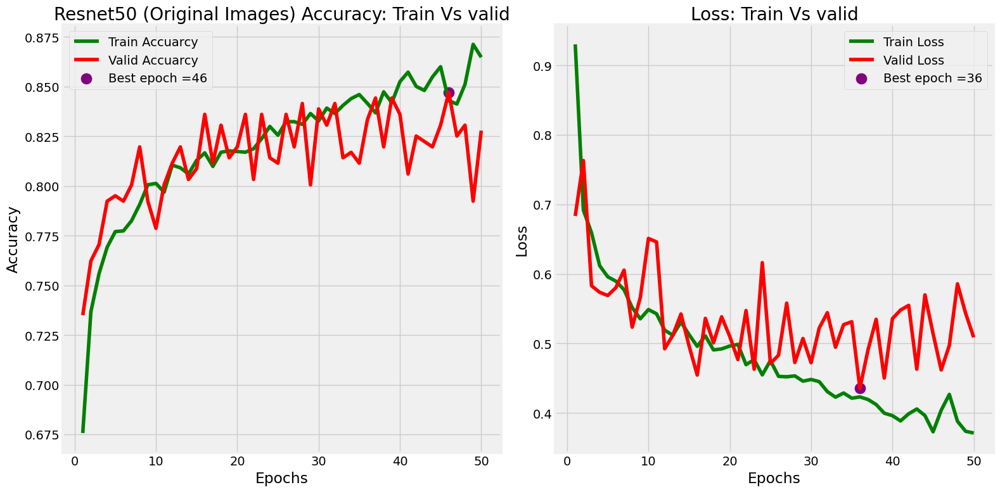

In [11]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Resnet50 (Original Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [12]:
# Define Vars
Train_sc = model.evaluate(Train, verbose = 1)
Valid_sc = model.evaluate(Valid, verbose = 1)
Test_sc =model.evaluate(Test, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 129s 876ms/step - accuracy: 0.8841 - loss: 0.3042
19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 756ms/step - accuracy: 0.8079 - loss: 0.5842


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 15s 767ms/step - accuracy: 0.7930 - loss: 0.6138
Train Scores : 
    accuracy: 0.8897234797477722 
      Loss:  0.2899562418460846 
________________________
Valid Scores : 
    accuracy: 0.8278688788414001 
      Loss:  0.5392375588417053 
________________________
Test Scores : 
    accuracy: 0.7874659299850464 
      Loss:  0.6840310096740723 
________________________


#### Clahe Images

In [20]:
# accuracy and loss of Train
tr_acc = Chistory.history['accuracy']
tr_loss = Chistory.history['loss']

# accuracy and loss or Valid\
v_acc = Chistory.history['val_accuracy']
v_loss = Chistory.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

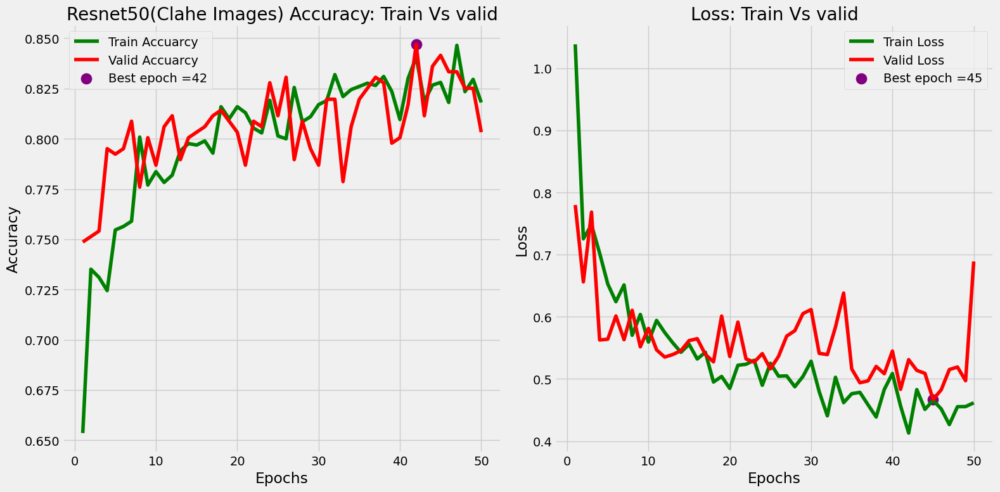

In [23]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Resnet50(Clahe Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [24]:
# Define Vars
Train_sc = modelC.evaluate(Train_clahe, verbose = 1)
Valid_sc = modelC.evaluate(Valid_clahe, verbose = 1)
Test_sc =modelC.evaluate(Test_clahe, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - accuracy: 0.8115 - loss: 0.4865
19/19 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.8156 - loss: 0.6907


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.7521 - loss: 0.7871
Train Scores : 
    accuracy: 0.8125640153884888 
      Loss:  0.49872204661369324 
________________________
Valid Scores : 
    accuracy: 0.8032786846160889 
      Loss:  0.6607285737991333 
________________________
Test Scores : 
    accuracy: 0.7465940117835999 
      Loss:  0.785305380821228 
________________________


#### Gaussian Images

In [ ]:
# accuracy and loss of Train
tr_acc = Ghistory.history['accuracy']
tr_loss = Ghistory.history['loss']

# accuracy and loss or Valid\
v_acc = Ghistory.history['val_accuracy']
v_loss = Ghistory.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

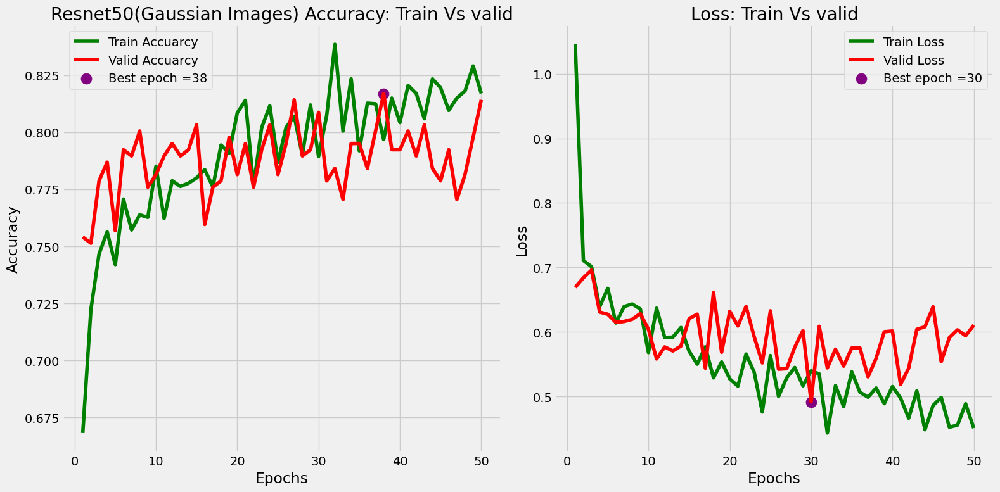

In [18]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Resnet50(Gaussian Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Define Vars
Train_sc = modelG.evaluate(Train_gaussian, verbose = 1)
Valid_sc = modelG.evaluate(Valid_gaussian, verbose = 1)
Test_sc =modelG.evaluate(Test_gaussian, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

147/147 ━━━━━━━━━━━━━━━━━━━━ 414s 3s/step - accuracy: 0.8516 - loss: 0.3857
19/19 ━━━━━━━━━━━━━━━━━━━━ 48s 3s/step - accuracy: 0.8113 - loss: 0.5377


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 48s 3s/step - accuracy: 0.7640 - loss: 0.6832
Train Scores : 
    accuracy: 0.8446568846702576 
      Loss:  0.4066818356513977 
________________________
Valid Scores : 
    accuracy: 0.8142076730728149 
      Loss:  0.5549767017364502 
________________________
Test Scores : 
    accuracy: 0.7901907563209534 
      Loss:  0.5813825726509094 
________________________


### 2. VGG-16

#### Original Images

In [ ]:
# accuracy and loss of Train
tr_acc = vggOhist.history['acc']
tr_loss = vggOhist.history['loss']

# accuracy and loss or Valid\
v_acc = vggOhist.history['val_acc']
v_loss = vggOhist.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

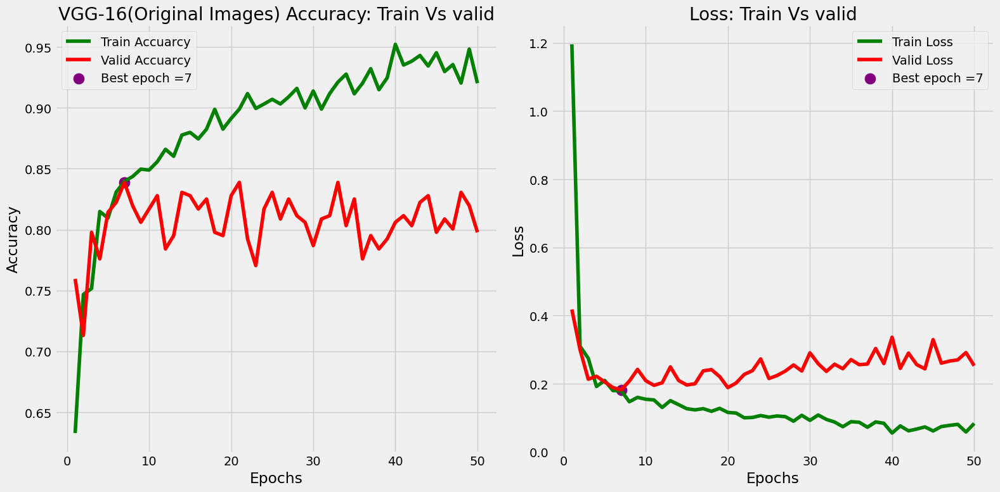

In [ ]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("VGG-16(Original Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [13]:
# Define Vars
Train_sc = model11.evaluate(Train, verbose = 1)
Valid_sc = model11.evaluate(Valid, verbose = 1)
Test_sc =model11.evaluate(Test, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 301s 2s/step - acc: 0.9521 - loss: 0.0512
19/19 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - acc: 0.8084 - loss: 0.2116


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - acc: 0.7741 - loss: 0.3319
Train Scores : 
    accuracy: 0.9528849720954895 
      Loss:  0.05320269986987114 
________________________
Valid Scores : 
    accuracy: 0.8032786846160889 
      Loss:  0.23223459720611572 
________________________
Test Scores : 
    accuracy: 0.7711171507835388 
      Loss:  0.3173017203807831 
________________________


#### Clahe Images

In [ ]:
# accuracy and loss of Train
tr_acc = vggChist.history['acc']
tr_loss = vggChist.history['loss']

# accuracy and loss or Valid\
v_acc = vggChist.history['val_acc']
v_loss = vggChist.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

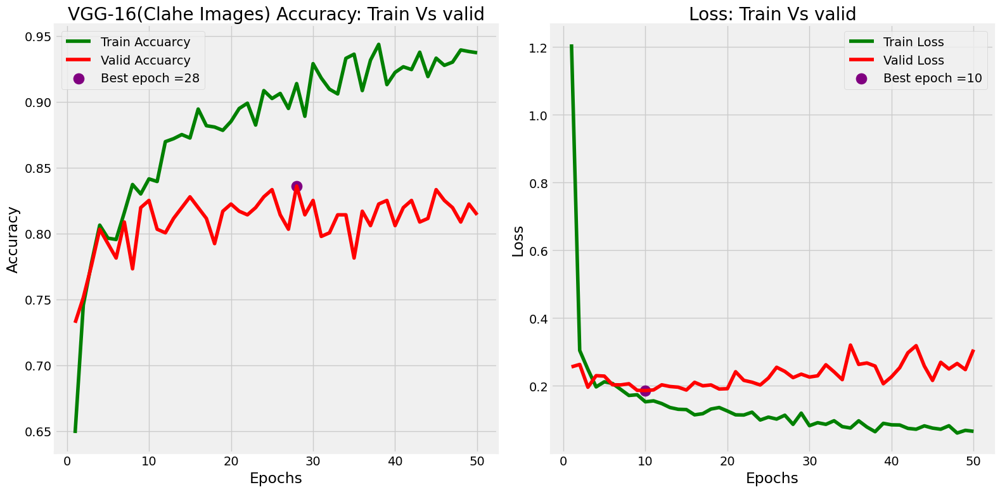

In [ ]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("VGG-16(Clahe Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [14]:
# Define Vars
Train_sc = model21.evaluate(Train_clahe, verbose = 1)
Valid_sc = model21.evaluate(Valid_clahe, verbose = 1)
Test_sc =model21.evaluate(Test_clahe, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 337s 2s/step - acc: 0.9414 - loss: 0.0628
19/19 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - acc: 0.7989 - loss: 0.3160


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - acc: 0.7553 - loss: 0.4574
Train Scores : 
    accuracy: 0.9474223256111145 
      Loss:  0.05591970682144165 
________________________
Valid Scores : 
    accuracy: 0.8142076730728149 
      Loss:  0.3143323063850403 
________________________
Test Scores : 
    accuracy: 0.752043604850769 
      Loss:  0.4890623986721039 
________________________


#### Gaussian Images

In [12]:
# accuracy and loss of Train
tr_acc = vggGhist.history['acc']
tr_loss = vggGhist.history['loss']

# accuracy and loss or Valid\
v_acc = vggGhist.history['val_acc']
v_loss = vggGhist.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

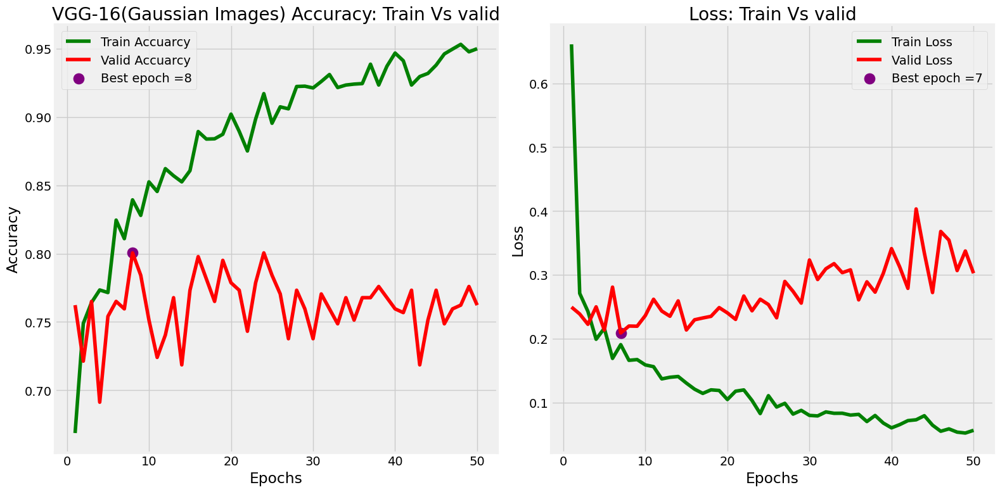

In [13]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("VGG-16(Gaussian Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [14]:
# Define Vars
Train_sc = model23.evaluate(Train_gaussian, verbose = 1)
Valid_sc = model23.evaluate(Valid_gaussian, verbose = 1)
Test_sc =model23.evaluate(Test_gaussian, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 298s 2s/step - acc: 0.9689 - loss: 0.0376
19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - acc: 0.7855 - loss: 0.2907


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - acc: 0.7538 - loss: 0.3410
Train Scores : 
    accuracy: 0.9689313769340515 
      Loss:  0.03684283792972565 
________________________
Valid Scores : 
    accuracy: 0.7622950673103333 
      Loss:  0.30786362290382385 
________________________
Test Scores : 
    accuracy: 0.7683923840522766 
      Loss:  0.3035171627998352 
________________________


### 3. Inception

#### Original Images

In [27]:
# accuracy and loss of Train
tr_acc = inc_history.history['acc']
tr_loss = inc_history.history['loss']

# accuracy and loss or Valid\
v_acc = inc_history.history['val_acc']
v_loss = inc_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

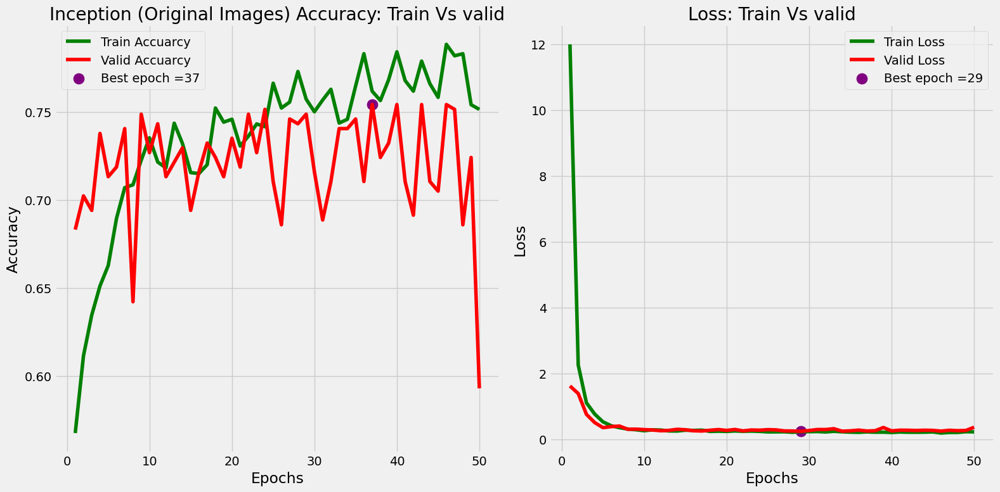

In [28]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Inception (Original Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
# Define Vars
Train_sc = model31.evaluate(Train, verbose = 1)
Valid_sc = model31.evaluate(Valid, verbose = 1)
Test_sc =model31.evaluate(Test, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 95s 644ms/step - acc: 0.6550 - loss: 0.2989
19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 540ms/step - acc: 0.5613 - loss: 0.4129


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 10s 539ms/step - acc: 0.5460 - loss: 0.4287
Train Scores : 
    accuracy: 0.6650733947753906 
      Loss:  0.29691681265830994 
________________________
Valid Scores : 
    accuracy: 0.5928961634635925 
      Loss:  0.3594563603401184 
________________________
Test Scores : 
    accuracy: 0.5504087209701538 
      Loss:  0.4242120683193207 
________________________


#### Clahe images

In [14]:
# accuracy and loss of Train
tr_acc = inc_C_history.history['acc']
tr_loss = inc_C_history.history['loss']

# accuracy and loss or Valid\
v_acc = inc_C_history.history['val_acc']
v_loss = inc_C_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

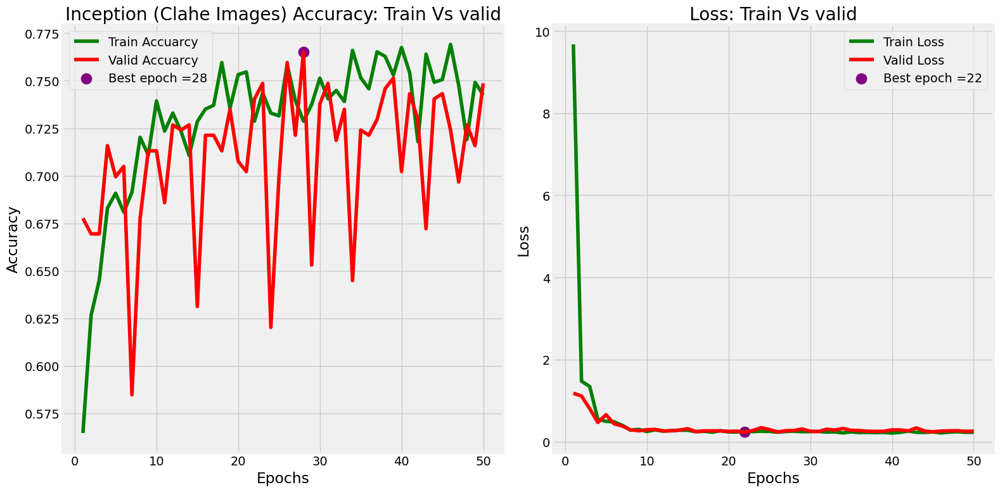

In [15]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Inception (Clahe Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [16]:
# Define Vars
Train_sc = model32.evaluate(Train_clahe, verbose = 1)
Valid_sc = model32.evaluate(Valid_clahe, verbose = 1)
Test_sc =model32.evaluate(Test_clahe, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 97s 658ms/step - acc: 0.7686 - loss: 0.2128
19/19 ━━━━━━━━━━━━━━━━━━━━ 11s 550ms/step - acc: 0.7483 - loss: 0.2498


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 11s 556ms/step - acc: 0.6770 - loss: 0.3360
Train Scores : 
    accuracy: 0.7593035101890564 
      Loss:  0.2243024855852127 
________________________
Valid Scores : 
    accuracy: 0.748633861541748 
      Loss:  0.2479061782360077 
________________________
Test Scores : 
    accuracy: 0.6702997088432312 
      Loss:  0.3144713342189789 
________________________


#### Gaussian Images

In [11]:
# accuracy and loss of Train
tr_acc = inc_G_history.history['acc']
tr_loss = inc_G_history.history['loss']

# accuracy and loss or Valid\
v_acc = inc_G_history.history['val_acc']
v_loss = inc_G_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

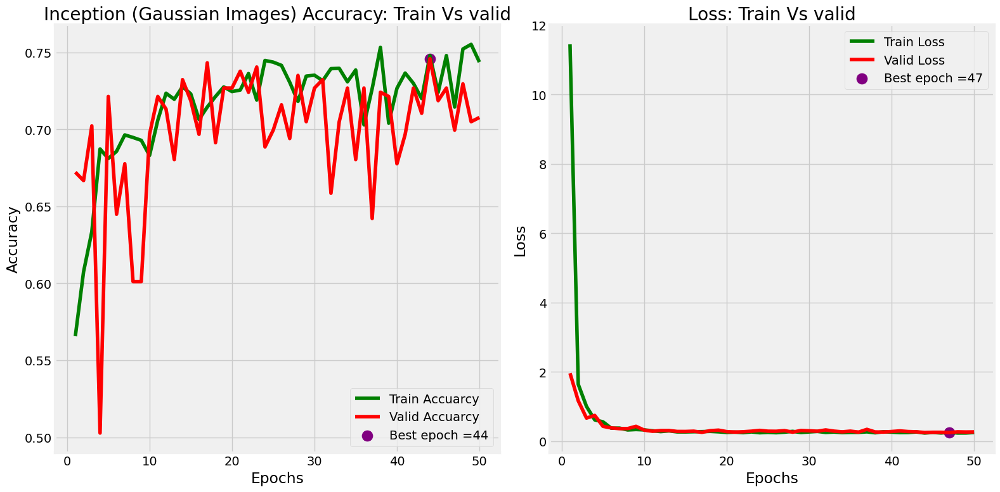

In [12]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("Inception (Gaussian Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [13]:
# Define Vars
Train_sc = model22.evaluate(Train_gaussian, verbose = 1)
Valid_sc = model22.evaluate(Valid_gaussian, verbose = 1)
Test_sc =model22.evaluate(Test_gaussian, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 73s 492ms/step - acc: 0.7434 - loss: 0.2383
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 413ms/step - acc: 0.7052 - loss: 0.2661


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 416ms/step - acc: 0.7172 - loss: 0.2900
Train Scores : 
    accuracy: 0.7459883689880371 
      Loss:  0.2378668487071991 
________________________
Valid Scores : 
    accuracy: 0.7076502442359924 
      Loss:  0.26654139161109924 
________________________
Test Scores : 
    accuracy: 0.7111716866493225 
      Loss:  0.2752592861652374 
________________________


### 4. EfficientNet

#### Original Images

In [12]:
# accuracy and loss of Train
tr_acc = eff_history.history['accuracy']
tr_loss = eff_history.history['loss']

# accuracy and loss or Valid\
v_acc = eff_history.history['val_accuracy']
v_loss = eff_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

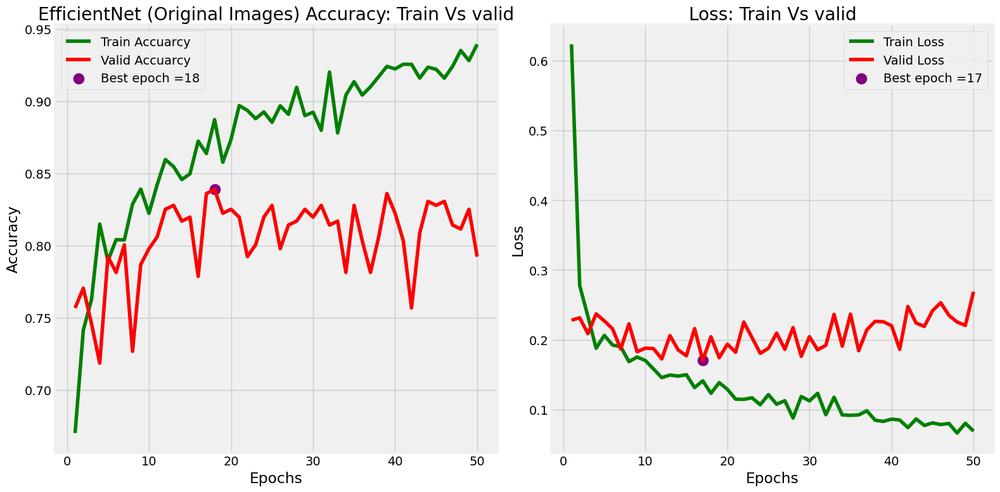

In [13]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("EfficientNet (Original Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [14]:
# Define Vars
Train_sc = model31.evaluate(Train, verbose = 1)
Valid_sc = model31.evaluate(Valid, verbose = 1)
Test_sc =model31.evaluate(Test, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 78s 532ms/step - accuracy: 0.9572 - loss: 0.0467
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 419ms/step - accuracy: 0.7746 - loss: 0.2516


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 420ms/step - accuracy: 0.7575 - loss: 0.3876
Train Scores : 
    accuracy: 0.9508364796638489 
      Loss:  0.05142064765095711 
________________________
Valid Scores : 
    accuracy: 0.7923497557640076 
      Loss:  0.2611842155456543 
________________________
Test Scores : 
    accuracy: 0.7493187785148621 
      Loss:  0.38657325506210327 
________________________


#### Clahe Images

In [29]:
# accuracy and loss of Train
tr_acc = eff_C_history.history['accuracy']
tr_loss = eff_C_history.history['loss']

# accuracy and loss or Valid\
v_acc = eff_C_history.history['val_accuracy']
v_loss = eff_C_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

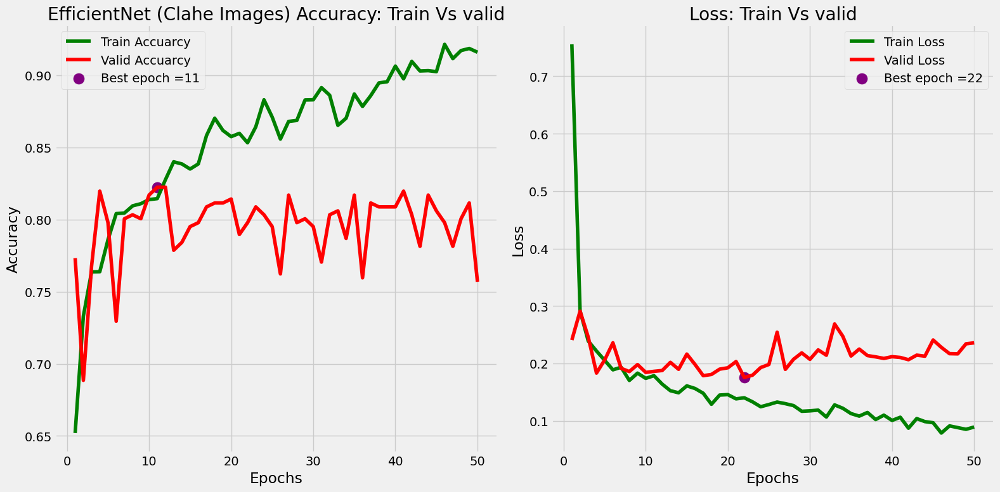

In [30]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("EfficientNet (Clahe Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [31]:
# Define Vars
Train_sc = model32.evaluate(Train_clahe, verbose = 1)
Valid_sc = model32.evaluate(Valid_clahe, verbose = 1)
Test_sc =model32.evaluate(Test_clahe, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 76s 514ms/step - accuracy: 0.9295 - loss: 0.0695
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 402ms/step - accuracy: 0.7620 - loss: 0.2248


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 404ms/step - accuracy: 0.7166 - loss: 0.3134
Train Scores : 
    accuracy: 0.9347900152206421 
      Loss:  0.06932605057954788 
________________________
Valid Scores : 
    accuracy: 0.7568305730819702 
      Loss:  0.24048945307731628 
________________________
Test Scores : 
    accuracy: 0.7247956395149231 
      Loss:  0.3158719539642334 
________________________


#### Gaussian Images

In [18]:
# accuracy and loss of Train
tr_acc = eff_G_history.history['accuracy']
tr_loss = eff_G_history.history['loss']

# accuracy and loss or Valid\
v_acc = eff_G_history.history['val_accuracy']
v_loss = eff_G_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

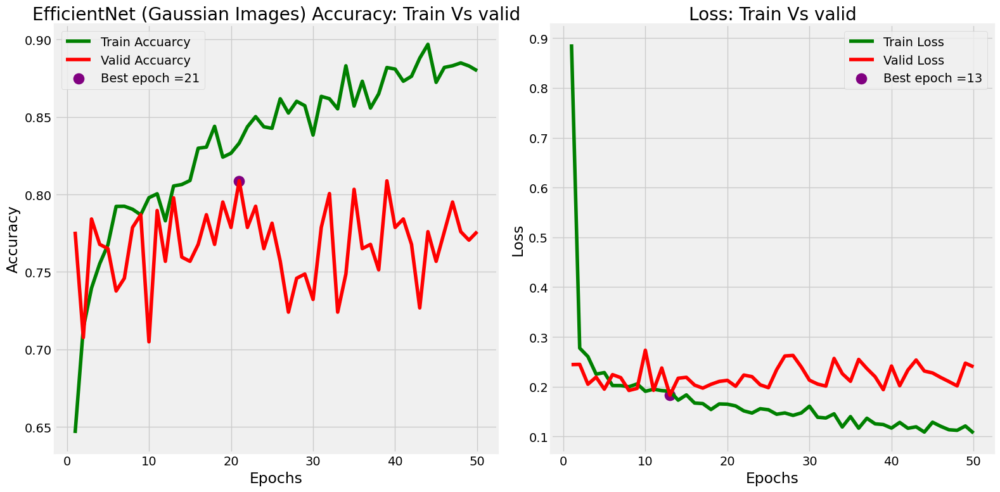

In [19]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("EfficientNet (Gaussian Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [20]:
# Define Vars
Train_sc = model33.evaluate(Train_gaussian, verbose = 1)
Valid_sc = model33.evaluate(Valid_gaussian, verbose = 1)
Test_sc =model33.evaluate(Test_gaussian, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 76s 516ms/step - accuracy: 0.9135 - loss: 0.0858
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 401ms/step - accuracy: 0.7833 - loss: 0.2368


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 404ms/step - accuracy: 0.7285 - loss: 0.3387
Train Scores : 
    accuracy: 0.9197678565979004 
      Loss:  0.08452436327934265 
________________________
Valid Scores : 
    accuracy: 0.7759562730789185 
      Loss:  0.2448647916316986 
________________________
Test Scores : 
    accuracy: 0.752043604850769 
      Loss:  0.28072434663772583 
________________________


### 5. MobileNet

#### Original Images

In [10]:
# accuracy and loss of Train
tr_acc = mob_history.history['accuracy']
tr_loss = mob_history.history['loss']

# accuracy and loss or Valid\
v_acc = mob_history.history['val_accuracy']
v_loss = mob_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

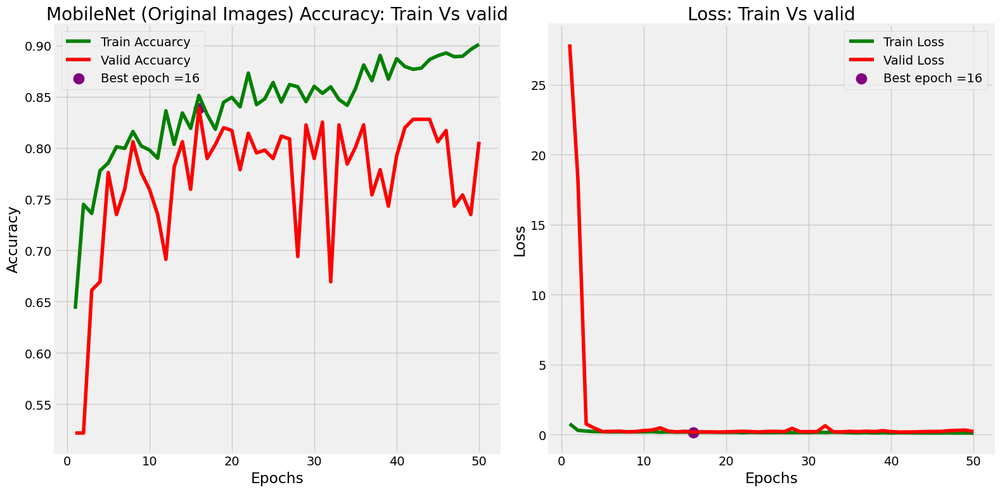

In [11]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("MobileNet (Original Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Define Vars
Train_sc = model51.evaluate(Train, verbose = 1)
Valid_sc = model51.evaluate(Valid, verbose = 1)
Test_sc =model51.evaluate(Test, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 45s 305ms/step - accuracy: 0.9116 - loss: 0.0926
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 182ms/step - accuracy: 0.8063 - loss: 0.2303


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - accuracy: 0.7848 - loss: 0.2367
Train Scores : 
    accuracy: 0.9037213921546936 
      Loss:  0.0982627421617508 
________________________
Valid Scores : 
    accuracy: 0.806010901927948 
      Loss:  0.22114251554012299 
________________________
Test Scores : 
    accuracy: 0.7874659299850464 
      Loss:  0.2280762642621994 
________________________


#### Clahe Images

In [ ]:
# accuracy and loss of Train
tr_acc = mob_C_history.history['accuracy']
tr_loss = mob_C_history.history['loss']

# accuracy and loss or Valid\
v_acc = mob_C_history.history['val_accuracy']
v_loss = mob_C_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

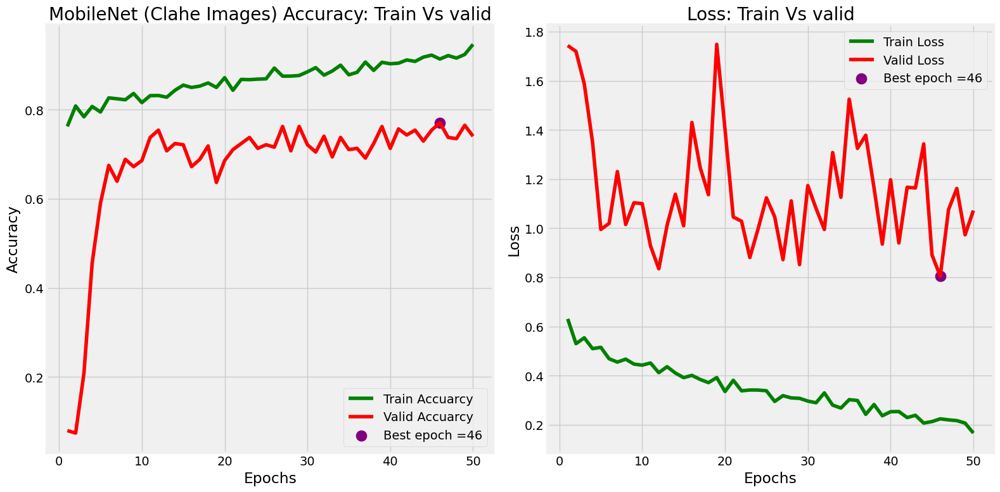

In [ ]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("MobileNet (Clahe Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Define Vars
Train_sc = model52.evaluate(Train_clahe, verbose = 1)
Valid_sc = model52.evaluate(Valid_clahe, verbose = 1)
Test_sc =model52.evaluate(Test_clahe, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 50s 340ms/step - accuracy: 0.9423 - loss: 0.1846
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7368 - loss: 1.0642


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - accuracy: 0.7103 - loss: 1.2003
Train Scores : 
    accuracy: 0.9443495869636536 
      Loss:  0.17589853703975677 
________________________
Valid Scores : 
    accuracy: 0.7404371500015259 
      Loss:  1.1207232475280762 
________________________
Test Scores : 
    accuracy: 0.6975476741790771 
      Loss:  1.3369872570037842 
________________________


#### Gaussian Images

In [20]:
# accuracy and loss of Train
tr_acc = mob_G_history.history['accuracy']
tr_loss = mob_G_history.history['loss']

# accuracy and loss or Valid\
v_acc = mob_G_history.history['val_accuracy']
v_loss = mob_G_history.history['val_loss']

# highest value of v_acc by getting its index
index_acc = np.argmax(v_acc)
high_Vacc = v_acc[index_acc]

# lowest value of v_loss by getting index
index_loss = np.argmin(v_loss)
low_Vloss = v_loss[index_loss]

# n. of epochs based on length of tr_acc values
Epochs =[]
for i in range(len(tr_acc)):
    Epochs.append(i+1)
    
# Define best epoch
best_acc = f'Best epoch ={str(index_acc +1)}'
best_loss = f'Best epoch ={str(index_loss+1)}'

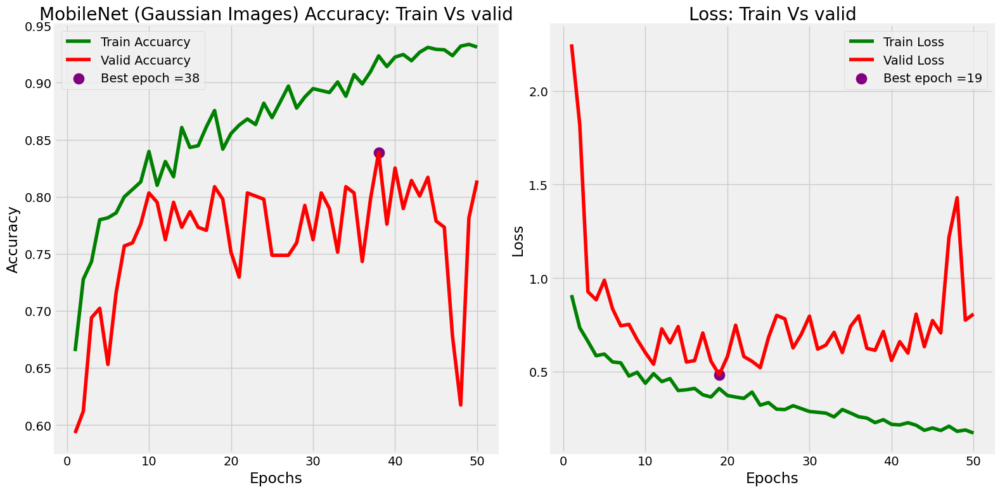

In [21]:
plt.figure(figsize = (16, 8))
plt.style.use('fivethirtyeight')


plt.subplot(1,2,1)
plt.plot(Epochs, tr_acc, "g", label = "Train Accuarcy")
plt.plot(Epochs, v_acc, "r", label = "Valid Accuarcy")
plt.scatter(index_acc+1, high_Vacc, s= 150, color = 'purple', label = best_acc)

plt.title("MobileNet (Gaussian Images) Accuracy: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1,2,2)
plt.plot(Epochs, tr_loss, "g", label = "Train Loss")
plt.plot(Epochs, v_loss, "r", label = "Valid Loss")
plt.scatter(index_loss+1, low_Vloss, s= 150, color = 'purple', label = best_loss)

plt.title("Loss: Train Vs valid")
plt. xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [22]:
# Define Vars
Train_sc = model53.evaluate(Train_gaussian, verbose = 1)
Valid_sc = model53.evaluate(Valid_gaussian, verbose = 1)
Test_sc =model53.evaluate(Test_gaussian, verbose = 1)

#Print
print('Train Scores : \n    accuracy:', Train_sc[1], '\n      Loss: ', Train_sc[0], '\n________________________')
print('Valid Scores : \n    accuracy:', Valid_sc[1], '\n      Loss: ', Valid_sc[0], '\n________________________')
print('Test Scores : \n    accuracy:', Test_sc[1], '\n      Loss: ', Test_sc[0], '\n________________________')

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


147/147 ━━━━━━━━━━━━━━━━━━━━ 47s 321ms/step - accuracy: 0.9561 - loss: 0.1324
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 192ms/step - accuracy: 0.8137 - loss: 0.8186


/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 192ms/step - accuracy: 0.7608 - loss: 0.9418
Train Scores : 
    accuracy: 0.9522021412849426 
      Loss:  0.13536429405212402 
________________________
Valid Scores : 
    accuracy: 0.8142076730728149 
      Loss:  0.8373526334762573 
________________________
Test Scores : 
    accuracy: 0.7874659299850464 
      Loss:  0.7648925185203552 
________________________


# Predictions

## 1. ResNet50

### Original Images

In [13]:
predictions = model.predict(Test)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 18s 862ms/step
[[1.3987450e-07 4.9960874e-03 8.0641039e-13 1.4412266e-04 9.9485970e-01]
 [4.0260247e-08 4.4765929e-06 9.9999547e-01 1.3280939e-10 4.7776556e-13]
 [2.5042970e-02 2.1778109e-05 9.7492468e-01 1.0343312e-05 2.0349238e-07]
 ...
 [8.9071209e-06 5.1115090e-05 9.9993980e-01 1.3204886e-09 9.7030522e-08]
 [1.9201289e-04 4.9977526e-01 4.5373113e-06 3.7915438e-01 1.2087379e-01]
 [1.3963106e-03 9.8563296e-01 2.6923713e-05 9.9261720e-03 3.0176507e-03]]
[4 2 2 2 1 2 4 1 0 1 0 2 2 1 2 1 1 2 4 2 2 1 1 1 1 0 2 2 2 2 2 2 1 2 1 2 0
 1 1 2 0 1 0 1 2 2 2 3 0 0 2 4 3 2 2 2 2 1 0 2 2 1 2 0 2 3 1 1 1 1 2 2 0 2
 2 2 1 1 3 2 2 1 0 1 2 2 1 1 2 2 1 2 2 1 1 1 2 1 2 2 3 2 4 2 0 2 0 2 1 2 1
 2 1 1 2 3 2 2 1 1 1 2 4 0 2 2 2 2 1 1 2 2 2 1 1 4 2 2 4 2 3 2 2 2 2 1 0 2
 2 3 1 1 0 2 2 2 2 1 2 2 1 2 2 1 1 2 2 1 2 1 0 2 3 1 1 2 2 2 0 0 2 2 2 2 2
 2 0 3 1 2 0 2 2 1 2 2 2 3 2 2 2 2 1 1 2 1 0 3 1 1 1 3 0 1 2 0 2 2 1 0 2 0
 1 2 2 2 2 1 3 2 1 0 4 1 1 3 3 3 1 2 0 2 4 2 1 0 0 1 1 1 2 1 1 2

In [18]:
# dataframe
results_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/resnet50_org_results.csv'

# Save the DataFrame to a CSV file
results_df.to_csv(csv_file_path, index=False)

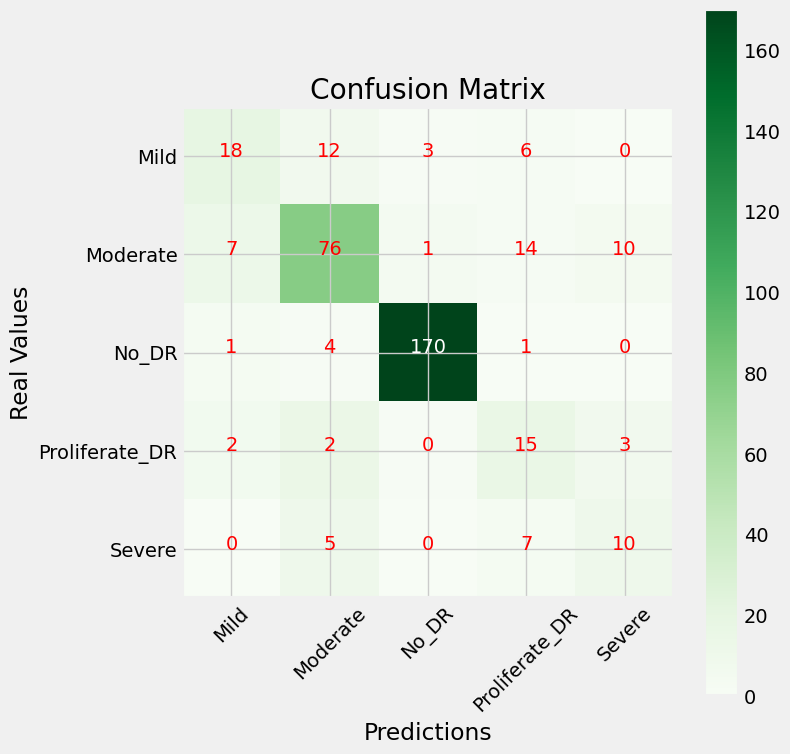

In [14]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Clahe Images

In [25]:
predictions = modelC.predict(Test_clahe)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step
[[2.1891395e-02 9.5078981e-01 1.3105860e-03 1.1540199e-02 1.4467937e-02]
 [3.4442060e-03 2.1200771e-03 9.9443525e-01 2.8065717e-08 3.6760289e-07]
 [1.4661010e-01 1.8782195e-03 8.5146683e-01 2.2189903e-05 2.2758664e-05]
 ...
 [2.3937880e-04 4.9551621e-05 9.9970919e-01 9.9935438e-09 1.8545662e-06]
 [5.3954923e-01 2.6804599e-01 1.6253124e-01 6.5667639e-03 2.3306837e-02]
 [9.0651527e-05 9.9562657e-01 5.7200491e-06 1.4330159e-03 2.8440347e-03]]
[1 2 2 2 1 2 1 1 4 1 0 2 2 1 2 1 1 2 1 2 2 1 1 1 1 1 2 2 2 2 2 2 1 2 1 2 1
 1 1 2 1 1 1 2 2 2 2 4 1 1 2 1 1 2 2 2 2 1 1 2 4 1 2 2 2 1 1 1 1 1 2 2 1 2
 2 2 1 1 1 2 2 1 0 1 2 2 1 1 2 2 1 2 2 1 1 4 2 1 2 2 4 2 1 2 1 2 0 2 1 2 1
 2 1 1 2 4 2 2 1 1 1 2 1 1 2 2 2 2 1 1 2 2 2 0 1 1 2 2 2 2 1 2 2 2 2 4 0 2
 2 1 1 1 1 2 2 2 1 4 2 2 1 2 2 1 1 2 2 1 2 1 1 2 1 1 1 2 2 2 1 1 2 2 2 2 2
 2 1 1 1 2 1 2 2 1 2 2 2 1 2 2 2 2 1 1 2 1 1 1 1 1 1 1 1 1 2 1 2 2 1 1 2 0
 1 2 2 2 2 4 3 2 1 1 1 1 1 4 1 4 1 2 1 2 1 2 1 1 1 1 1 1 2 1 1 2 2 

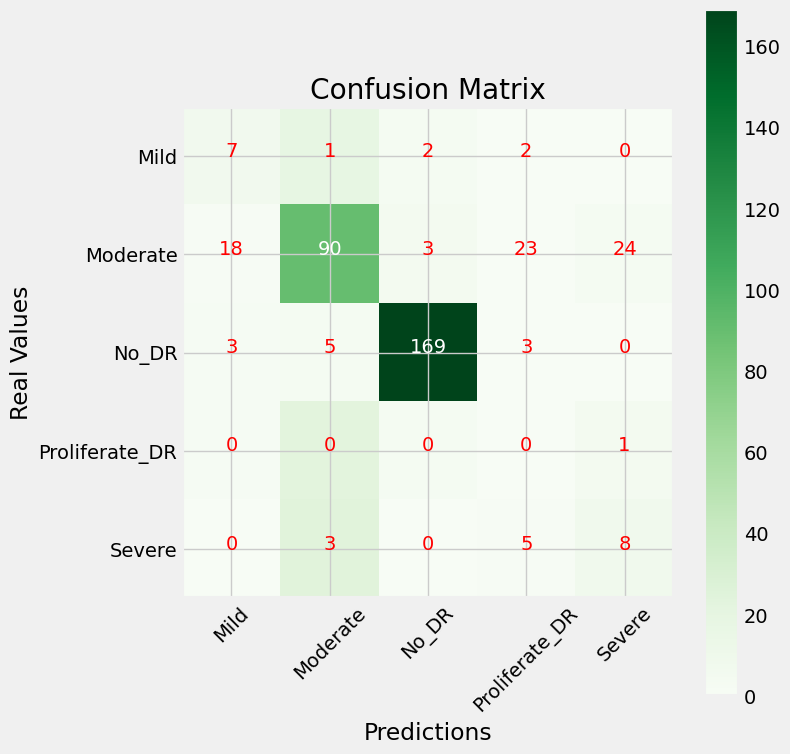

In [26]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_clahe.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_clahe.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Gaussian Images

In [ ]:
predictions = modelG.predict(Test_gaussian)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step
[[2.4481845e-01 7.0208335e-01 6.3386583e-03 3.5139002e-02 1.1620530e-02]
 [1.4223433e-03 2.9007691e-01 4.4856071e-05 4.0732384e-01 3.0113193e-01]
 [7.8983055e-03 9.2219114e-03 9.8287815e-01 1.2478356e-06 2.8325599e-07]
 ...
 [2.7847881e-03 2.6889171e-03 9.9452621e-01 8.1978712e-08 1.8843652e-08]
 [7.7744208e-14 2.3386618e-15 1.0000000e+00 9.9041261e-19 3.7016695e-16]
 [1.5984920e-01 8.0245125e-01 2.1877430e-02 1.4654538e-02 1.1675401e-03]]
[1 3 2 1 1 2 1 1 1 1 1 2 2 1 2 2 2 2 2 2 2 1 1 1 1 1 1 2 2 2 2 2 1 1 1 2 0
 1 1 1 2 1 2 1 2 2 2 2 1 0 2 3 3 2 2 2 1 1 1 2 1 2 2 1 3 1 1 1 1 1 2 2 2 2
 2 2 1 1 1 2 2 1 1 1 2 1 1 0 2 2 1 2 2 1 1 1 2 1 2 1 2 2 1 3 1 1 2 2 1 2 3
 2 1 1 2 1 2 2 1 1 3 2 3 1 2 2 2 2 2 1 2 3 2 2 1 1 2 2 1 2 3 2 1 1 2 1 2 2
 2 2 1 1 4 2 2 2 1 1 2 2 1 2 2 1 1 2 2 1 2 1 1 2 3 1 1 2 2 2 1 0 1 2 2 3 2
 2 2 2 2 2 1 2 1 1 2 2 2 2 2 3 2 2 1 1 2 0 1 1 1 1 2 1 1 1 2 4 2 2 1 1 2 0
 1 2 2 2 2 1 2 2 1 0 4 3 1 1 1 2 2 2 1 2 1 2 1 2 1 1 4 1 1 1 1 0 3 

In [ ]:
# dataframe
results_gauss_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/resnet50_gauss_results.csv'

# Save the DataFrame to a CSV file
results_gauss_df.to_csv(csv_file_path, index=False)

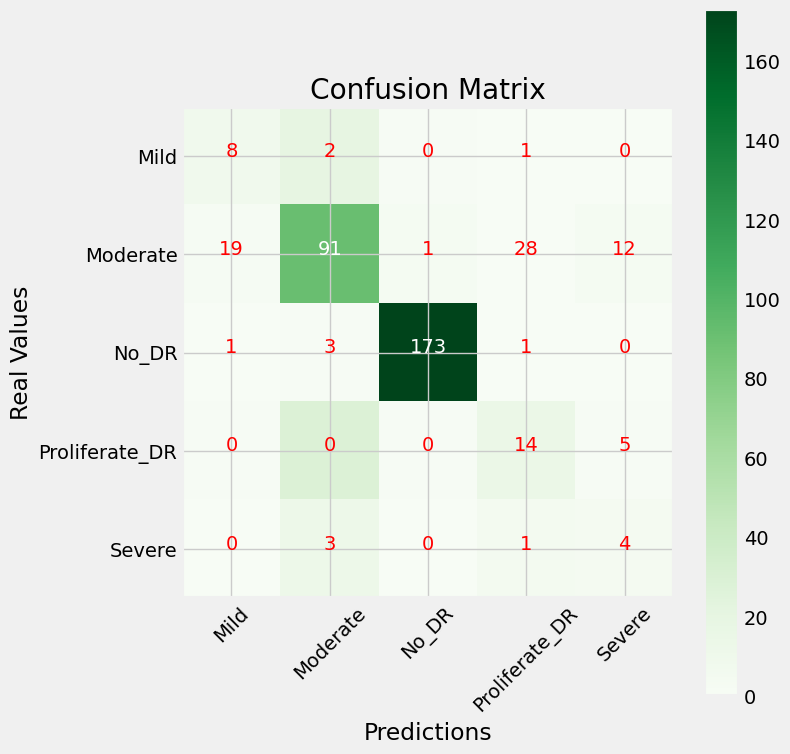

In [ ]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_gaussian.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_gaussian.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

## 2. VGG-16

### Original Images

In [15]:
predictions = model11.predict(Test)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step
[[5.4735699e-12 3.8875456e-05 1.2476131e-12 7.9103003e-08 9.9996102e-01]
 [9.2640800e-12 1.9759569e-12 1.0000000e+00 3.5908423e-12 9.5319591e-15]
 [1.9711912e-05 1.9877268e-06 9.9997723e-01 2.5389480e-07 7.6082074e-07]
 ...
 [1.6212506e-12 5.3511118e-13 1.0000000e+00 4.2725961e-14 2.7386368e-10]
 [7.9801196e-04 9.1312665e-01 4.9960105e-05 2.7472297e-02 5.8553152e-02]
 [1.4447281e-06 9.9992120e-01 3.9541007e-08 7.3112824e-05 4.2480779e-06]]
[4 2 2 2 1 2 4 1 1 1 0 2 2 1 2 1 1 2 1 2 2 1 1 1 1 1 2 2 2 2 2 2 0 2 1 2 0
 1 1 2 2 3 1 1 2 2 2 3 0 1 2 3 1 2 2 2 2 3 1 2 0 1 2 3 2 1 1 1 1 1 2 2 0 2
 2 2 0 1 3 2 2 1 0 1 2 2 1 1 2 2 0 2 2 1 1 4 2 1 2 2 0 2 4 2 0 2 2 2 1 2 1
 2 1 1 2 1 2 2 1 1 4 2 4 0 2 2 2 2 1 1 2 2 2 1 1 4 2 2 4 1 1 2 2 2 2 4 2 2
 2 1 1 1 0 2 2 2 2 1 2 2 0 2 2 1 1 2 2 1 2 1 0 2 1 1 1 2 2 2 1 1 2 2 2 2 2
 2 0 1 3 2 1 2 2 1 2 2 2 3 2 2 2 2 1 0 2 0 0 3 1 4 1 3 0 3 2 0 2 2 1 1 2 0
 1 2 2 2 2 1 1 2 1 1 1 1 0 3 1 1 1 2 0 2 1 2 4 0 0 1 1 4 2 0 1 2 2 

In [16]:
# dataframe
results_vggo_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/vgg_org_results.csv'

# Save the DataFrame to a CSV file
results_vggo_df.to_csv(csv_file_path, index=False)

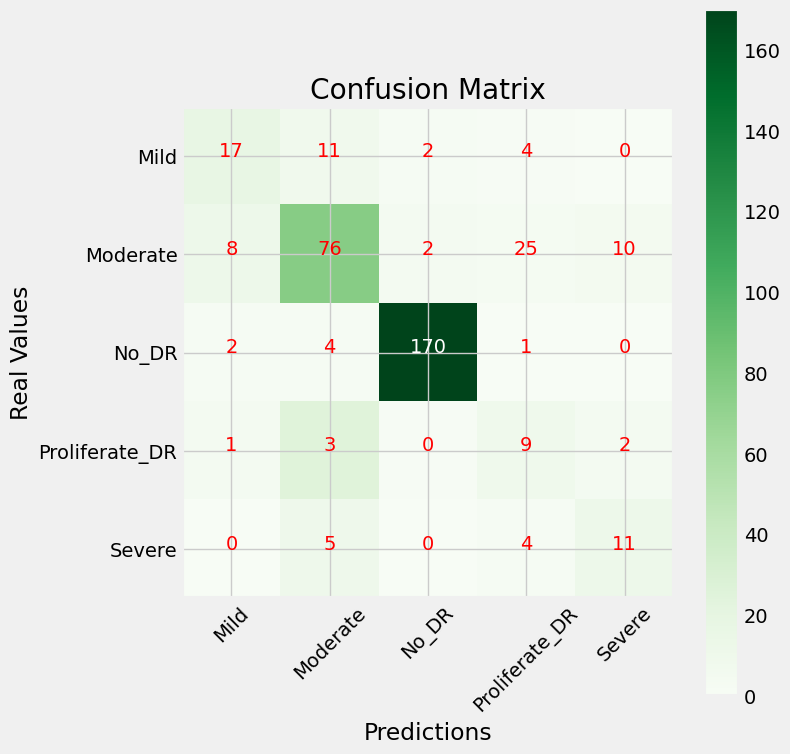

In [17]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Clahe Images

In [15]:
predictions = model21.predict(Test_clahe)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step
[[1.4743233e-03 4.8289755e-01 2.9750763e-05 5.1557499e-01 2.3375460e-05]
 [1.8181821e-27 4.1674092e-25 1.0000000e+00 6.3512990e-23 2.7848561e-31]
 [7.8941709e-14 8.8965396e-13 1.0000000e+00 7.4892124e-12 4.9026280e-15]
 ...
 [3.5456969e-07 1.2216842e-13 9.9999964e-01 7.4069785e-14 8.3341268e-12]
 [9.9998260e-01 7.0391718e-07 1.6689930e-05 2.1445372e-08 3.1899405e-10]
 [7.8364613e-09 9.9999976e-01 1.3307964e-08 2.2446883e-08 2.3992095e-07]]
[3 2 2 2 1 2 0 1 1 1 0 2 2 1 2 3 1 2 1 2 2 1 1 1 0 1 2 2 2 2 2 2 0 2 1 2 0
 1 1 2 1 3 0 1 2 2 2 4 0 0 2 1 3 2 2 2 2 3 0 2 1 1 2 2 2 1 1 1 1 1 2 2 3 2
 2 2 1 1 1 2 2 1 1 1 2 2 1 1 2 2 0 2 2 1 1 2 2 1 2 2 3 2 1 2 0 2 0 2 1 2 4
 2 1 1 2 0 2 2 0 1 1 2 3 0 2 2 2 2 1 1 2 2 2 0 1 1 2 2 2 1 3 2 2 2 2 1 2 2
 2 1 1 1 1 2 2 2 2 1 2 2 1 2 2 1 0 2 2 1 2 1 0 2 1 1 1 2 2 2 0 0 2 2 2 2 2
 2 2 3 1 2 1 2 2 1 2 2 2 3 2 2 2 2 1 0 2 0 0 4 1 1 4 1 0 3 2 0 2 2 1 0 2 0
 1 2 2 2 2 4 3 2 1 0 3 4 1 3 3 4 1 2 0 2 4 2 1 0 0 1 1 1 2 0 1 2 2 

In [16]:
# dataframe
results_vggc_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/vgg_clahe_results.csv'

# Save the DataFrame to a CSV file
results_vggc_df.to_csv(csv_file_path, index=False)

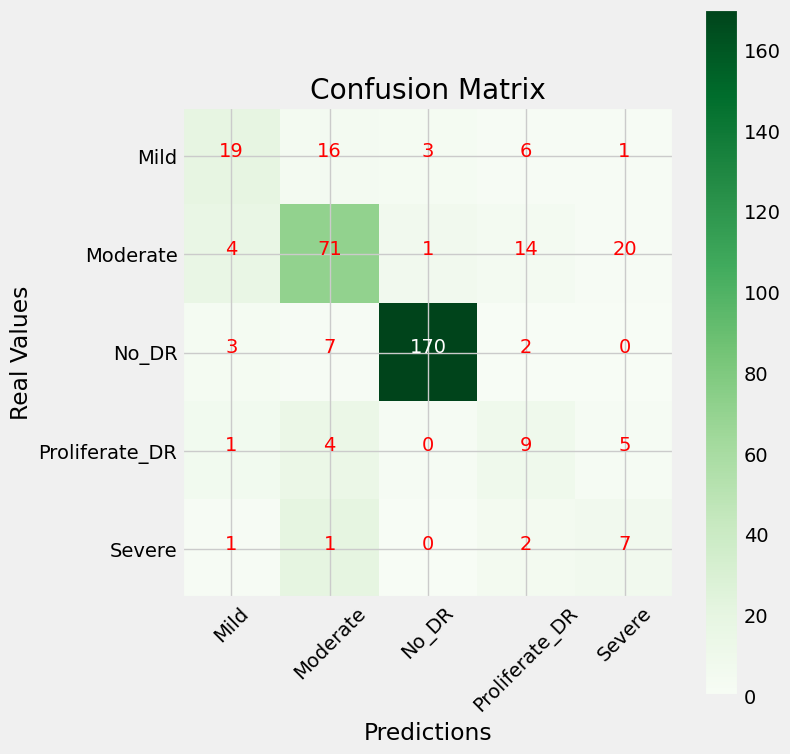

In [17]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_clahe.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_clahe.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Gaussian Images

In [15]:
predictions = model23.predict(Test_gaussian)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step
[[8.7982547e-01 3.0824484e-02 3.2208313e-03 8.3737560e-02 2.3916122e-03]
 [4.6708774e-06 9.0610945e-01 9.3211162e-07 9.9961748e-03 8.3888784e-02]
 [4.1731886e-15 3.6070800e-14 1.0000000e+00 5.7705477e-20 1.1364560e-15]
 ...
 [1.0063712e-16 8.3476608e-14 1.0000000e+00 1.0893039e-19 4.1358313e-17]
 [0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00 0.0000000e+00]
 [5.0446693e-06 9.9990010e-01 1.5194441e-06 5.8534170e-05 3.4800276e-05]]
[0 1 2 4 1 2 1 1 1 1 0 2 2 1 2 2 2 2 2 2 2 1 1 1 1 1 1 2 2 2 2 2 1 2 1 2 0
 1 2 1 2 1 1 1 2 2 2 2 0 0 2 3 1 2 2 2 1 1 1 2 1 2 2 1 0 1 0 3 2 1 2 2 2 2
 2 2 0 1 1 2 2 1 0 1 2 4 1 2 2 2 1 2 2 1 1 1 2 1 2 1 2 2 1 3 0 3 2 2 1 2 3
 2 1 1 2 1 2 2 1 4 1 2 3 1 2 2 2 2 1 1 1 1 2 2 1 4 2 2 1 2 3 2 1 2 2 1 2 2
 2 2 4 1 3 2 2 2 1 1 2 2 3 2 2 1 1 2 2 1 2 1 0 2 1 1 3 2 2 2 0 1 1 2 2 3 2
 2 2 2 2 2 3 2 4 1 2 2 2 2 2 3 2 2 1 1 2 0 1 1 1 1 2 3 1 3 2 4 2 2 0 1 2 0
 1 2 2 2 2 1 2 2 0 0 4 4 1 3 1 2 2 2 1 2 1 2 1 2 1 0 4 1 4 1 1 0 3 

In [16]:
# dataframe
results_vggg_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/vgg_gaussian_results.csv'

# Save the DataFrame to a CSV file
results_vggg_df.to_csv(csv_file_path, index=False)

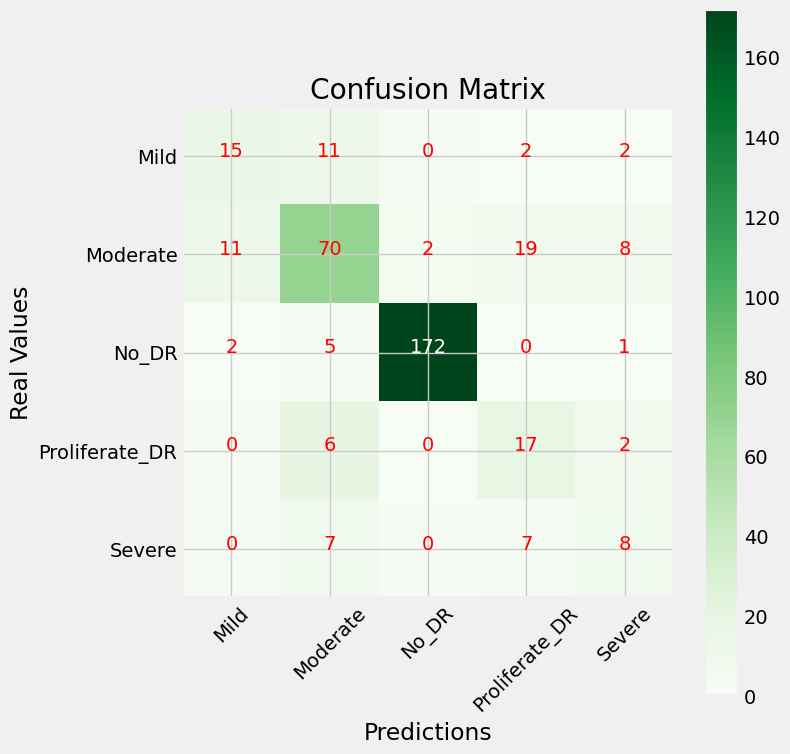

In [17]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_gaussian.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_gaussian.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

## 3. Inception

### Original Images

In [30]:
predictions = model31.predict(Test)
y_pred = np.argmax(predictions, axis = 1)

#Check
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 653ms/step
[[3.37194912e-02 8.82845044e-01 4.59398814e-02 2.96114199e-03
  3.45344581e-02]
 [2.18519336e-03 1.21940132e-02 9.84825671e-01 5.95268037e-04
  1.99966031e-04]
 [3.60167809e-02 7.43367011e-03 9.56050932e-01 4.31076507e-04
  6.74891562e-05]
 ...
 [4.88587050e-03 5.92572964e-04 9.94508088e-01 1.26098275e-05
  8.89810565e-07]
 [2.28389546e-01 4.60430026e-01 2.13396326e-02 2.54071355e-01
  3.57693955e-02]
 [2.08030976e-02 9.56993520e-01 2.37955106e-03 1.96636077e-02
  1.60248819e-04]]
[1 2 2 0 1 2 0 0 1 4 0 2 2 0 2 0 0 2 0 2 2 0 0 0 0 0 2 2 2 2 2 2 0 2 0 2 0
 0 0 2 1 0 0 0 2 2 2 0 0 0 2 0 1 2 2 2 2 0 0 2 0 1 2 2 2 0 0 1 0 0 1 2 0 2
 2 2 1 1 0 2 2 1 0 1 2 2 2 4 2 2 1 2 2 1 1 2 2 0 2 2 0 2 0 2 0 2 0 2 0 2 1
 2 0 0 2 0 2 2 0 0 1 2 0 0 2 2 0 2 1 1 2 0 2 0 1 0 0 2 4 0 0 2 2 2 2 0 2 2
 0 0 1 0 0 2 2 2 2 0 2 1 1 2 2 1 0 2 2 0 2 0 0 2 0 0 0 2 0 2 0 0 2 0 0 2 2
 2 1 0 0 2 0 2 2 0 0 2 0 0 2 2 2 2 0 0 2 0 0 0 0 2 1 0 0 0 0 0 2 2 1 0 0 0
 1 2 2 2 2 2 0 2 0 0 0

In [31]:
# dataframe
results_inception_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/inception_org_results.csv'

# Save the DataFrame to a CSV file
results_inception_df.to_csv(csv_file_path, index=False)

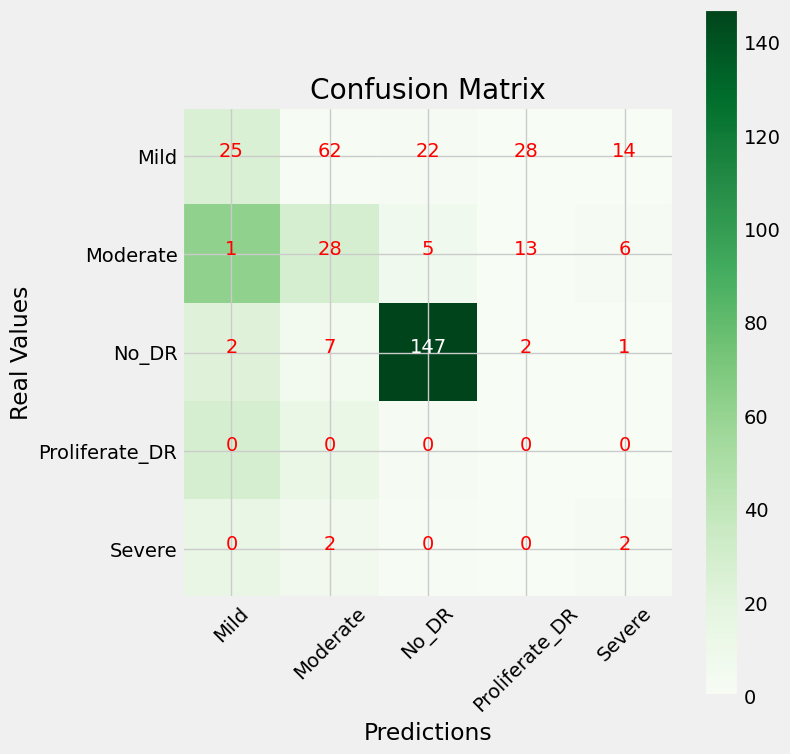

In [32]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Clahe Images

In [17]:
predictions = model32.predict(Test_clahe)
y_pred = np.argmax(predictions, axis = 1)

#Check
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 15s 674ms/step
[[7.7815535e-03 9.8117250e-01 2.9969879e-03 4.3486394e-03 3.7003432e-03]
 [1.1153447e-05 3.0946067e-05 9.9995029e-01 6.7838623e-06 7.1220330e-07]
 [2.3240142e-03 3.6259191e-03 9.9305385e-01 8.8653906e-04 1.0961556e-04]
 ...
 [1.0114732e-03 4.7341420e-04 9.9838161e-01 1.0878520e-04 2.4657505e-05]
 [2.5826260e-01 6.3047904e-01 3.0589063e-02 5.9166875e-02 2.1502463e-02]
 [4.6400027e-04 9.9806863e-01 4.8923434e-04 6.3922553e-04 3.3893640e-04]]
[1 2 2 1 1 2 1 1 2 4 0 2 2 1 2 1 1 2 1 2 2 1 1 1 1 1 2 2 2 2 2 2 1 2 1 2 0
 1 1 2 1 1 1 1 2 2 2 2 1 1 2 1 2 2 2 2 2 1 1 2 1 4 2 2 2 1 1 1 1 1 2 2 1 2
 2 2 1 1 1 2 2 1 1 1 2 2 2 4 2 2 1 2 2 1 1 2 2 1 2 2 1 2 1 2 1 2 1 2 1 1 1
 2 1 1 2 2 2 2 1 1 1 2 1 1 2 2 2 2 1 1 2 1 2 0 1 1 2 2 2 1 1 2 2 2 2 1 2 2
 2 1 1 1 1 2 2 2 2 1 2 1 1 2 2 1 1 2 2 0 2 1 1 2 1 1 1 2 2 2 1 1 2 2 1 2 2
 2 1 1 1 2 1 2 2 1 1 2 1 1 2 2 2 2 1 1 2 1 1 1 1 1 1 1 1 1 2 1 2 2 1 1 1 1
 1 2 1 2 2 1 1 2 1 1 1 1 1 1 1 4 1 2 0 2 1 2 1 2 1 1 1 1 2 1 1 2

In [18]:
# dataframe
results_inceptionc_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/inception_clahe_results.csv'

# Save the DataFrame to a CSV file
results_inceptionc_df.to_csv(csv_file_path, index=False)

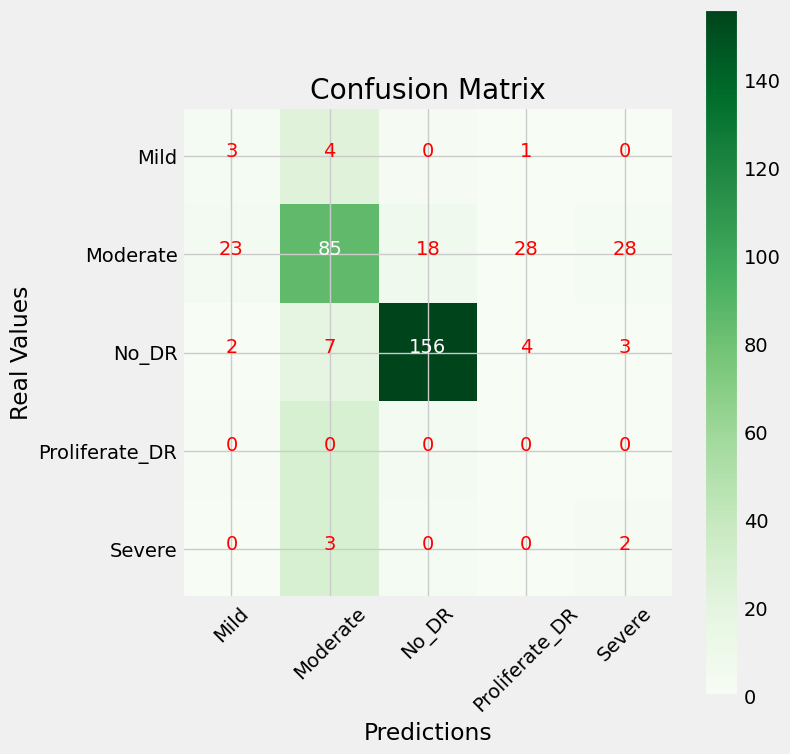

In [19]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_clahe.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_clahe.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Gaussian Images

In [14]:
predictions = model22.predict(Test_gaussian)
y_pred = np.argmax(predictions, axis = 1)

#Check
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 12s 518ms/step
[[3.78901362e-02 1.03984196e-02 9.34427798e-01 9.28538200e-03
  7.99819920e-03]
 [2.19831727e-02 2.67420355e-02 2.48760916e-04 5.79357846e-03
  9.45232451e-01]
 [2.36158050e-03 1.95052859e-03 9.95593846e-01 8.12411818e-05
  1.28359188e-05]
 ...
 [3.04531830e-04 1.31157576e-03 9.98366773e-01 1.31245015e-05
  3.93929986e-06]
 [1.02752959e-10 4.71376449e-09 1.00000000e+00 1.50503984e-11
  1.23513168e-12]
 [7.22628236e-02 7.08269477e-01 1.60433918e-01 1.88613366e-02
  4.01723832e-02]]
[2 4 2 1 1 2 1 1 4 1 0 2 2 1 2 2 2 2 2 2 2 1 1 1 1 1 1 2 2 2 2 2 1 1 1 2 0
 1 1 1 2 1 2 1 2 2 2 4 0 0 2 1 1 2 2 2 2 1 1 2 1 1 2 1 2 1 1 1 2 1 2 2 2 2
 2 2 1 1 1 1 2 1 1 2 2 1 1 1 2 2 1 2 2 1 1 1 2 1 2 1 2 2 1 1 1 1 2 2 1 1 0
 1 1 1 2 1 2 2 1 1 1 2 1 1 2 2 2 2 2 1 1 1 2 1 1 1 2 2 1 2 2 2 1 2 2 1 1 2
 2 2 4 1 1 2 2 2 1 1 2 2 1 2 2 1 1 2 2 1 2 1 1 2 2 1 1 2 2 2 1 1 2 1 2 1 2
 2 1 2 2 2 1 2 1 1 2 2 4 2 2 0 2 2 1 1 2 1 1 2 1 2 2 1 0 1 2 4 2 2 1 1 2 0
 1 2 2 2 2 1 2 2 1 1 4

In [15]:
# dataframe
results_inceptiong_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/inception_gaussian_results.csv'

# Save the DataFrame to a CSV file
results_inceptiong_df.to_csv(csv_file_path, index=False)

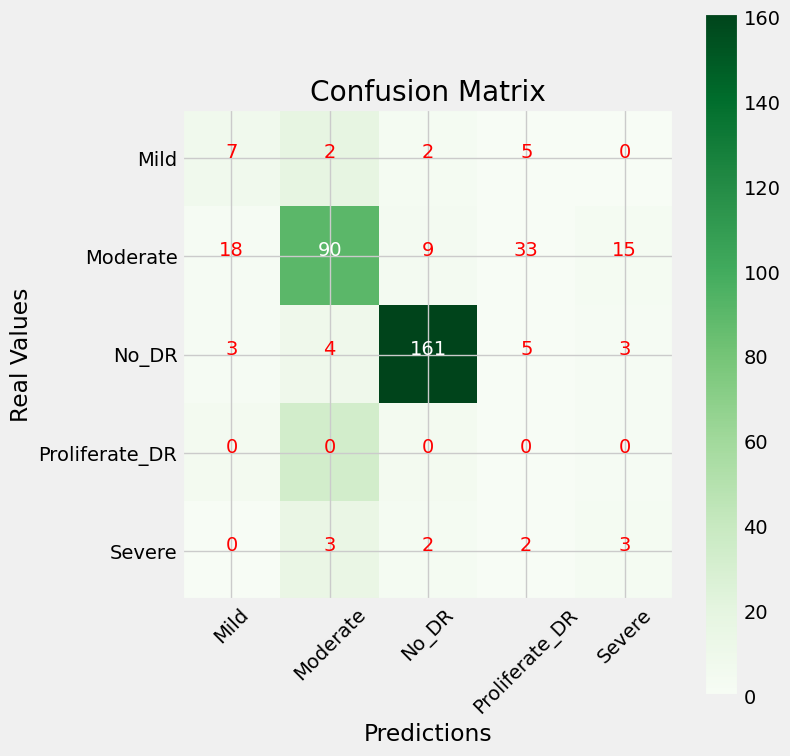

In [16]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_gaussian.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_gaussian.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

## 4. EfficientNet

### Original Images

In [15]:
predictions = model31.predict(Test)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 567ms/step
[[5.2657711e-06 1.0428062e-01 7.4741712e-07 3.8294900e-05 9.2403030e-01]
 [1.4338367e-04 6.5062935e-08 9.9999040e-01 1.4531274e-08 5.9166069e-08]
 [3.0069004e-04 1.3649506e-07 9.9995512e-01 8.7456463e-08 4.4555279e-09]
 ...
 [1.9651832e-04 4.2344735e-07 9.9986136e-01 1.2551085e-06 5.4679231e-07]
 [1.1704006e-03 8.7399453e-01 1.4469837e-04 2.2033496e-04 2.2299871e-01]
 [1.8967330e-04 9.8851746e-01 7.1508734e-04 2.0346286e-04 4.1090555e-02]]
[4 2 2 2 1 2 3 0 1 1 0 2 2 1 2 1 3 2 4 2 2 2 3 1 1 4 2 2 2 2 2 2 3 2 1 2 0
 1 1 2 2 3 3 1 2 2 2 1 0 0 2 3 3 2 2 2 2 1 1 2 0 1 2 2 2 3 1 1 1 1 2 2 3 2
 2 2 0 1 3 2 2 1 0 1 2 2 1 1 2 2 0 2 2 1 1 0 2 1 2 2 3 2 4 2 0 2 2 2 4 2 1
 2 1 1 2 3 2 2 1 1 1 2 3 1 2 2 2 2 0 1 2 2 2 1 4 4 2 2 4 2 3 2 2 2 2 1 2 2
 2 3 2 4 0 2 2 2 2 1 2 2 1 2 2 1 2 2 2 1 2 1 0 2 4 4 1 2 2 2 3 0 2 2 2 2 2
 2 2 1 1 2 2 2 2 0 2 2 2 3 2 2 2 2 1 0 2 1 3 1 1 1 1 3 1 1 2 0 2 2 1 2 2 0
 2 2 2 2 2 1 4 2 1 0 4 1 0 3 2 3 1 2 1 2 4 2 1 2 3 1 0 1 2 0 1 2

In [16]:
# dataframe
results_eff_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/eff_org_results.csv'

# Save the DataFrame to a CSV file
results_eff_df.to_csv(csv_file_path, index=False)

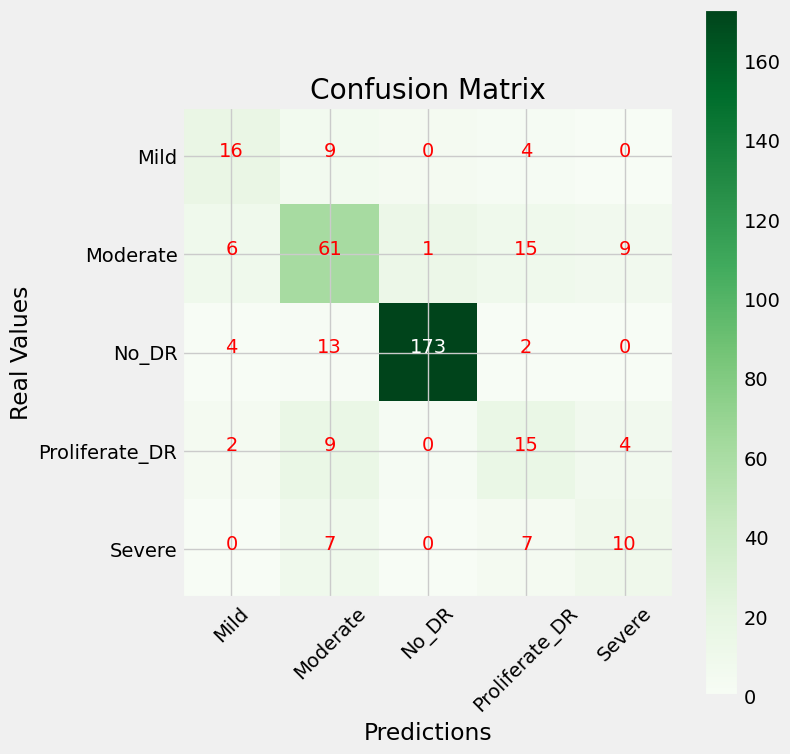

In [17]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Clahe Images

In [32]:
predictions = model32.predict(Test_clahe)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 549ms/step
[[2.4558171e-03 6.7650473e-01 1.0382529e-04 5.7992303e-01 1.1468073e-02]
 [3.2259410e-11 8.7725223e-09 1.0000000e+00 1.0219620e-12 1.7682653e-07]
 [3.7632621e-09 1.3769017e-11 9.9999994e-01 8.1126925e-11 6.2929502e-11]
 ...
 [3.4818659e-06 1.0018127e-05 9.9999952e-01 2.9322317e-07 8.7806775e-06]
 [7.7321970e-01 1.1478289e-03 2.1110903e-01 7.6689110e-03 4.1001502e-05]
 [7.5084739e-03 9.2414838e-01 1.9657568e-04 2.1270560e-02 1.1275097e-02]]
[1 2 2 2 1 2 0 1 1 4 0 2 2 1 2 3 3 2 4 2 2 1 4 0 1 1 2 2 2 2 2 2 1 2 1 2 0
 1 1 2 1 4 3 0 2 2 2 4 0 3 2 1 4 2 2 2 2 3 3 2 1 1 2 3 2 3 1 1 1 3 2 2 3 2
 2 2 1 0 4 2 2 3 0 1 2 2 3 1 2 2 0 2 2 3 3 2 2 1 2 2 4 2 4 2 0 2 2 2 4 2 4
 2 1 1 2 0 2 2 1 1 4 2 4 0 2 2 2 2 1 1 2 1 2 0 4 1 2 2 2 0 3 2 2 2 2 4 2 2
 2 4 1 4 1 2 2 2 2 1 2 2 1 3 2 1 1 2 2 1 2 1 0 2 4 1 1 2 2 2 0 0 2 2 2 2 2
 2 3 1 0 2 0 2 2 0 2 2 2 3 2 2 2 2 1 0 2 0 0 3 1 4 4 4 3 3 2 3 2 2 1 3 2 0
 4 2 2 2 2 4 4 2 1 0 3 1 1 3 3 4 3 2 0 2 4 2 1 2 0 1 3 3 2 0 1 2

In [33]:
# dataframe
results_eff_clahe_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/eff_clahe_results.csv'

# Save the DataFrame to a CSV file
results_eff_clahe_df.to_csv(csv_file_path, index=False)

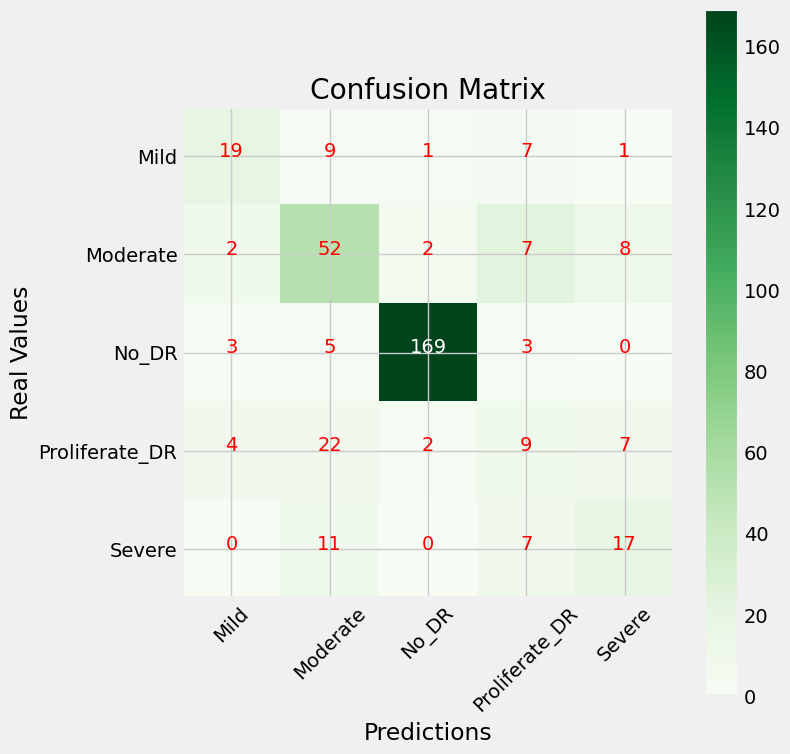

In [34]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_clahe.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_clahe.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Gaussian Images

In [21]:
predictions = model33.predict(Test_gaussian)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 549ms/step
[[5.2792416e-06 4.5679943e-07 1.0000000e+00 3.7284016e-03 4.0128413e-07]
 [6.3191887e-06 1.2878511e-02 9.9408362e-07 5.1306095e-02 9.2742366e-01]
 [3.0337381e-07 7.6357153e-08 9.9998486e-01 2.5687257e-07 1.3319081e-07]
 ...
 [9.8004690e-05 1.6162237e-05 9.9952209e-01 6.5103535e-07 6.3288905e-07]
 [6.9378894e-13 3.6112493e-23 1.0000000e+00 7.6612837e-13 2.9161929e-21]
 [5.5646467e-01 3.8006672e-01 6.6610887e-03 1.2263270e-03 1.4855112e-02]]
[2 4 2 1 1 2 1 2 4 1 0 2 2 1 0 2 2 2 2 2 2 1 1 1 1 4 1 2 2 2 2 2 1 2 1 2 0
 4 0 1 2 1 2 1 2 2 2 2 0 2 2 1 1 2 2 2 1 1 1 2 1 2 2 4 3 1 0 1 2 1 2 2 2 2
 2 2 1 1 1 2 2 1 0 4 2 4 1 1 2 2 4 2 2 1 1 1 2 1 2 1 2 2 1 3 1 3 2 2 1 2 3
 2 1 1 2 3 2 2 1 4 1 2 3 1 2 2 2 2 1 1 2 1 2 2 3 1 2 2 1 2 3 2 1 2 2 1 2 2
 2 2 1 1 4 2 2 2 1 4 2 2 1 2 2 1 0 2 2 4 2 1 0 2 2 1 3 2 2 2 1 2 4 2 2 3 2
 2 2 2 2 2 0 2 4 1 2 2 2 2 2 3 2 2 1 0 2 1 1 3 1 1 2 1 1 1 2 4 2 2 0 1 2 0
 1 2 2 2 2 1 2 2 0 0 4 3 0 3 0 2 2 2 1 2 1 2 1 2 1 0 4 1 1 1 1 0

In [22]:
# dataframe
results_eff_gauss_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/eff_gauss_results.csv'

# Save the DataFrame to a CSV file
results_eff_gauss_df.to_csv(csv_file_path, index=False)

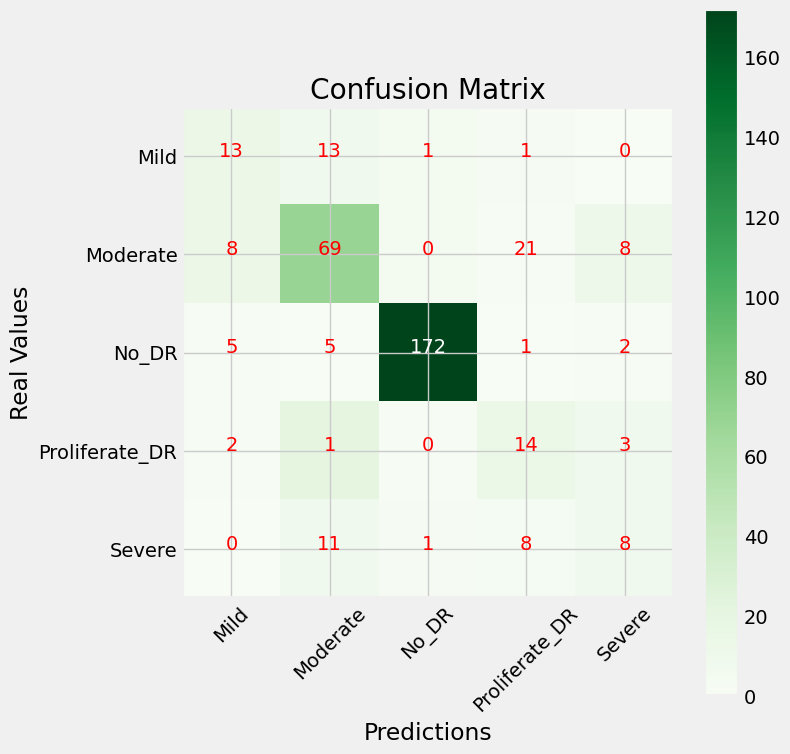

In [23]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_gaussian.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_gaussian.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

## 5. MobileNet

### Original Images

In [13]:
predictions = model51.predict(Test)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step
[[5.1951924e-06 2.9789461e-03 1.7965494e-06 2.1057791e-01 7.8643620e-01]
 [1.0091906e-13 1.9530762e-14 1.0000000e+00 3.9258535e-16 3.0940914e-14]
 [2.1663520e-15 1.6588588e-16 1.0000000e+00 7.5123447e-16 6.7011999e-15]
 ...
 [8.5432057e-18 2.5448615e-19 1.0000000e+00 9.5407012e-20 6.5550527e-18]
 [9.0251351e-04 9.7507542e-01 6.4588647e-05 5.2176053e-03 1.8739862e-02]
 [4.0225048e-05 9.9664450e-01 1.7493612e-05 1.3751049e-03 1.9227605e-03]]
[4 2 2 2 1 2 3 1 3 1 2 2 2 1 2 1 4 2 4 2 2 2 3 3 1 1 2 2 2 2 2 2 2 2 1 2 0
 1 1 2 3 4 3 1 2 2 2 3 1 0 2 3 4 2 2 2 2 1 1 2 3 1 2 1 2 3 1 1 1 1 2 2 0 2
 2 2 3 1 3 2 2 1 0 1 2 2 1 4 2 2 1 2 2 1 3 1 2 1 2 2 1 2 4 2 0 2 2 2 1 2 1
 2 1 1 2 3 2 2 1 1 1 2 3 1 2 2 2 2 1 1 2 2 2 1 1 3 2 2 4 2 1 2 2 2 2 1 2 2
 2 0 0 1 1 2 2 2 2 1 2 2 3 2 2 1 1 2 2 1 2 1 0 2 1 1 1 2 2 2 3 0 2 2 2 2 2
 2 2 1 1 2 0 2 2 1 2 2 2 3 2 2 2 2 1 0 2 0 1 2 1 1 1 3 0 1 2 1 2 2 1 0 2 0
 3 2 2 2 2 1 3 2 1 0 4 3 2 3 0 1 3 2 0 2 1 2 1 2 3 1 1 3 2 1 1 2 

In [14]:
# dataframe
results_mob_org_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/mob_org_results.csv'

# Save the DataFrame to a CSV file
results_mob_org_df.to_csv(csv_file_path, index=False)

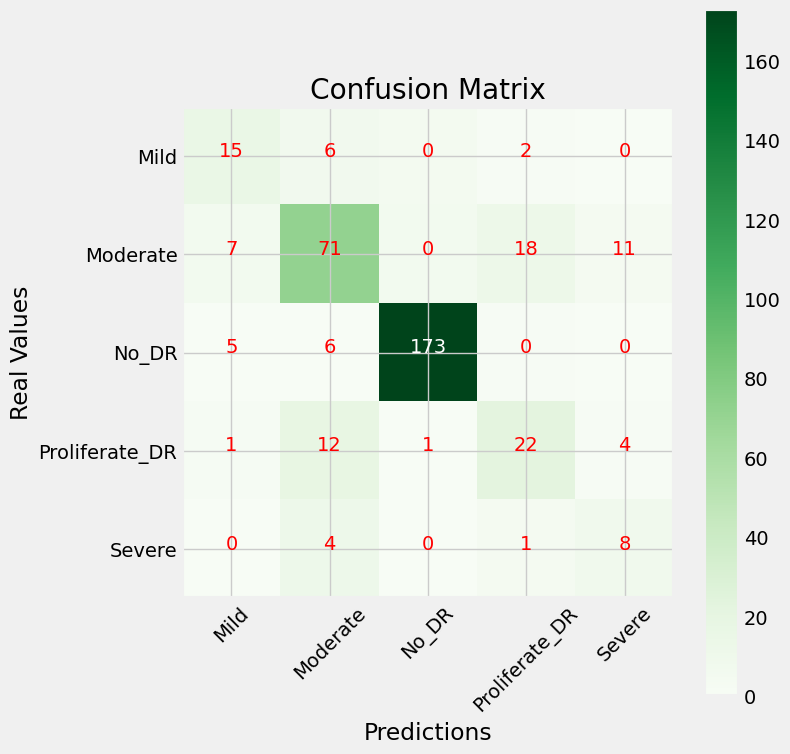

In [15]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Clahe Images

In [ ]:
predictions = model52.predict(Test_clahe)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 235ms/step
[[1.1705452e-02 7.5744021e-01 2.1261213e-04 1.9111259e-01 3.9529171e-02]
 [6.1394875e-11 2.7175356e-15 1.0000000e+00 4.3918883e-15 1.1809701e-15]
 [6.6007000e-09 2.7694644e-15 1.0000000e+00 1.9392877e-12 5.1984862e-14]
 ...
 [2.4204985e-06 2.6860421e-12 9.9999762e-01 1.4359848e-10 1.9531973e-11]
 [1.9724703e-01 2.6123459e-04 7.9951775e-01 2.9028167e-03 7.1201444e-05]
 [2.4713454e-01 6.4379692e-01 8.7031638e-03 9.4292976e-04 9.9422455e-02]]
[1 2 2 2 1 2 0 2 4 0 0 2 2 1 2 3 3 2 1 2 2 0 1 0 0 1 2 2 2 2 2 2 0 2 1 2 0
 2 0 2 3 4 1 1 2 2 2 4 0 1 2 1 4 2 2 2 2 4 0 2 0 1 2 2 2 1 1 1 1 1 2 2 0 2
 2 2 2 0 3 2 2 1 2 0 2 2 4 4 2 2 0 2 2 0 4 0 2 1 2 2 4 2 4 2 0 2 2 2 1 2 4
 2 0 0 2 0 2 2 1 1 4 2 0 0 2 2 2 2 4 1 2 2 2 0 1 1 2 2 2 2 3 2 2 2 2 4 2 2
 2 4 2 1 4 2 2 2 2 1 2 2 3 2 2 1 2 2 2 0 2 1 2 2 4 1 3 2 2 2 0 0 2 2 2 2 2
 2 2 4 1 2 0 2 2 0 2 2 2 3 2 2 2 2 1 2 2 2 0 0 1 1 4 1 0 3 2 2 2 2 1 2 2 0
 1 2 2 2 2 4 3 2 1 0 3 4 2 3 2 4 2 2 2 2 1 2 1 2 2 1 0 4 2 0 3 2 

In [ ]:
# dataframe
results_mob_clahe_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/mob_clahe_results.csv'

# Save the DataFrame to a CSV file
results_mob_clahe_df.to_csv(csv_file_path, index=False)

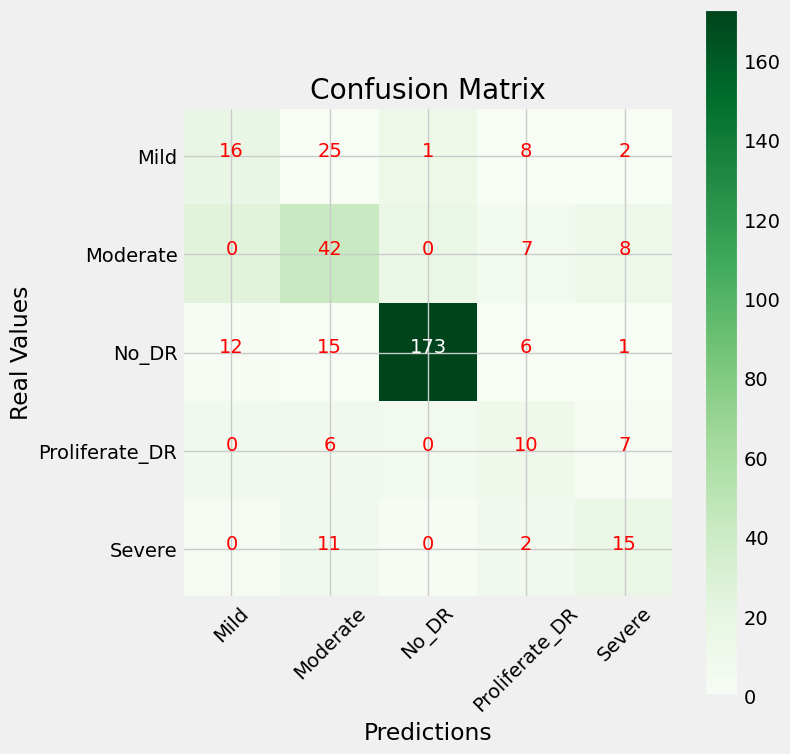

In [ ]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_clahe.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_clahe.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

### Gaussian Images

In [23]:
predictions = model53.predict(Test_gaussian)
y_pred = np.argmax(predictions, axis = 1)

#Chack
print(predictions)
print(y_pred)

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 221ms/step
[[7.79695868e-01 1.10311404e-01 9.29397121e-02 9.84613667e-04
  1.60684194e-02]
 [8.46129569e-06 5.71019113e-01 2.45607089e-06 2.01105326e-01
  2.27864578e-01]
 [2.74282694e-08 3.90722921e-09 1.00000000e+00 5.30695132e-08
  8.04394440e-10]
 ...
 [6.05089880e-08 9.69266267e-09 9.99999881e-01 1.42340695e-09
  1.82951029e-10]
 [5.53440884e-07 5.64616448e-06 9.99993682e-01 2.68702554e-08
  2.88772584e-09]
 [2.36847132e-01 7.05597579e-01 5.74102998e-02 1.38797419e-04
  6.27846430e-06]]
[0 1 2 1 1 2 1 1 1 1 1 2 2 1 2 2 2 2 2 2 2 1 1 1 1 1 1 2 2 2 2 2 1 1 1 2 0
 1 1 1 2 0 1 1 2 2 2 2 0 0 2 3 1 2 2 2 3 1 1 2 1 0 2 1 3 1 0 1 2 1 2 2 2 2
 2 2 1 1 1 2 2 1 1 1 2 1 1 0 2 2 1 2 2 1 1 1 2 2 2 1 2 2 1 3 1 1 2 2 1 2 1
 2 1 1 2 0 2 2 1 1 3 2 1 1 2 2 2 2 2 0 2 1 2 2 1 1 2 2 1 2 3 2 1 2 2 1 0 2
 2 2 1 1 3 2 2 2 1 1 2 2 1 2 2 0 1 2 2 1 2 1 0 2 3 1 3 2 2 2 1 0 1 2 2 3 2
 2 2 1 2 2 1 2 3 1 2 2 0 2 2 1 2 2 1 0 2 0 1 1 0 1 2 1 0 1 2 1 2 2 1 1 2 0
 1 2 2 2 2 1 2 2 1 1 4 

In [24]:
# dataframe
results_mob_gauss_df = pd.DataFrame({'Prediction': y_pred})

# Specify the file path to save the CSV file
csv_file_path = 'results/mob_gauss_results.csv'

# Save the DataFrame to a CSV file
results_mob_gauss_df.to_csv(csv_file_path, index=False)

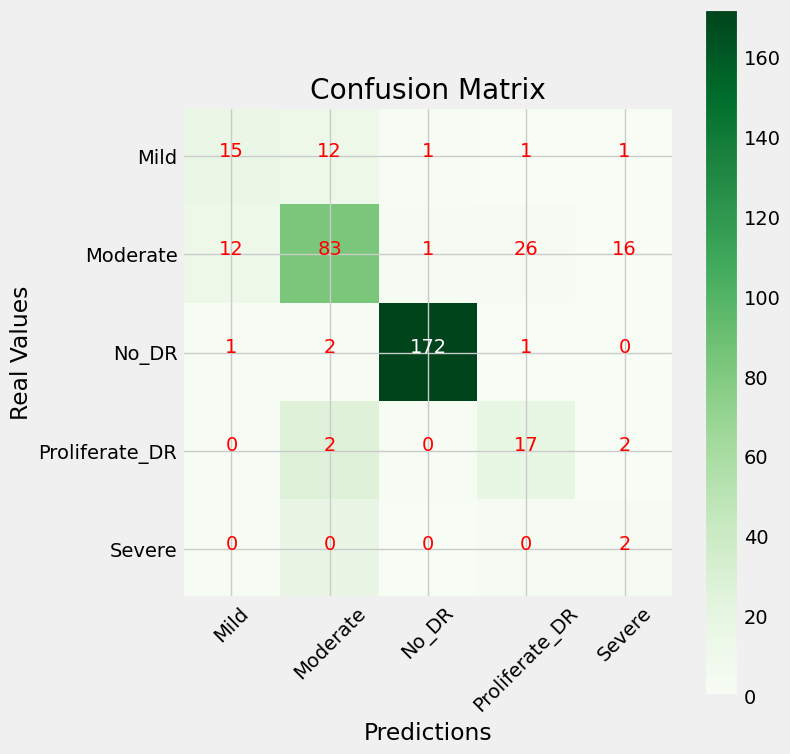

In [25]:
# Use n. of keys of  Class indices to greate confusion matrix
Test_cl_ind = Test_gaussian.class_indices
 
# Get Keys
classes = list(Test_cl_ind.keys())

#CM
cm = confusion_matrix(Test_gaussian.classes, y_pred)

plt.figure(figsize =(8, 8))
plt.imshow(cm, interpolation = 'nearest', cmap = plt.cm.Greens)
plt.title("Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes,rotation = 45)
plt.yticks(tick_marks, classes)

thresh = cm.max()/2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(i, j, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i,j] > thresh  else 'red')
    
plt.tight_layout()
plt.xlabel('Predictions')
plt.ylabel('Real Values')
plt.show()

# Save Model

## 1. Resnet50

In [18]:
model.save('models/resnet50.keras')

In [28]:
modelC.save('models/resnet50_clahe.keras')

In [ ]:
modelG.save('models/resnet50_gaussian.keras')

## 2. VGG--16

In [19]:
model11.save('models/VGG.keras')

In [19]:
model21.save('models/VGG_clahe.keras')

In [19]:
model23.save('models/VGG_gaussian.keras')

## 3. Inception

In [33]:
model31.save('models/Inception.keras')

In [21]:
model32.save('models/Inception_clahe.keras')

In [17]:
model22.save('models/Inception_gaussian.keras')

## 4. EfficientNet

In [18]:
model31.save('models/EfficientNet.keras')

In [35]:
model32.save('models/EfficientNet_clahe.keras')

In [24]:
model33.save('models/EfficientNet_gaussian.keras')

## 5. MobileNet

In [16]:
model51.save('models/MobileNet.keras')

In [43]:
model52.save('models/MobileNet_clahe.keras')

In [26]:
model53.save('models/MobileNet_gaussian.keras')

# Objective 3

## Contours method

In [ ]:
def drawingContours(image_paths):
    # Set the minimum and maximum area thresholds to filter out small and large contours
    min_area_threshold = 100  # Adjust this value as needed
    max_area_threshold = 15000  # Adjust this value as needed

    # Create a figure for displaying the images with contours
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # Loop through each image path
    for idx, image_path in enumerate(image_paths):
        # Load the image using OpenCV
        image = cv2.imread(image_path)

        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Apply thresholding to create a binary image
        _, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

        # Find contours in the binary image
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # List to hold filtered contours
        filtered_contours = []

        # Loop through the contours and filter based on size
        for contour in contours:
            area = cv2.contourArea(contour)
            # Keep the contour if its area is within the specified range
            if min_area_threshold <= area <= max_area_threshold:
                filtered_contours.append(contour)

        # Draw the filtered contours on the original image
        contour_color = (0, 255, 0)  # Green color for highlighting
        contour_thickness = 2
        cv2.drawContours(image, filtered_contours, -1, contour_color, contour_thickness)

        # Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image with contours using Matplotlib
        axes[idx].imshow(image_rgb)
        axes[idx].set_title(f'Image {idx + 1} with Contours')
        axes[idx].axis('off')  # Hide the axes

    # Display the figure
    plt.show()

In [37]:
def drawingContours2(image_path):
    # Load the fundus image using OpenCV
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE for contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray_image)

    # Apply Gaussian blur to smooth the image
    blurred_image = cv2.GaussianBlur(enhanced_image, (5, 5), 0)

    # Apply adaptive thresholding to create a binary mask
    binary_mask = cv2.adaptiveThreshold(
        blurred_image,
        255,
        cv2.ADAPTIVE_THRESH_MEAN_C,
        cv2.THRESH_BINARY,
        blockSize=11,
        C=2
    )

    # Apply morphological operations to clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    opened_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Set a minimum and maximum area threshold to filter out small and large contours
    min_area_threshold = 100  # Adjust this value as needed
    max_area_threshold = 400  # Adjust this value as needed

    # List to hold filtered contours
    filtered_contours = []

    # Loop through the contours and filter based on size
    for contour in contours:
        area = cv2.contourArea(contour)
        # Keep the contour if its area is within the specified range
        if min_area_threshold <= area <= max_area_threshold:
            filtered_contours.append(contour)

    # Draw the filtered contours on the original image
    contour_color = (0, 255, 0)  # Green color for highlighting
    contour_thickness = 2
    cv2.drawContours(image, filtered_contours, -1, contour_color, contour_thickness)

    # Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image_rgb

## Mild

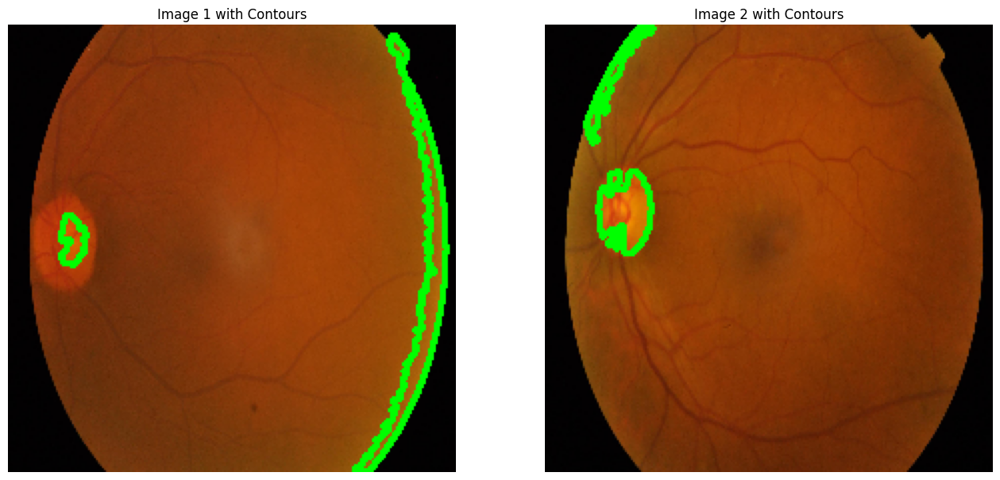

In [50]:
# Define the paths to the two images
image_paths = [
     Path_data + '/Mild/0024cdab0c1e.png',  # Replace with the path to your first image
     Path_data + '/Mild/00cb6555d108.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

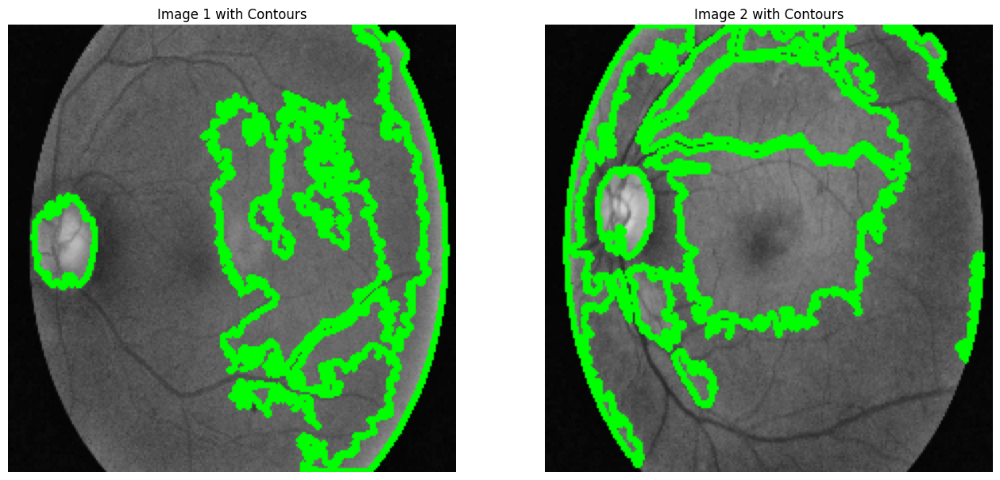

In [51]:
# Define the paths to the two images
image_paths = [
     Path_data_clahe + '/Mild/0024cdab0c1e.png',  # Replace with the path to your first image
     Path_data_clahe + '/Mild/00cb6555d108.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

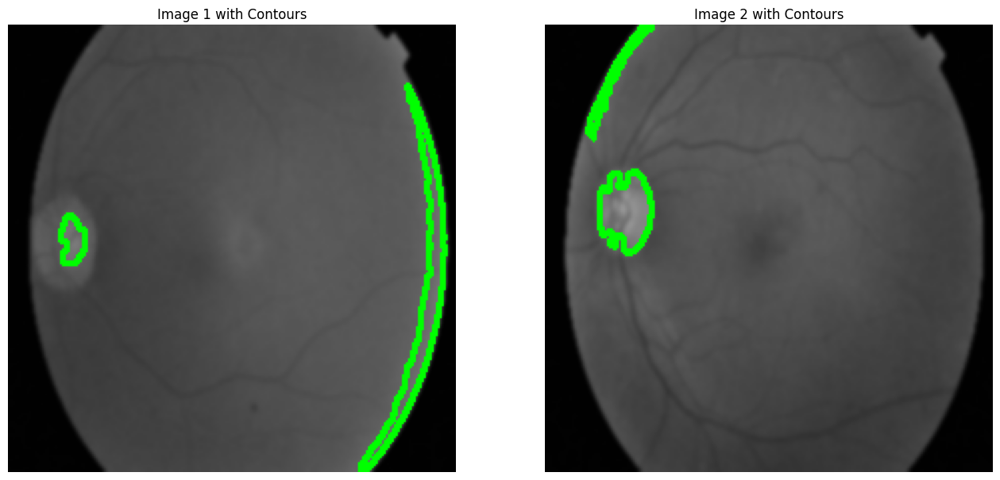

In [52]:
# Define the paths to the two images
image_paths = [
     Path_data_gaussian + '/Mild/0024cdab0c1e.png',  # Replace with the path to your first image
     Path_data_gaussian + '/Mild/00cb6555d108.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

## Moderate

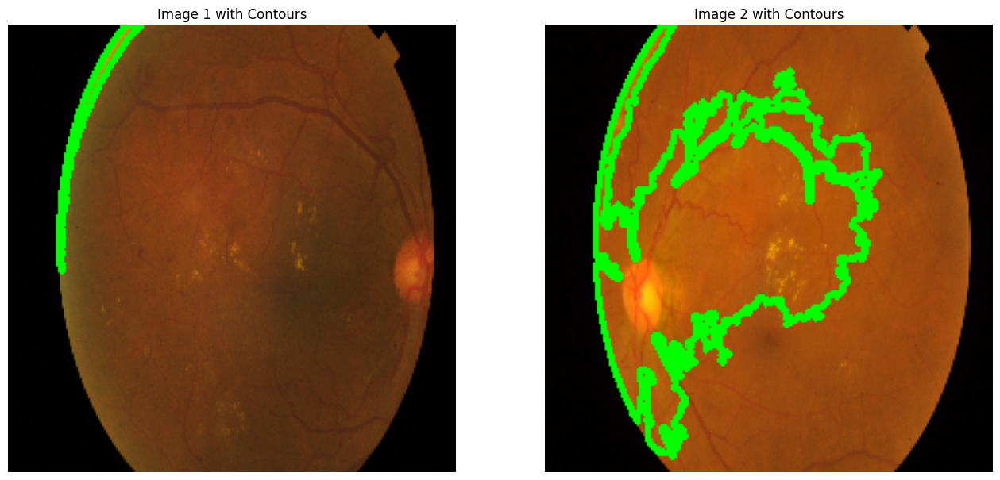

In [47]:
# Define the paths to the two images
image_paths = [
     Path_data + '/Moderate/000c1434d8d7.png',  # Replace with the path to your first image
     Path_data + '/Moderate/00a8624548a9.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

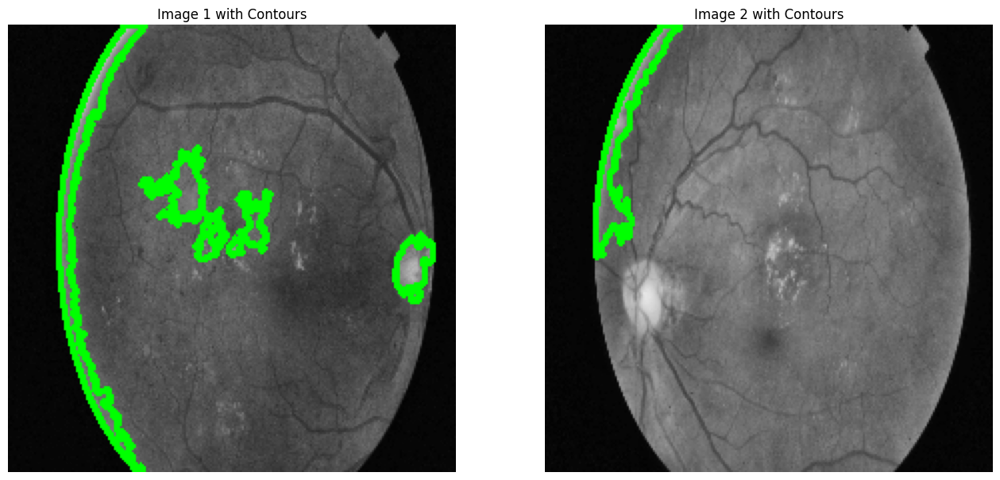

In [48]:
# Define the paths to the two images
image_paths = [
     Path_data_clahe + '/Moderate/000c1434d8d7.png',  # Replace with the path to your first image
     Path_data_clahe + '/Moderate/00a8624548a9.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

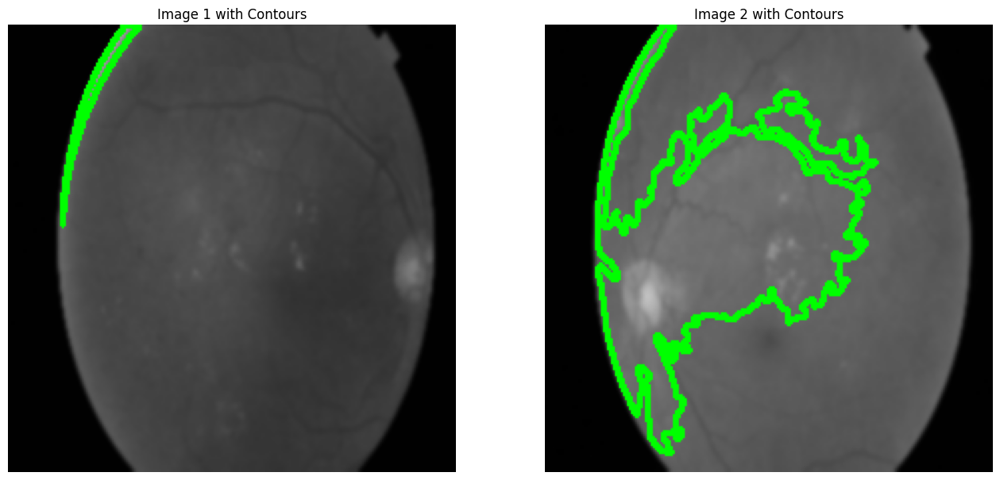

In [49]:
# Define the paths to the two images
image_paths = [
     Path_data_gaussian + '/Moderate/000c1434d8d7.png',  # Replace with the path to your first image
     Path_data_gaussian + '/Moderate/00a8624548a9.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

## Healthy

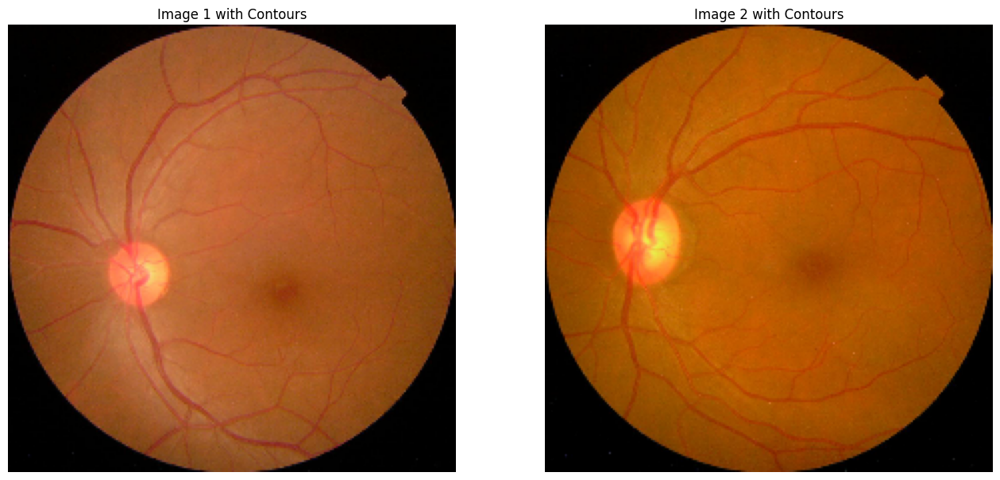

In [36]:
# Define the paths to the two images
image_paths = [
     Path_data + '/No_DR/002c21358ce6.png',  # Replace with the path to your first image
     Path_data + '/No_DR/0125fbd2e791.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

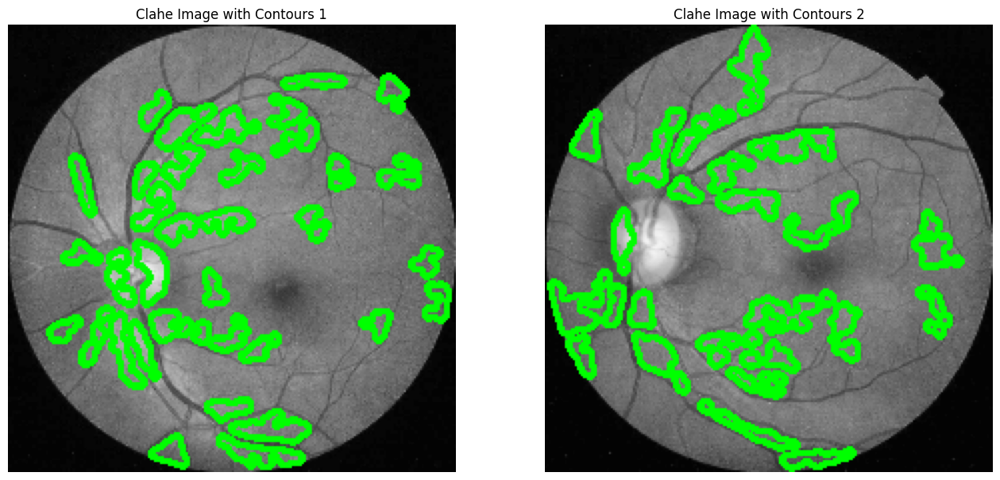

In [38]:
# Define the paths to the two images
image_paths = [
     Path_data_clahe + '/No_DR/002c21358ce6.png',  
     Path_data_clahe + '/No_DR/0125fbd2e791.png'   
]

# Create a figure for displaying the images with contours
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Process and display contours for each image
for idx, image_path in enumerate(image_paths):
    # Process the image and get the image with contours
    image_rgb = drawingContours2(image_path)

    # Display the image with contours using Matplotlib
    axes[idx].imshow(image_rgb)
    axes[idx].set_title(f'Clahe Image with Contours {idx + 1}')
    axes[idx].axis('off')  # Hide the axes

# Display the figure
plt.show()


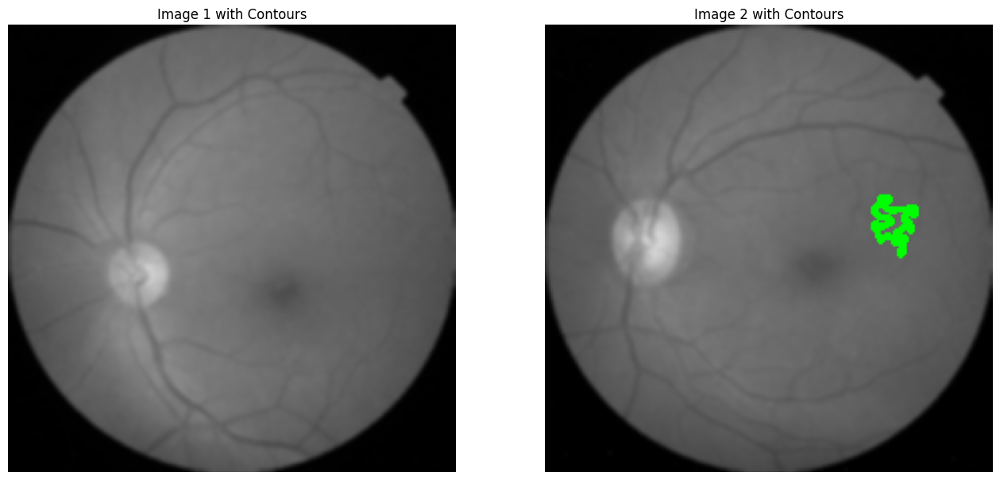

In [39]:
# Define the paths to the two images
image_paths = [
     Path_data_gaussian + '/No_DR/002c21358ce6.png',  # Replace with the path to your first image
     Path_data_gaussian + '/No_DR/0125fbd2e791.png'   # Replace with the path to your second image
]

drawingContours(image_paths)


## Proliferate

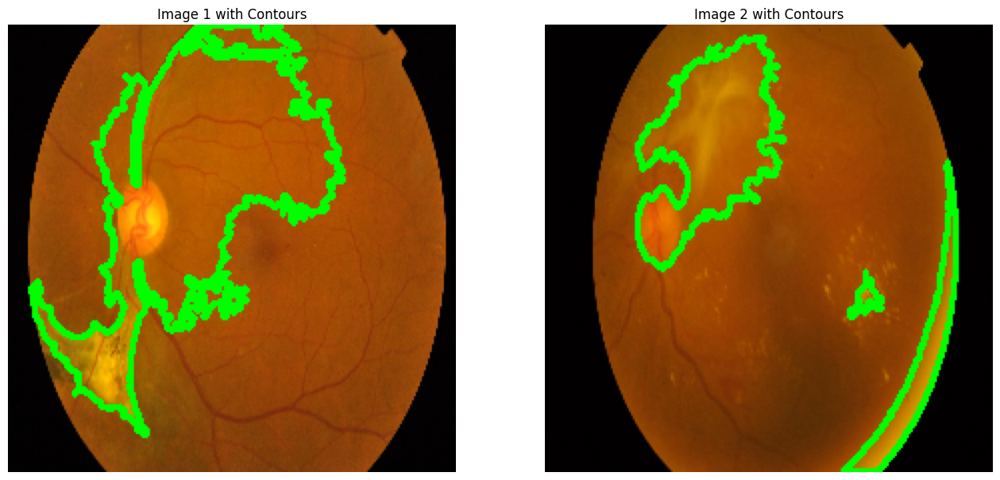

In [40]:
# Define the paths to the two images
image_paths = [
     Path_data + '/Proliferate_DR/080f66eedfb9.png',  # Replace with the path to your first image
     Path_data + '/Proliferate_DR/02685f13cefd.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

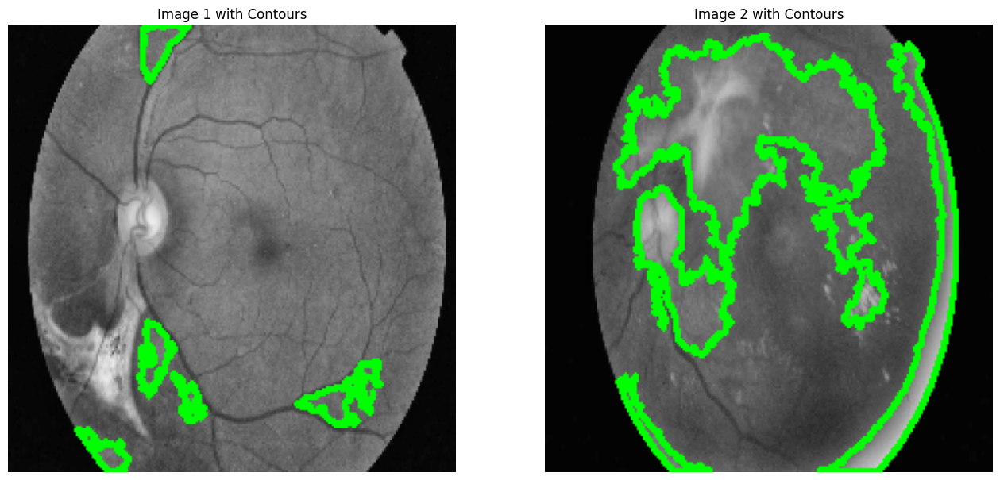

In [46]:
# Define the paths to the two images
image_paths = [
     Path_data_clahe + '/Proliferate_DR/080f66eedfb9.png',  # Replace with the path to your first image
     Path_data_clahe + '/Proliferate_DR/02685f13cefd.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

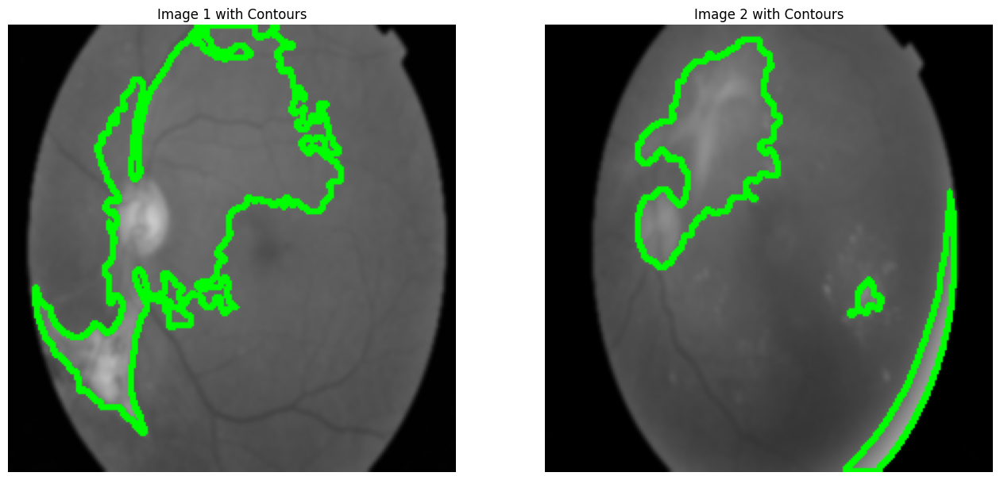

In [45]:
# Define the paths to the two images
image_paths = [
     Path_data_gaussian + '/Proliferate_DR/080f66eedfb9.png',  # Replace with the path to your first image
     Path_data_gaussian + '/Proliferate_DR/02685f13cefd.png'   # Replace with the path to your second image
]

drawingContours(image_paths)

## Severe

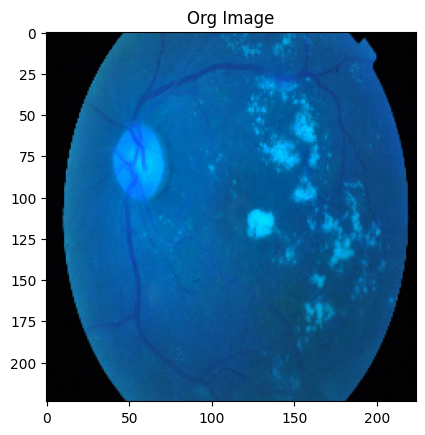

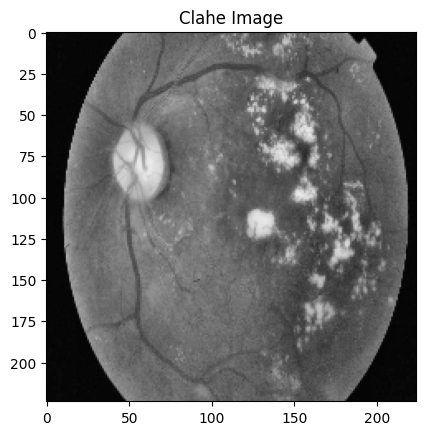

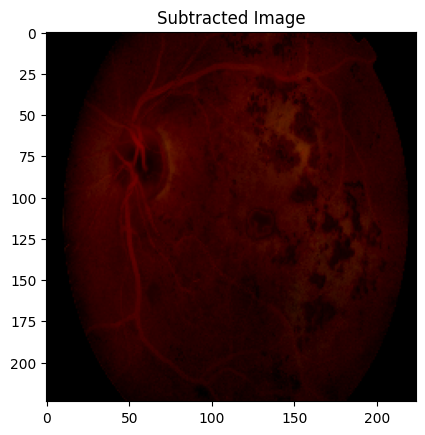

In [17]:
# Load images using OpenCV
image1_path = Path_data + '/Severe/0104b032c141.png'
image2_path = Path_data_clahe + '/Severe/0104b032c141.png'

image1 = cv2.imread(image1_path)
image2 = cv2.imread(image2_path)

# Convert the image from BGR to grayscale
# image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
# image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Display the images using matplotlib
plt.imshow(image1)
plt.title('Org Image')
plt.show()

plt.imshow(image2)
plt.title('Clahe Image')
plt.show()

# Ensure the images have the same shape
if image1.shape == image2.shape:

    # Subtract the images using OpenCV's subtract function
    image_subtracted = cv2.subtract(image1, image2)
    
    # Convert the image from BGR (OpenCV's default color format) to RGB
    image_subtracted_rgb = cv2.cvtColor(image_subtracted, cv2.COLOR_BGR2RGB)
    
    # Display the subtracted image using matplotlib
    plt.imshow(image_subtracted_rgb)
    plt.title('Subtracted Image')
    plt.show()
else:
    print("Images do not have the same shape.")


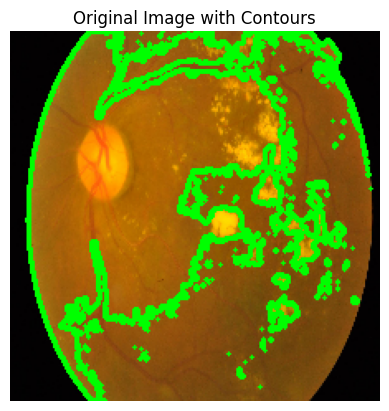

In [32]:
# Load the diabetic retinopathy image using OpenCV
image_path = Path_data + '/Severe/0104b032c141.png'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to create a binary image
# You can adjust the threshold value (second parameter) and the method (first parameter) as needed
_, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
# You can customize the color (e.g., (0, 255, 0) for green) and thickness of the contours
contour_color = (0, 255, 0)  # Green color
contour_thickness = 2
cv2.drawContours(image, contours, -1, contour_color, contour_thickness)

# Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image with contours using Matplotlib
plt.imshow(image_rgb)
plt.title('Original Image with Contours')
plt.axis('off')  # Hide the axes
plt.show()


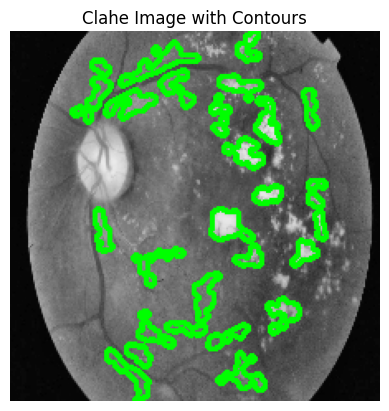

In [33]:
# Load the fundus image using OpenCV
image_path = Path_data_clahe + '/Severe/0104b032c141.png'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced_image = clahe.apply(gray_image)

# Apply Gaussian blur to smooth the image
blurred_image = cv2.GaussianBlur(enhanced_image, (5, 5), 0)

# Apply adaptive thresholding to create a binary mask
binary_mask = cv2.adaptiveThreshold(
    blurred_image,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY,
    blockSize=11,
    C=2
)

# Apply morphological operations to clean up the mask
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
opened_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

# Find contours in the binary mask
contours, _ = cv2.findContours(opened_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Set a minimum area threshold to filter out small contours
min_area_threshold = 100  # Adjust this value as needed
max_area_threshold = 400

# List to hold filtered contours
filtered_contours = []

# Loop through the contours and filter out small ones
for contour in contours:
    # Calculate the area of the contour
    area = cv2.contourArea(contour)
    # Keep the contour if its area is above the minimum area threshold
    if area > min_area_threshold and area <= max_area_threshold:
        filtered_contours.append(contour)

# Draw the filtered contours on the original image
contour_color = (0, 255, 0)  # Green color for highlighting
contour_thickness = 2
cv2.drawContours(image, filtered_contours, -1, contour_color, contour_thickness)

# Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image with highlighted retinopathy areas using Matplotlib
plt.imshow(image_rgb)
plt.title('Clahe Image with Contours')
plt.axis('off')  # Hide the axes
plt.show()


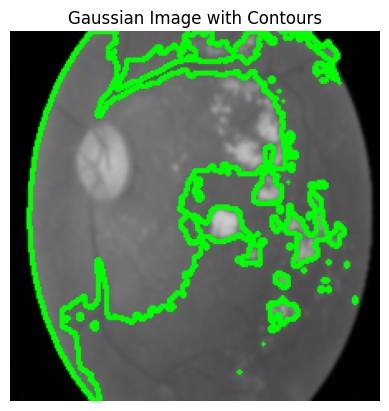

In [34]:
# Load the diabetic retinopathy image using OpenCV
image_path = Path_data_gaussian + '/Severe/0104b032c141.png'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to create a binary image
# You can adjust the threshold value (second parameter) and the method (first parameter) as needed
_, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
# You can customize the color (e.g., (0, 255, 0) for green) and thickness of the contours
contour_color = (0, 255, 0)  # Green color
contour_thickness = 2
cv2.drawContours(image, contours, -1, contour_color, contour_thickness)

# Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image with contours using Matplotlib
plt.imshow(image_rgb)
plt.title('Gaussian Image with Contours')
plt.axis('off')  # Hide the axes
plt.show()

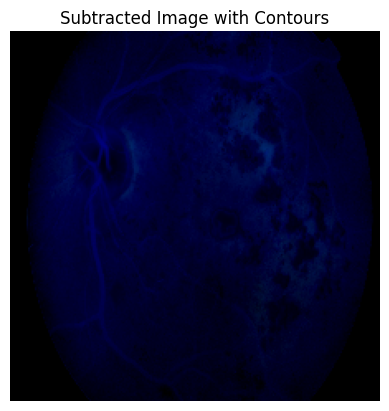

In [19]:
# Load the diabetic retinopathy image using OpenCV
image = image_subtracted_rgb

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to create a binary image
# You can adjust the threshold value (second parameter) and the method (first parameter) as needed
_, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
# You can customize the color (e.g., (0, 255, 0) for green) and thickness of the contours
contour_color = (0, 255, 0)  # Green color
contour_thickness = 2
cv2.drawContours(image, contours, -1, contour_color, contour_thickness)

# Convert the image from BGR (OpenCV format) to RGB for displaying in Matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image with contours using Matplotlib
plt.imshow(image_rgb)
plt.title('Subtracted Image with Contours')
plt.axis('off')  # Hide the axes
plt.show()

### Save all images

In [5]:
# Set the input and output directories
input_dir = 'Lab 2 Dataset/clahe_images/Severe/'  # Directory containing the input images
output_dir = 'Lab 2 Dataset/contours/'  # Directory to save the output images

# Set the area threshold to filter out small contours
area_threshold = 100  # Adjust this value as needed

# Get the list of image filenames in the input directory
image_filenames = os.listdir(input_dir)

# Iterate through each image filename
for filename in image_filenames:
    # Construct the full path to the input image
    image_path = os.path.join(input_dir, filename)

    # Load the image using OpenCV
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to create a binary image
    _, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # List to hold filtered contours
    filtered_contours = []

    # Loop through the contours and filter out small ones
    for contour in contours:
        # Calculate the area of the contour
        area = cv2.contourArea(contour)
        # Keep the contour if its area is above the threshold
        if area > area_threshold:
            filtered_contours.append(contour)

    # Draw the filtered contours on the original image
    # Customize the color (e.g., (0, 255, 0) for green) and thickness of the contours
    contour_color = (0, 255, 0)  # Green color
    contour_thickness = 2
    cv2.drawContours(image, filtered_contours, -1, contour_color, contour_thickness)

    # Construct the full path to the output image
    output_image_path = os.path.join(output_dir, filename)

    # Save the image with contours
    cv2.imwrite(output_image_path, image)

print("All images with contours have been saved.")


All images with contours have been saved.


In [ ]:
import shutil
import os

# Path to the folder you want to zip
folder_to_zip = '/home/studio-lab-user/sagemaker-studiolab-notebooks/Diabetic Retinopathy Detection'

# Name and path of the resulting zip file
output_zip_file = 'Diabetic Retinopathy.zip'

# Create the zip file
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', folder_to_zip)

print(f"Folder {folder_to_zip} has been zipped into {output_zip_file}")
